# Predict rents for Cologne
Dataset: https://www.kaggle.com/corrieaar/apartment-rental-offers-in-germany

The dataset contains a collection of immoscout24 data for rents in Germany.

The dataset contains a collection of immoscout24 data for rents in Germany.The data was scraped from Immoscout24, the biggest real estate platform in Germany. Immoscout24 has listings for both rental properties and homes for sale, however, the data only contains offers for rental properties.ImmobilienScout24* (or short: ImmoScout), is one of the largest real estate platform in Germany

At a given time, all available offers were scraped from the site and saved. This process was repeated three times, so the data set contains offers from the dates 2018-09-22, 2019-05-10 and 2019-10-08.

Common info about Cologne districts: We will analyze our data and find out the rent in a particular location in the city center. Which district in the city is the most expensive? Which is less expensive?

There are 9 Districts in Köln these are

District 1 Köln-Innenstadt---City part: Altstadt-Nord, Altstadt-Süd, Deutz, Neustadt-Nord, Neustadt-Süd

District 2 Köln-Rodenkirchen---City part: Bayenthal, Godorf, Hahnwald, Immendorf, Marienburg, Meschenich, Raderberg, Raderthal, Rodenkirchen, Rondorf, Sürth, Weiß, Zollstock

District 3 Köln-Lindenthal---City part: Braunsfeld, Junkersdorf, Klettenberg, Lindenthal, Lövenich, Müngersdorf, Sülz, Weiden, Widdersdorf

District 4 Köln-Ehrenfeld---City part: Bickendorf, Bocklemünd/Mengenich, Ehrenfeld, Neuehrenfeld, Ossendorf, Vogelsang

District 5 Köln-Nippes---City part: Bilderstöckchen, Longerich, Mauenheim, Niehl, Nippes, Riehl, Weidenpesch

District 6 Köln-Chorweiler---City part: Blumenberg, Chorweiler, Esch/Auweiler, Fühlingen, Heimersdorf, Lindweiler, Merkenich, Pesch, Roggendorf/Thenhoven, Seeberg, Volkhoven/Weiler, Worringen

District 7 Köln-porz---City part: Eil, Elsdorf, Ensen, Finkenberg, Gremberghoven, Grengel, Langel, Libur, Lind, Poll, Porz, Urbach, Wahn, Wahnheide, Westhoven, Zündorf

District 8 Köln-Kalk ---City part: Brück, Höhenberg, Humboldt/Gremberg, Kalk, Merheim, Neubrück, Ostheim, Rath/Heumar, Vingst

District 9 Köln-Müllheim---City part: Buchforst, Buchheim, Dellbrück, Dünnwald, Flittard, Höhenhaus, Holweide, Mülheim, Stammheim

Task:

Task Number 1: First, reduce the data to the urban area of Cologne. Perform the usual steps in a machine learning project. Create a predictive model that predicts the rent as well as possible for the given data.

Task Number 2: create visualizations (correlation graph) and more interesting relationships.

Task Number 3: Compare different methods for incorporating non-metric features and different algorithms. Investigate which features have a measurable impact on rent.

# Import all necessary packages 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy
import seaborn as sns
from scipy.stats import norm
from collections import Counter
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from collections import Counter
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import precision_recall_curve, roc_auc_score, confusion_matrix

In [2]:
Deutschland_rents_Predict = pd.read_csv("immo_data.csv")

In [3]:
Deutschland_rents_Predict

,regio1,serviceCharge,heatingType,telekomTvOffer,telekomHybridUploadSpeed,newlyConst,balcony,picturecount,pricetrend,telekomUploadSpeed,...,regio2,regio3,description,facilities,heatingCosts,energyEfficiencyClass,lastRefurbish,electricityBasePrice,electricityKwhPrice,date
0,Nordrhein_Westfalen,245.00,central_heating,ONE_YEAR_FREE,NaN,False,False,6,4.62,10.0,...,Dortmund,Schüren,Die ebenerdig zu erreichende Erdgeschosswohnun...,Die Wohnung ist mit Laminat ausgelegt. Das Bad...,NaN,NaN,NaN,NaN,NaN,May19
1,Rheinland_Pfalz,134.00,self_contained_central_heating,ONE_YEAR_FREE,NaN,False,True,8,3.47,10.0,...,Rhein_Pfalz_Kreis,Böhl_Iggelheim,Alles neu macht der Mai – so kann es auch für ...,NaN,NaN,NaN,2019.0,NaN,NaN,May19
2,Sachsen,255.00,floor_heating,ONE_YEAR_FREE,10.0,True,True,8,2.72,2.4,...,Dresden,Äußere_Neustadt_Antonstadt,Der Neubau entsteht im Herzen der Dresdner Neu...,"* 9 m² Balkon\n* Bad mit bodengleicher Dusche,...",NaN,NaN,NaN,NaN,NaN,Oct19
3,Sachsen,58.15,district_heating,ONE_YEAR_FREE,NaN,False,True,9,1.53,40.0,...,Mittelsachsen_Kreis,Freiberg,Abseits von Lärm und Abgasen in Ihre neue Wohn...,NaN,87.23,NaN,NaN,NaN,NaN,May19
4,Bremen,138.00,self_contained_central_heating,NaN,NaN,False,True,19,2.46,NaN,...,Bremen,Neu_Schwachhausen,Es handelt sich hier um ein saniertes Mehrfami...,Diese Wohnung wurde neu saniert und ist wie fo...,NaN,NaN,NaN,NaN,NaN,Feb20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
268845,Bayern,90.00,heat_pump,ONE_YEAR_FREE,NaN,False,True,0,2.74,10.0,...,Weilheim_Schongau_Kreis,Eberfing,"Diese schöne, neuwertige Wohnung im Dachgescho...",Fliesen und Parkett. Sichtbarer Dachstuhl.,NaN,NaN,NaN,NaN,NaN,Feb20
268846,Hessen,220.00,gas_heating,NaN,NaN,False,True,12,6.49,NaN,...,Bergstraße_Kreis,Viernheim,Hier wird eine Wohnung im 2 Familienhaus angeb...,"Parkett, Kamin, Badewanne&Dusche\nGroßer Balko...",NaN,NaN,2015.0,NaN,NaN,May19
268847,Hessen,220.00,central_heating,ONE_YEAR_FREE,NaN,False,True,21,2.90,40.0,...,Limburg_Weilburg_Kreis,Limburg_an_der_Lahn,gemütliche 4-Zimmer-Wohnung im Obergeschoss ei...,"Böden: Wohn-/Schlafbereich = Laminat, Küche + ...",NaN,NaN,2019.0,NaN,NaN,Feb20
268848,Nordrhein_Westfalen,175.00,heat_pump,NaN,NaN,True,True,16,4.39,NaN,...,Köln,Dellbrück,"Neubau Erstbezug, gehobener Standard, alle Ein...","Wände:\nMaler­vlies, weiß gestrichen alter­nat...",40.00,NO_INFORMATION,2019.0,NaN,NaN,May19


In our dataset, we have overall 268850 rows and 49 columns 


# Checking the number of rows and columns

In [4]:
#The shape is used to indicate the number of rows and columns in the dataset.
print(Deutschland_rents_Predict.shape)

(268850, 49)


In [5]:
# These 3 columns represent the TotalRent, BaseRent and HeatingCosts
Deutschland_rents_Predict_miete = Deutschland_rents_Predict.loc[:, ["baseRent", "totalRent","heatingCosts"]]
Deutschland_rents_Predict_miete.info()

# Normally we should use the TotalRent column as Price column but,
# because we have a lot of missing values in the HeatingCosts column it is impossible to determine the TotalRent
# without loosing the data.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 268850 entries, 0 to 268849
Data columns (total 3 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   baseRent      268850 non-null  float64
 1   totalRent     228333 non-null  float64
 2   heatingCosts  85518 non-null   float64
dtypes: float64(3)
memory usage: 6.2 MB


In [6]:
# Let's see what we have there
Deutschland_rents_Predict.totalRent.describe()

count    2.283330e+05
mean     9.013315e+02
std      3.323833e+04
min      0.000000e+00
25%      4.698000e+02
50%      6.500000e+02
75%      9.850000e+02
max      1.575154e+07
Name: totalRent, dtype: float64

In [7]:
# Let's see what we have there
Deutschland_rents_Predict.baseRent.describe()

count    2.688500e+05
mean     6.941294e+02
std      1.953602e+04
min      0.000000e+00
25%      3.380000e+02
50%      4.900000e+02
75%      7.990000e+02
max      9.999999e+06
Name: baseRent, dtype: float64

In [8]:
# Let's see what we have there
Deutschland_rents_Predict.heatingCosts.describe()

count    85518.000000
mean        76.990866
std        147.716278
min          0.000000
25%         54.000000
50%         70.000000
75%         90.000000
max      12613.000000
Name: heatingCosts, dtype: float64

In [9]:
print(Deutschland_rents_Predict.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 268850 entries, 0 to 268849
Data columns (total 49 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   regio1                    268850 non-null  object 
 1   serviceCharge             261941 non-null  float64
 2   heatingType               223994 non-null  object 
 3   telekomTvOffer            236231 non-null  object 
 4   telekomHybridUploadSpeed  45020 non-null   float64
 5   newlyConst                268850 non-null  bool   
 6   balcony                   268850 non-null  bool   
 7   picturecount              268850 non-null  int64  
 8   pricetrend                267018 non-null  float64
 9   telekomUploadSpeed        235492 non-null  float64
 10  totalRent                 228333 non-null  float64
 11  yearConstructed           211805 non-null  float64
 12  scoutId                   268850 non-null  int64  
 13  noParkSpaces              93052 non-null   f

In [10]:
#Check if there are any duplicate rows
Deutschland_rents_Predict.duplicated(keep=False).sum()

0

In [11]:
Deutschland_rents_Predict.describe()

,serviceCharge,telekomHybridUploadSpeed,picturecount,pricetrend,telekomUploadSpeed,totalRent,yearConstructed,scoutId,noParkSpaces,yearConstructedRange,...,noRooms,thermalChar,floor,numberOfFloors,noRoomsRange,livingSpaceRange,heatingCosts,lastRefurbish,electricityBasePrice,electricityKwhPrice
count,261941.000000,45020.0,268850.000000,267018.000000,235492.000000,2.283330e+05,211805.000000,2.688500e+05,93052.000000,211805.000000,...,268850.000000,162344.000000,217541.000000,171118.000000,268850.000000,268850.000000,85518.000000,80711.000000,46846.000000,46846.000000
mean,151.206113,10.0,9.791958,3.389001,28.804928,9.013315e+02,1966.400590,1.069697e+08,1.327634,3.714544,...,2.641261,114.749533,2.122405,3.572319,2.571542,3.070790,76.990866,2013.904536,89.113612,0.199769
std,308.295790,0.0,6.408399,1.964874,16.337151,3.323833e+04,46.992207,1.250093e+07,8.361403,2.738134,...,2.633440,61.653663,3.634934,6.375496,0.937594,1.407127,147.716278,10.963125,5.395805,0.009667
min,0.000000,10.0,0.000000,-12.330000,1.000000,0.000000e+00,1000.000000,2.887174e+07,0.000000,1.000000,...,1.000000,0.100000,-1.000000,0.000000,1.000000,1.000000,0.000000,1015.000000,71.430000,0.170500
25%,95.000000,10.0,6.000000,2.000000,10.000000,4.698000e+02,1950.000000,1.066910e+08,1.000000,1.000000,...,2.000000,79.000000,1.000000,2.000000,2.000000,2.000000,54.000000,2012.000000,90.760000,0.191500
50%,135.000000,10.0,9.000000,3.390000,40.000000,6.500000e+02,1973.000000,1.111584e+08,1.000000,3.000000,...,3.000000,107.000000,2.000000,3.000000,3.000000,3.000000,70.000000,2017.000000,90.760000,0.198500
75%,190.000000,10.0,13.000000,4.570000,40.000000,9.850000e+02,1996.000000,1.137688e+08,1.000000,5.000000,...,3.000000,140.300000,3.000000,4.000000,3.000000,4.000000,90.000000,2019.000000,90.760000,0.205500
max,146118.000000,10.0,121.000000,14.920000,100.000000,1.575154e+07,2090.000000,1.157117e+08,2241.000000,9.000000,...,999.990000,1996.000000,999.000000,999.000000,5.000000,7.000000,12613.000000,2919.000000,90.760000,0.227600


In [12]:
Deutschland_rents_Predict.isnull().sum().max()

223830

In [13]:
Deutschland_rents_Predict['regio2']

0                        Dortmund
1               Rhein_Pfalz_Kreis
2                         Dresden
3             Mittelsachsen_Kreis
4                          Bremen
                   ...           
268845    Weilheim_Schongau_Kreis
268846           Bergstraße_Kreis
268847     Limburg_Weilburg_Kreis
268848                       Köln
268849          Frankfurt_am_Main
Name: regio2, Length: 268850, dtype: object

In [14]:
Deutschland_rents_Predict['regio2'].isna().sum()

0

# Our main goal is to Predict rents for Cologne. So need to focus on it. However, we can select the regio2 to select the city cologne 

In [15]:
# Selecting NRW
Cologne_rents_Predict = Deutschland_rents_Predict[Deutschland_rents_Predict["regio2"] == 'Köln']

In [16]:
Cologne_rents_Predict

,regio1,serviceCharge,heatingType,telekomTvOffer,telekomHybridUploadSpeed,newlyConst,balcony,picturecount,pricetrend,telekomUploadSpeed,...,regio2,regio3,description,facilities,heatingCosts,energyEfficiencyClass,lastRefurbish,electricityBasePrice,electricityKwhPrice,date
253,Nordrhein_Westfalen,NaN,NaN,ONE_YEAR_FREE,NaN,False,False,10,4.91,40.0,...,Köln,Altstadt_&_Neustadt_Nord,gepflegtes Mehrfamilienhaus,"zeitlose Möblierung, Laminatboden, separate Ei...",NaN,NaN,NaN,NaN,NaN,Feb20
336,Nordrhein_Westfalen,200.0,floor_heating,NaN,NaN,True,True,11,4.42,NaN,...,Köln,Dellbrück,Zum 01.11.2019 können Sie diese Maisonette-Woh...,"Bodentiefe Fenster, Fussbodenheizung, Fensterb...",NaN,NaN,NaN,NaN,NaN,Oct19
352,Nordrhein_Westfalen,110.0,central_heating,ONE_YEAR_FREE,NaN,False,False,4,4.55,10.0,...,Köln,Sülz,Herzlich Willkommen in Ihrem neuen Zuhause.\n\...,NaN,NaN,NaN,NaN,NaN,NaN,Oct19
524,Nordrhein_Westfalen,274.8,central_heating,ONE_YEAR_FREE,10.0,False,True,16,5.08,10.0,...,Köln,Altstadt_&_Neustadt_Nord,Diese schöne Wohnung befindet sich in bester I...,Die Wohnung ist modern ausgestattet. \n\nDas W...,NaN,NaN,NaN,90.76,0.1985,Sep18
590,Nordrhein_Westfalen,135.0,central_heating,NONE,NaN,False,True,10,4.37,2.4,...,Köln,Lövenich,ANMELDUNG FÜR BESICHTIGUNGSTERMIN\nMit dem unt...,NaN,85.0,NaN,NaN,NaN,NaN,Oct19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
268381,Nordrhein_Westfalen,151.0,NaN,ONE_YEAR_FREE,NaN,False,False,8,5.08,40.0,...,Köln,Altstadt_&_Neustadt_Süd,Dieses schicke Ein-Zimmer-Apartment liegt sehr...,Bezug: 01. Mai 2019\nObjektart: 1-Zimmer-Apart...,NaN,NaN,NaN,NaN,NaN,May19
268523,Nordrhein_Westfalen,160.0,self_contained_central_heating,ONE_YEAR_FREE,NaN,False,True,5,6.42,40.0,...,Köln,Gremberghoven,+ Barrierearm Wohlfühlen - mit einem modernen ...,Rollläden; Warmwasser zentral (über Heizanlage...,NaN,NaN,NaN,NaN,NaN,May19
268637,Nordrhein_Westfalen,130.0,central_heating,ONE_YEAR_FREE,NaN,False,False,10,4.55,40.0,...,Köln,Sülz,Die hier angebotene Wohnung befindet sich im 1...,Das neu hergestellte Duschbad wurde mit großfo...,NaN,NaN,2019.0,NaN,NaN,Oct19
268772,Nordrhein_Westfalen,230.0,floor_heating,ONE_YEAR_FREE,NaN,False,True,8,4.23,40.0,...,Köln,Junkersdorf,Diese freundliche Wohnung im zweiten Stock kan...,NaN,NaN,NaN,NaN,NaN,NaN,Feb20


# checking the first 5 records

In [17]:
Cologne_rents_Predict.head()

,regio1,serviceCharge,heatingType,telekomTvOffer,telekomHybridUploadSpeed,newlyConst,balcony,picturecount,pricetrend,telekomUploadSpeed,...,regio2,regio3,description,facilities,heatingCosts,energyEfficiencyClass,lastRefurbish,electricityBasePrice,electricityKwhPrice,date
253,Nordrhein_Westfalen,NaN,NaN,ONE_YEAR_FREE,NaN,False,False,10,4.91,40.0,...,Köln,Altstadt_&_Neustadt_Nord,gepflegtes Mehrfamilienhaus,"zeitlose Möblierung, Laminatboden, separate Ei...",NaN,NaN,NaN,NaN,NaN,Feb20
336,Nordrhein_Westfalen,200.0,floor_heating,NaN,NaN,True,True,11,4.42,NaN,...,Köln,Dellbrück,Zum 01.11.2019 können Sie diese Maisonette-Woh...,"Bodentiefe Fenster, Fussbodenheizung, Fensterb...",NaN,NaN,NaN,NaN,NaN,Oct19
352,Nordrhein_Westfalen,110.0,central_heating,ONE_YEAR_FREE,NaN,False,False,4,4.55,10.0,...,Köln,Sülz,Herzlich Willkommen in Ihrem neuen Zuhause.\n\...,NaN,NaN,NaN,NaN,NaN,NaN,Oct19
524,Nordrhein_Westfalen,274.8,central_heating,ONE_YEAR_FREE,10.0,False,True,16,5.08,10.0,...,Köln,Altstadt_&_Neustadt_Nord,Diese schöne Wohnung befindet sich in bester I...,Die Wohnung ist modern ausgestattet. \n\nDas W...,NaN,NaN,NaN,90.76,0.1985,Sep18
590,Nordrhein_Westfalen,135.0,central_heating,NONE,NaN,False,True,10,4.37,2.4,...,Köln,Lövenich,ANMELDUNG FÜR BESICHTIGUNGSTERMIN\nMit dem unt...,NaN,85.0,NaN,NaN,NaN,NaN,Oct19


# checking the last 5 records

In [18]:
Cologne_rents_Predict.tail()

,regio1,serviceCharge,heatingType,telekomTvOffer,telekomHybridUploadSpeed,newlyConst,balcony,picturecount,pricetrend,telekomUploadSpeed,...,regio2,regio3,description,facilities,heatingCosts,energyEfficiencyClass,lastRefurbish,electricityBasePrice,electricityKwhPrice,date
268381,Nordrhein_Westfalen,151.0,NaN,ONE_YEAR_FREE,NaN,False,False,8,5.08,40.0,...,Köln,Altstadt_&_Neustadt_Süd,Dieses schicke Ein-Zimmer-Apartment liegt sehr...,Bezug: 01. Mai 2019\nObjektart: 1-Zimmer-Apart...,NaN,NaN,NaN,NaN,NaN,May19
268523,Nordrhein_Westfalen,160.0,self_contained_central_heating,ONE_YEAR_FREE,NaN,False,True,5,6.42,40.0,...,Köln,Gremberghoven,+ Barrierearm Wohlfühlen - mit einem modernen ...,Rollläden; Warmwasser zentral (über Heizanlage...,NaN,NaN,NaN,NaN,NaN,May19
268637,Nordrhein_Westfalen,130.0,central_heating,ONE_YEAR_FREE,NaN,False,False,10,4.55,40.0,...,Köln,Sülz,Die hier angebotene Wohnung befindet sich im 1...,Das neu hergestellte Duschbad wurde mit großfo...,NaN,NaN,2019.0,NaN,NaN,Oct19
268772,Nordrhein_Westfalen,230.0,floor_heating,ONE_YEAR_FREE,NaN,False,True,8,4.23,40.0,...,Köln,Junkersdorf,Diese freundliche Wohnung im zweiten Stock kan...,NaN,NaN,NaN,NaN,NaN,NaN,Feb20
268848,Nordrhein_Westfalen,175.0,heat_pump,NaN,NaN,True,True,16,4.39,NaN,...,Köln,Dellbrück,"Neubau Erstbezug, gehobener Standard, alle Ein...","Wände:\nMaler­vlies, weiß gestrichen alter­nat...",40.0,NO_INFORMATION,2019.0,NaN,NaN,May19


In [19]:
Cologne_rents_Predict.shape

(2709, 49)

In [20]:
Deutschland_rents_Predict.shape

(268850, 49)

# Feature  / Column type Information 

In [21]:
print(Cologne_rents_Predict.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2709 entries, 253 to 268848
Data columns (total 49 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   regio1                    2709 non-null   object 
 1   serviceCharge             2579 non-null   float64
 2   heatingType               2314 non-null   object 
 3   telekomTvOffer            2241 non-null   object 
 4   telekomHybridUploadSpeed  429 non-null    float64
 5   newlyConst                2709 non-null   bool   
 6   balcony                   2709 non-null   bool   
 7   picturecount              2709 non-null   int64  
 8   pricetrend                2698 non-null   float64
 9   telekomUploadSpeed        2241 non-null   float64
 10  totalRent                 2277 non-null   float64
 11  yearConstructed           1972 non-null   float64
 12  scoutId                   2709 non-null   int64  
 13  noParkSpaces              935 non-null    float64
 14  firi

We got 4 types of value they are  objects, Float, bool, and int. Here is the number of type value 

1. 19 columns are Object type 
2. 18 columns are float 64 type 
3. 6 columns are bool type
4. 6 columns are int 64 type

 In our dataset we have 3 columns which are most important columns we need to know more deatils about 3  columns 
The 3 columns are 
1.Baserent
2.TotalRent 
3.Heatingcosts-Heizkosten

# Column's descriptions:

Column's descriptions:
regio1: Bundesland

serviceCharge: aucilliary costs such as electricty or internet in €

heatingType: Type of heating

telekomTvOffer: Is payed TV included if so which offer

telekomHybridUploadSpeed: how fast is the hybrid inter upload speed

newlyConst: is the building newly constructed

balcony: does the object have a balcony

picturecount: how many pictures were uploaded to the listing

pricetrend: price trend as calculated by Immoscout

telekomUploadSpeed: how fast is the internet upload speed

totalRent: total rent (usually a sum of base rent, service charge and heating cost)

yearConstructed: construction year

scoutId: immoscout Id
noParkSpaces: number of parking spaces

firingTypes: main energy sources, separated by colon

hasKitchen: has a kitchen

geo_bln: bundesland (state), same as regio1

cellar: has a cellar

yearConstructedRange: binned construction year, 1 to 9

baseRent: base rent without electricity and heating

houseNumber: house number

livingSpace: living space in sqm

geo_krs: district, above ZIP code

condition: condition of the flat

interiorQual: interior quality
petsAllowed: are pets allowed, can be yes, no or negotiable

street: street name

streetPlain: street name (plain, different formating)

lift: is elevator available

baseRentRange: binned base rent, 1 to 9

typeOfFlat: type of flat

geo_plz: ZIP code

noRooms: number of rooms

thermalChar: energy need in kWh/(m^2a), defines the energy efficiency class

floor: which floor is the flat on

numberOfFloors: number of floors in the building

noRoomsRange: binned number of rooms, 1 to 5

garden: has a garden
    
livingSpaceRange: binned living space, 1 to 7

regio2: District or Kreis, same as geo krs

regio3: City/town

description: free text description of the object

facilities: free text description about available facilities

heatingCosts: monthly heating costs in €

energyEfficiencyClass: energy efficiency class (based on binned thermalChar, deprecated since Feb 2020)

lastRefurbish: year of last renovation

electricityBasePrice: monthly base price for electricity in € (deprecated since Feb 2020)

electricityKwhPrice: electricity price per kwh (deprecated since Feb 2020)

date: time of scraping

# Checking Categorical Data

In [22]:
# Checking Categorical Data
Cologne_rents_Predict.select_dtypes(include=['object']).columns

Index(['regio1', 'heatingType', 'telekomTvOffer', 'firingTypes', 'geo_bln',
       'houseNumber', 'geo_krs', 'condition', 'interiorQual', 'petsAllowed',
       'street', 'streetPlain', 'typeOfFlat', 'regio2', 'regio3',
       'description', 'facilities', 'energyEfficiencyClass', 'date'],
      dtype='object')

# Checking Numerical Data

In [23]:
# Checking Numerical Data
Cologne_rents_Predict.select_dtypes(include=['int64','float64']).columns

Index(['serviceCharge', 'telekomHybridUploadSpeed', 'picturecount',
       'pricetrend', 'telekomUploadSpeed', 'totalRent', 'yearConstructed',
       'scoutId', 'noParkSpaces', 'yearConstructedRange', 'baseRent',
       'livingSpace', 'baseRentRange', 'geo_plz', 'noRooms', 'thermalChar',
       'floor', 'numberOfFloors', 'noRoomsRange', 'livingSpaceRange',
       'heatingCosts', 'lastRefurbish', 'electricityBasePrice',
       'electricityKwhPrice'],
      dtype='object')

In [24]:
# Checking bool Data
Cologne_rents_Predict.select_dtypes(include=['bool']).columns

Index(['newlyConst', 'balcony', 'hasKitchen', 'cellar', 'lift', 'garden'], dtype='object')

# TotalRent, BaseRent and HeatingCosts type

In [25]:
# These 3 columns represent the TotalRent, BaseRent and HeatingCosts
Cologne_rents_Predict_miete = Cologne_rents_Predict.loc[:, ["baseRent", "totalRent","heatingCosts"]]
Cologne_rents_Predict_miete.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 2709 entries, 253 to 268848
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   baseRent      2709 non-null   float64
 1   totalRent     2277 non-null   float64
 2   heatingCosts  503 non-null    float64
dtypes: float64(3)
memory usage: 84.7 KB


1. BaseRent,Total Rent and HeatingCosts are float64 type value 

In [26]:
Cologne_rents_Predict.describe()

,serviceCharge,telekomHybridUploadSpeed,picturecount,pricetrend,telekomUploadSpeed,totalRent,yearConstructed,scoutId,noParkSpaces,yearConstructedRange,...,noRooms,thermalChar,floor,numberOfFloors,noRoomsRange,livingSpaceRange,heatingCosts,lastRefurbish,electricityBasePrice,electricityKwhPrice
count,2579.000000,429.0,2709.000000,2698.000000,2241.000000,2277.000000,1972.000000,2.709000e+03,935.000000,1972.000000,...,2709.000000,1343.000000,2292.000000,2086.000000,2709.000000,2709.000000,503.000000,999.000000,4.730000e+02,473.000000
mean,188.083432,10.0,10.855666,4.698773,29.174565,1188.505459,1978.103955,1.069762e+08,1.082353,4.305274,...,2.397010,128.862748,2.302356,4.147172,2.362495,3.104836,75.762366,2015.649650,9.076000e+01,0.198485
std,109.372797,0.0,6.742537,0.560427,15.878959,625.642984,33.389889,1.302226e+07,0.830791,2.819644,...,1.028807,151.212070,2.336347,3.539962,1.015033,1.617645,57.160363,5.037274,5.690360e-14,0.000322
min,0.000000,10.0,0.000000,2.270000,2.400000,280.000000,1700.000000,3.224097e+07,0.000000,1.000000,...,1.000000,7.000000,-1.000000,0.000000,1.000000,1.000000,0.000000,1978.000000,9.076000e+01,0.191500
25%,115.000000,10.0,6.000000,4.360000,10.000000,780.730000,1961.000000,1.070247e+08,1.000000,2.000000,...,2.000000,74.950000,1.000000,3.000000,2.000000,2.000000,50.000000,2014.000000,9.076000e+01,0.198500
50%,160.000000,10.0,10.000000,4.840000,40.000000,1000.000000,1977.000000,1.113122e+08,1.000000,3.000000,...,2.000000,112.600000,2.000000,4.000000,2.000000,3.000000,70.000000,2018.000000,9.076000e+01,0.198500
75%,240.000000,10.0,14.000000,5.080000,40.000000,1440.000000,2008.000000,1.137938e+08,1.000000,7.000000,...,3.000000,152.000000,3.000000,5.000000,3.000000,4.000000,97.500000,2019.000000,9.076000e+01,0.198500
max,1350.000000,10.0,66.000000,6.850000,100.000000,5629.100000,2020.000000,1.157114e+08,20.000000,9.000000,...,6.000000,1717.900000,41.000000,45.000000,5.000000,7.000000,970.000000,2020.000000,9.076000e+01,0.198500


In [27]:
# Let's see what we have there
Cologne_rents_Predict.baseRent.describe()

count    2709.000000
mean      978.991628
std       540.963164
min       220.000000
25%       637.820000
50%       825.000000
75%      1190.000000
max      5000.000000
Name: baseRent, dtype: float64

In [28]:
# Let's see what we have there
Cologne_rents_Predict.totalRent.describe()

count    2277.000000
mean     1188.505459
std       625.642984
min       280.000000
25%       780.730000
50%      1000.000000
75%      1440.000000
max      5629.100000
Name: totalRent, dtype: float64

In [29]:
# Let's see what we have there
Cologne_rents_Predict.heatingCosts.describe()

count    503.000000
mean      75.762366
std       57.160363
min        0.000000
25%       50.000000
50%       70.000000
75%       97.500000
max      970.000000
Name: heatingCosts, dtype: float64

# Heating Type with overall number 

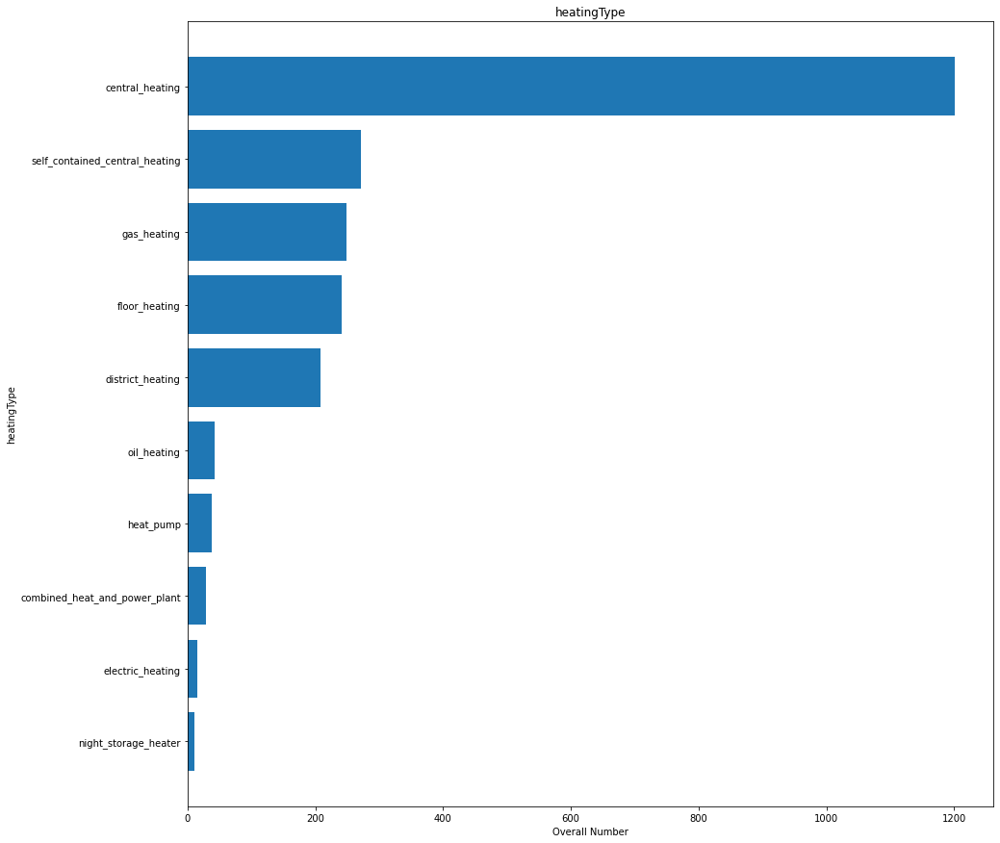

In [30]:
plt.figure(figsize=(15, 15))
our_data = Cologne_rents_Predict.heatingType.value_counts()[:10]
x = list(our_data.index)
y = list(our_data.values)
x.reverse()
y.reverse()

plt.title("heatingType")
plt.ylabel("heatingType")
plt.xlabel("Overall Number")

plt.barh(x, y)
plt.show()

1.Central heating is the essential heating type followed by self-contained central heating and the less important heating types is the night storage heater

In [31]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import plotly.express as px

#from mlxtend.plotting import plot_confusion_matrix
from plotly.offline import plot, iplot, init_notebook_mode
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import plotly.express as px
import plotly.express as px

# Creating data frame with baseRent per district in Köln

In [32]:
# Creating data frame with baseRent( Kaltemiete) per district in Köln
pie_data_output = Cologne_rents_Predict.regio3.value_counts()
pie_data_output = pd.DataFrame(pie_data_output)
pie_data_output.rename(columns = {"index": "regio3", "regio3": "baseRent"}, inplace = True)
pie_data_output

,baseRent
Altstadt_&_Neustadt_Nord,285
Altstadt_&_Neustadt_Süd,272
Lindenthal,112
Mülheim,99
Junkersdorf,85
...,...
Finkenberg,3
Fühlingen,3
Hahnwald,2
Chorweiler,2


# Pie graph based on baserent /Kaltmiete

In [33]:
# Graphing percentage of baserent (Kaltemiete) that each Köln district has with pyplot
fig = px.pie(pie_data_output, values = pie_data_output.baseRent, names = pie_data_output.index)
fig.update_traces(textposition = 'inside', textinfo = 'percent+label')
fig.update_layout(template = 'plotly_white')

fig.show()

# Creating data frame with Total Rent per district in Köln

In [34]:
# Creating data frame with Total Rent per district in Köln
pie_data_output = Cologne_rents_Predict.regio3.value_counts()
pie_data_output = pd.DataFrame(pie_data_output)
pie_data_output.rename(columns = {"index": "regio3", "regio3": "totalRent"}, inplace = True)
pie_data_output

,totalRent
Altstadt_&_Neustadt_Nord,285
Altstadt_&_Neustadt_Süd,272
Lindenthal,112
Mülheim,99
Junkersdorf,85
...,...
Finkenberg,3
Fühlingen,3
Hahnwald,2
Chorweiler,2


# pie Graph based on totalRent

In [35]:
# Graphing percentage of Total rent( Warme miete) that each Köln district has with pyplot
fig = px.pie(pie_data_output, values = pie_data_output.totalRent, names = pie_data_output.index)
fig.update_traces(textposition = 'inside', textinfo = 'percent+label')
fig.update_layout(template = 'plotly_white')
fig.show()

# Mean price by the district in Köln-Based on Total Rent (Warmemiete)

In [36]:
district_Köln = Cologne_rents_Predict[Cologne_rents_Predict["regio3"].str.contains(r"[Kk]reis") == False]
Cologne_rents_Predict_by_Köln_district = district_Köln.pivot_table(values='totalRent', index='regio3', aggfunc=(np.mean)).reset_index()
Cologne_rents_Predict_by_Köln_district = Cologne_rents_Predict_by_Köln_district.sort_values(by=['totalRent'], ascending=False)
Cologne_rents_Predict_by_Köln_district['totalRent'] = Cologne_rents_Predict_by_Köln_district['totalRent'].astype(int)

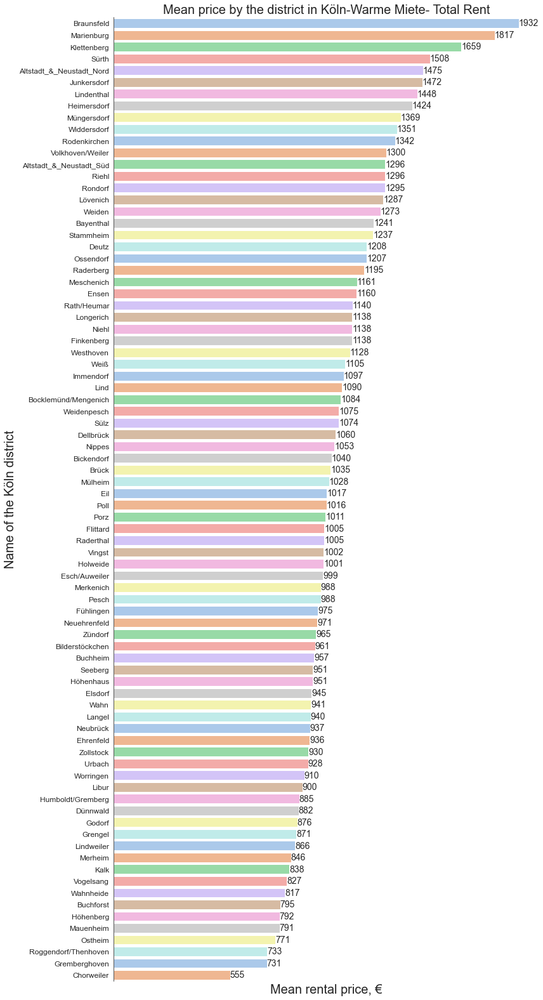

In [37]:
sns.set_style('white')

fig = plt.subplots(figsize=(12, 22))
ax = sns.barplot(x='totalRent',
                 y='regio3',
                 data=Cologne_rents_Predict_by_Köln_district,
                 orient='h',
                 palette='pastel')

# Setting the annotation on the top of the barchart
n = 0
for land, value in Cologne_rents_Predict_by_Köln_district.iterrows():
    ax.text(x=value[1],  # where to put the text on the x coordinates
            y=n,  # where to put the text on the y coordinates
            s=value[1],  # value to text
            fontsize=14,  # fontsize
            horizontalalignment='left',  # center the text to be more pleasant
            verticalalignment='center')
    n += 1

ax.tick_params(axis='x', labelsize=12, labelbottom=False)
ax.tick_params(axis='y', labelsize=12, bottom='off')
ax.set_title('Mean price by the district in Köln-Warme Miete- Total Rent', fontsize=20)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(False)


ax.set_ylabel('Name of the Köln district', fontsize=20)
ax.set_xlabel('Mean rental price, €', fontsize=20)
plt.tight_layout()

plt.show()

After examining our average pricing (Total Rent) by district in Köln, it is clear that

1. Braunsfeld, Marienburg, Klettenberg, Sürth, Altstadt_ und Neustadt nord, and so on are the most expensive districts.

2. The less expensive districts are Buchforst, Höhenberg, Mauenheim, Ostheim, Roggendorf/Thenhoven, Gremberghoven, Chorweiler, and so on.

3. X-asis denotes our average rental price, whereas Y-asis denotes the complete Köln district name.

# Mean price by the district in Köln-Based on Base Rent (kalte miete)

In [38]:
district_Köln_base = Cologne_rents_Predict[Cologne_rents_Predict["regio3"].str.contains(r"[Kk]reis") == False]
Cologne_rents_Predict_by_Köln_district_01 = district_Köln_base.pivot_table(values='baseRent', index='regio3', aggfunc=(np.mean)).reset_index()
Cologne_rents_Predict_by_Köln_district_01 = Cologne_rents_Predict_by_Köln_district_01.sort_values(by=['baseRent'], ascending=False)
Cologne_rents_Predict_by_Köln_district_01['baseRent'] = Cologne_rents_Predict_by_Köln_district_01['baseRent'].astype(int)

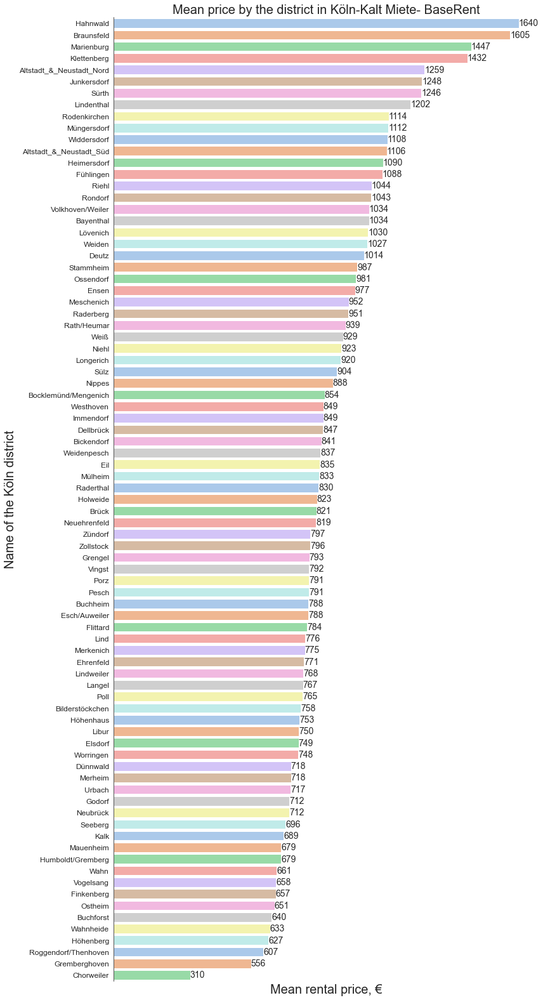

In [39]:
sns.set_style('white')

fig = plt.subplots(figsize=(12, 22))
ax = sns.barplot(x='baseRent',
                 y='regio3',
                 data=Cologne_rents_Predict_by_Köln_district_01,
                 orient='h',
                 palette='pastel')

# Setting the annotation on the top of the barchart
n = 0
for land, value in Cologne_rents_Predict_by_Köln_district_01.iterrows():
    ax.text(x=value[1],  # where to put the text on the x coordinates
            y=n,  # where to put the text on the y coordinates
            s=value[1],  # value to text
            fontsize=14,  # fontsize
            horizontalalignment='left',  # center the text to be more pleasant
            verticalalignment='center')
    n += 1

ax.tick_params(axis='x', labelsize=12, labelbottom=False)
ax.tick_params(axis='y', labelsize=12, bottom='off')
ax.set_title('Mean price by the district in Köln-Kalt Miete- BaseRent', fontsize=20)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(False)


ax.set_ylabel('Name of the Köln district', fontsize=20)
ax.set_xlabel('Mean rental price, €', fontsize=20)
plt.tight_layout()

plt.show()

After examining our average pricing (Baserent) by district in Köln, it is clear that

1. Hahnbald, Braunsfeld, Marienburg, Klettenberg, Sürth, Altstadt_ und Neustadt nord, and so on are the most expensive districts.

2. The less expensive districts are Buchforst, Wahnheide, Höhenberg, Roggendorf/Thenhoven, Gremberghoven, Chorweiler, and so on.

3. X-asis denotes our average rental price, whereas Y-asis denotes the complete Köln district name.

4. In comparison to other districts, the districts of Braunsfeld, Marienburg, and Klettenberg pay a lot of additional costs, but the district of Sürth pays a less amount of additional costs.

# Mean price based on different Street in Köln District 

In [40]:
Street_Köln = Cologne_rents_Predict[Cologne_rents_Predict["street"].str.contains(r"[Kk]reis") == False]
Cologne_rents_by_street = Street_Köln.pivot_table(values='totalRent', index='street', aggfunc=(np.mean)).reset_index()
Cologne_rents_by_street = Cologne_rents_by_street.sort_values(by=['totalRent'], ascending=False)
Cologne_rents_by_street['totalRent'] = Cologne_rents_by_street['totalRent'].astype(int)

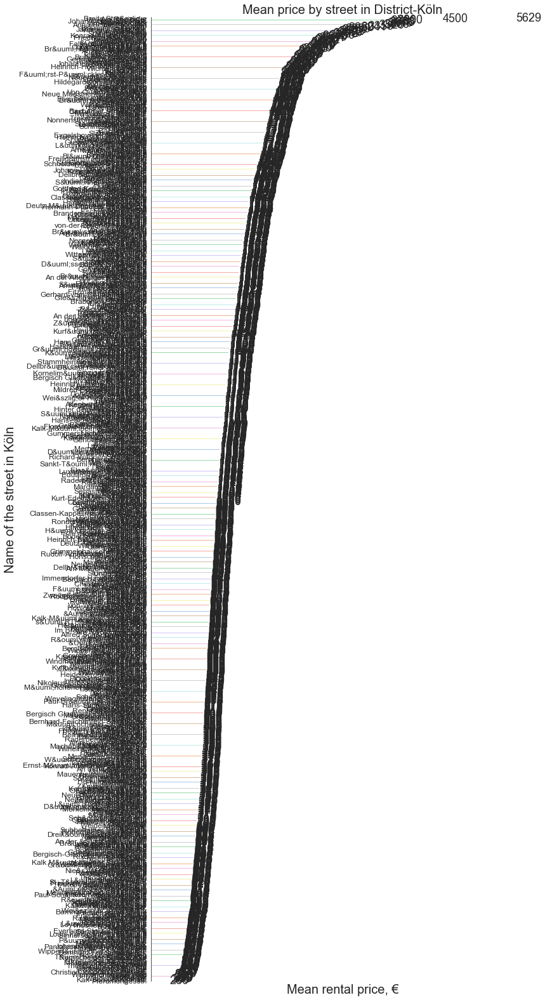

In [41]:
sns.set_style('white')

fig = plt.subplots(figsize=(12, 22))
ax = sns.barplot(x='totalRent',
                 y='street',
                 data=Cologne_rents_by_street,
                 orient='h',
                 palette='pastel')

# Setting the annotation on the top of the barchart
n = 0
for land, value in Cologne_rents_by_street.iterrows():
    ax.text(x=value[1],  # where to put the text on the x coordinates
            y=n,  # where to put the text on the y coordinates
            s=value[1],  # value to text
            fontsize=18,  # fontsize
            horizontalalignment='left',  # center the text to be more pleasant
            verticalalignment='center')
    n += 1

ax.tick_params(axis='x', labelsize= 12, labelbottom=False)
ax.tick_params(axis='y', labelsize= 12, bottom='off')
ax.set_title('Mean price by street in District-Köln', fontsize=20)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(False)


ax.set_ylabel('Name of the street in Köln', fontsize=20)
ax.set_xlabel('Mean rental price, €', fontsize=20)
plt.tight_layout()

plt.show()

We cant't see a clear idea about the mean rental prize in differnt street in Köln beacuse there are lot of missing value in our feature street and there are low of street in our street feature.

# Data Pre-Processing-Missing Value 

In [42]:
Cologne_rents_Predict.isnull().sum()

regio1                         0
serviceCharge                130
heatingType                  395
telekomTvOffer               468
telekomHybridUploadSpeed    2280
newlyConst                     0
balcony                        0
picturecount                   0
pricetrend                    11
telekomUploadSpeed           468
totalRent                    432
yearConstructed              737
scoutId                        0
noParkSpaces                1774
firingTypes                  607
hasKitchen                     0
geo_bln                        0
cellar                         0
yearConstructedRange         737
baseRent                       0
houseNumber                  842
livingSpace                    0
geo_krs                        0
condition                    562
interiorQual                 955
petsAllowed                 1073
street                         0
streetPlain                  842
lift                           0
baseRentRange                  0
typeOfFlat

The function isnull().sum() gives us the information of how many missing values we have for each column. The missing values for telekomHybridUploadSpeed, noParkSpaces, petsAllowed , heatingCosts, energyEfficiencyClass , electricityBasePrice , electricityKwhPrice, lastRefurbish , and thermalChar  seem to be a lot, and newlyConst,Balcony,picture count, scout id, street, lift, base rent range, geo_plz,noRooms ,NoRoomRange,garden,livingSpaceRange, regio2,regio3,date, balcony they have no missing value.  

However, it's not easy to know the overall shape and structure of the missing values only by looking at this information. In order to see the ratio and pattern of missing values, we can use missingno library in Python.

In [43]:
conda install -c conda-forge/label/gcc7 missingno

Solving environment: ...working... done

## Package Plan ##

  environment location: C:\ProgramData\Anaconda3

  added / updated specs:
    - missingno


The following NEW packages will be INSTALLED:

  missingno          conda-forge/label/gcc7/noarch::missingno-0.4.1-py_0


Preparing transaction: ...working... done
Verifying transaction: ...working... failed

Note: you may need to restart the kernel to use updated packages.



EnvironmentNotWritableError: The current user does not have write permissions to the target environment.
  environment location: C:\ProgramData\Anaconda3




# Install package missingno for showing  missing values using visualization.- link[https://anaconda.org/conda-forge/missingno]

In [44]:
pip install missingno

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [45]:
import missingno as msno

<AxesSubplot:>

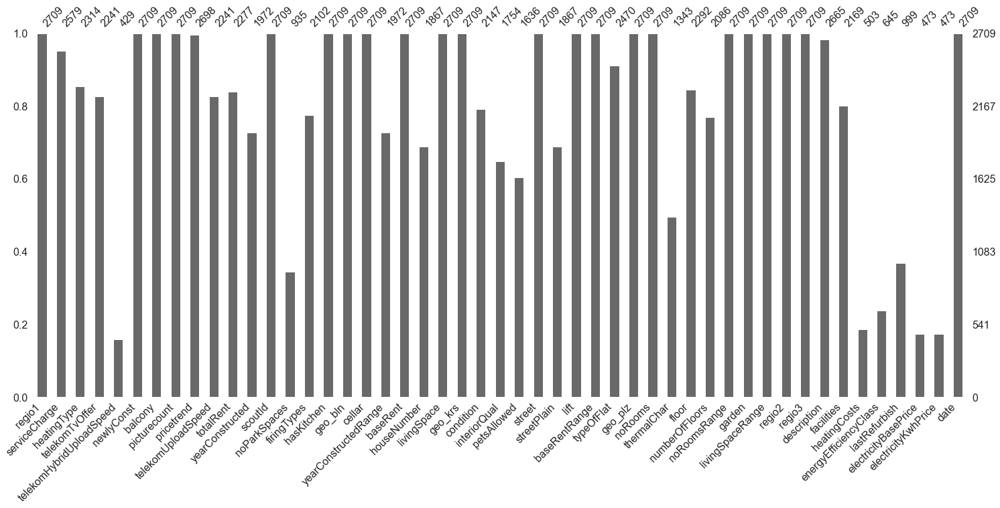

In [46]:
# show the number of missing values using visualization
msno.bar(Cologne_rents_Predict)

# Missing value with heatmap

<AxesSubplot:>

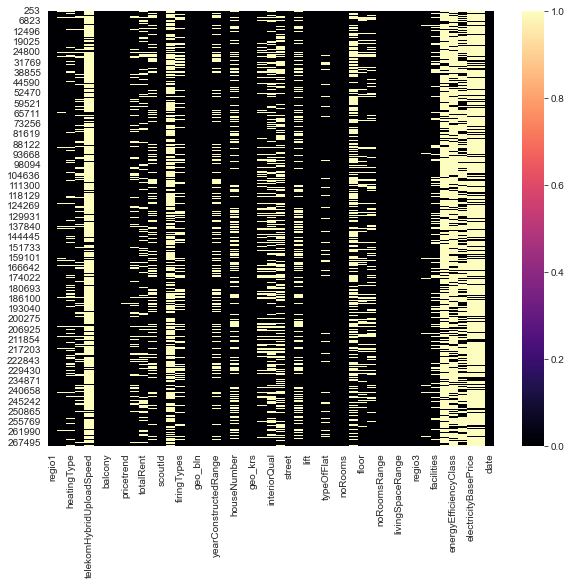

In [47]:
#Check for Missing Values with heatmap
plt.figure(figsize=(10,8))
sns.heatmap(Cologne_rents_Predict.isnull(), cmap = 'magma')

# Cleaning the Data: 
The boring part of this kernel. It might a bit confuse but what we're trying in this section is dealing with many things such as
1. Outliers
2. Missing Data
3. Drop columns
Etc. The result of this part is we will have a better dataset to analyze, virtualization and making a prediction.

In [48]:
def All_missing_values(df,norows):   # input by the df and the number of rows that you want to show
    total = Cologne_rents_Predict.isnull().sum().sort_values(ascending=False)
    percent = ((Cologne_rents_Predict.isnull().sum().sort_values(ascending=False)/Cologne_rents_Predict.shape[0])*100).sort_values(ascending=False)
    All_of_our_missing_data = pd.concat([total, percent ], axis=1, keys=['Total', 'Percent '])
    return(All_of_our_missing_data.head(norows))

In [49]:
All_missing_values (Cologne_rents_Predict,49) # we use the Cologne_rents_Predict and the number of rows to show is 50

,Total,Percent
telekomHybridUploadSpeed,2280,84.163898
electricityKwhPrice,2236,82.539683
electricityBasePrice,2236,82.539683
heatingCosts,2206,81.432263
energyEfficiencyClass,2064,76.190476
noParkSpaces,1774,65.485419
lastRefurbish,1710,63.122924
thermalChar,1366,50.424511
petsAllowed,1073,39.608712
interiorQual,955,35.252861


Top most  missing value features are 
1. telekomHybridUploadSpee 84.16%
2. electricityBasePrice 82.54%
3. electricityKwhPrice 82.54%
4. heatingCosts 81.43%
5. energyEfficiencyClass 76.19%
6. noParkSpaces 65.48%
7. lastRefurbish 63.12%
8. thermalChar 50.42%


# Split the feature from 0-20 

In [50]:
Cologne_rents_Predict.iloc[:10, 0:20]

,regio1,serviceCharge,heatingType,telekomTvOffer,telekomHybridUploadSpeed,newlyConst,balcony,picturecount,pricetrend,telekomUploadSpeed,totalRent,yearConstructed,scoutId,noParkSpaces,firingTypes,hasKitchen,geo_bln,cellar,yearConstructedRange,baseRent
253,Nordrhein_Westfalen,NaN,NaN,ONE_YEAR_FREE,NaN,False,False,10,4.91,40.0,NaN,1957.0,114370338,NaN,gas,False,Nordrhein_Westfalen,False,2.0,1444.0
336,Nordrhein_Westfalen,200.0,floor_heating,NaN,NaN,True,True,11,4.42,NaN,1500.0,2019.0,111691738,NaN,environmental_thermal_energy,False,Nordrhein_Westfalen,True,9.0,1300.0
352,Nordrhein_Westfalen,110.0,central_heating,ONE_YEAR_FREE,NaN,False,False,4,4.55,10.0,608.0,NaN,110773270,1.0,district_heating,True,Nordrhein_Westfalen,True,NaN,443.0
524,Nordrhein_Westfalen,274.8,central_heating,ONE_YEAR_FREE,10.0,False,True,16,5.08,10.0,1470.8,2001.0,106767161,NaN,combined_heat_and_power_regenerative_energy,False,Nordrhein_Westfalen,False,6.0,1196.0
590,Nordrhein_Westfalen,135.0,central_heating,NONE,NaN,False,True,10,4.37,2.4,950.0,1985.0,111783106,0.0,gas,False,Nordrhein_Westfalen,False,4.0,730.0
703,Nordrhein_Westfalen,150.0,gas_heating,ONE_YEAR_FREE,NaN,False,True,12,4.07,40.0,1150.0,1935.0,110583072,NaN,gas,False,Nordrhein_Westfalen,True,1.0,1000.0
828,Nordrhein_Westfalen,170.0,central_heating,ONE_YEAR_FREE,NaN,False,True,10,4.54,40.0,1770.0,1957.0,115528509,NaN,gas,False,Nordrhein_Westfalen,True,2.0,1500.0
966,Nordrhein_Westfalen,50.0,central_heating,ONE_YEAR_FREE,NaN,False,False,12,5.08,40.0,740.0,NaN,111417664,NaN,NaN,True,Nordrhein_Westfalen,False,NaN,690.0
1024,Nordrhein_Westfalen,300.0,self_contained_central_heating,ON_DEMAND,NaN,False,True,12,5.08,2.4,1600.0,1972.0,102559335,NaN,district_heating,True,Nordrhein_Westfalen,True,3.0,1300.0
1063,Nordrhein_Westfalen,120.0,self_contained_central_heating,ONE_YEAR_FREE,NaN,False,False,13,5.45,40.0,1170.0,NaN,104550302,NaN,gas,False,Nordrhein_Westfalen,True,NaN,1050.0


In [51]:
Cologne_rents_Predict['telekomTvOffer'].value_counts()

ONE_YEAR_FREE    2221
NONE               12
ON_DEMAND           8
Name: telekomTvOffer, dtype: int64

In [52]:
Cologne_rents_Predict['firingTypes'].value_counts()

gas                                            1215
district_heating                                320
oil                                             204
natural_gas_light                               103
local_heating                                    72
electricity                                      46
geothermal                                       32
natural_gas_heavy                                19
pellet_heating                                   17
gas:electricity                                  13
combined_heat_and_power_fossil_fuels             11
wood                                              7
solar_heating                                     6
combined_heat_and_power_regenerative_energy       5
environmental_thermal_energy                      5
gas:oil                                           4
heat_supply                                       3
steam_district_heating                            3
district_heating:electricity                      3
combined_hea

In [53]:
Cologne_rents_Predict['heatingType'].value_counts()

central_heating                   1201
self_contained_central_heating     271
gas_heating                        249
floor_heating                      241
district_heating                   208
oil_heating                         43
heat_pump                           38
combined_heat_and_power_plant       29
electric_heating                    15
night_storage_heater                11
solar_heating                        4
wood_pellet_heating                  3
stove_heating                        1
Name: heatingType, dtype: int64

# Split the feature from 20-40 

In [54]:
Cologne_rents_Predict.iloc[:10, 20:40]

,houseNumber,livingSpace,geo_krs,condition,interiorQual,petsAllowed,street,streetPlain,lift,baseRentRange,typeOfFlat,geo_plz,noRooms,thermalChar,floor,numberOfFloors,noRoomsRange,garden,livingSpaceRange,regio2
253,NaN,58.00,Köln,well_kept,NaN,no,no_information,NaN,False,7,apartment,50670,2.0,163.0,4.0,5.0,2,False,2,Köln
336,NaN,120.00,Köln,first_time_use,sophisticated,NaN,no_information,NaN,False,7,maisonette,51069,3.0,NaN,1.0,2.0,3,False,5,Köln
352,15,29.00,Köln,well_kept,normal,negotiable,Paul-Schall&uuml;ck-Stra&szlig;e,Paul-Schallück-Straße,True,3,apartment,50939,1.0,98.0,2.0,4.0,1,False,1,Köln
524,7,92.00,Köln,well_kept,sophisticated,no,Schwalbengasse,Schwalbengasse,True,7,ground_floor,50667,2.0,118.6,1.0,6.0,2,False,4,Köln
590,114,75.01,Köln,well_kept,NaN,NaN,Moltkestr.,Moltkestr.,False,5,apartment,50859,2.0,NaN,1.0,NaN,2,False,3,Köln
703,NaN,100.00,Köln,need_of_renovation,normal,yes,no_information,NaN,False,6,other,51107,4.5,NaN,NaN,NaN,4,True,4,Köln
828,10,100.35,Köln,modernized,sophisticated,no,Schinkelstra&szlig;e,Schinkelstraße,False,7,apartment,50933,4.0,189.1,1.0,3.0,4,False,4,Köln
966,5,17.00,Köln,modernized,sophisticated,no,Neue Weyerstra&szlig;e,Neue_Weyerstraße,False,5,apartment,50667,1.0,NaN,1.0,5.0,1,False,1,Köln
1024,79,102.00,Köln,fully_renovated,sophisticated,no,Kornrad-Adenauer-Ufer,Kornrad-Adenauer-Ufer,True,7,apartment,50668,3.0,95.0,13.0,14.0,3,False,5,Köln
1063,NaN,84.00,Köln,first_time_use_after_refurbishment,normal,no,no_information,NaN,False,7,roof_storey,50823,3.0,NaN,5.0,5.0,3,False,4,Köln


In [57]:
Cologne_rents_Predict['condition'].value_counts()

well_kept                             660
mint_condition                        385
fully_renovated                       321
first_time_use_after_refurbishment    212
modernized                            197
refurbished                           173
first_time_use                        169
negotiable                             16
need_of_renovation                     14
Name: condition, dtype: int64

In [58]:
Cologne_rents_Predict['street'].value_counts()

no_information                                       842
Wetzlarer Stra&szlig;e 18 / Nassaustra&szlig;e 13     46
&Uuml;desheimer Weg                                   13
Am Klostergarten                                      13
Frankfurter Str.                                      13
                                                    ... 
&Auml;u&szlig;ere Kanalstr.                            1
Statthalterhofweg                                      1
Rochusstr.                                             1
Parkstr.                                               1
Idastra&szlig;e                                        1
Name: street, Length: 1169, dtype: int64

In [59]:
Cologne_rents_Predict['streetPlain'].value_counts()

Wetzlarer_Straße_18_/_Nassaustraße_13    46
Üdesheimer_Weg                           13
Frankfurter_Str.                         13
Am_Klostergarten                         13
Trittenheimer_Str.                       11
                                         ..
Rolshover_Straße                          1
Belvederestraße                           1
Gabelsbergerstr.                          1
Palmstrasse                               1
Idastraße                                 1
Name: streetPlain, Length: 1183, dtype: int64

In [60]:
Cologne_rents_Predict['typeOfFlat'].value_counts()

apartment              1466
roof_storey             250
ground_floor            244
maisonette              173
other                    92
raised_ground_floor      77
terraced_flat            62
penthouse                59
half_basement            36
loft                     11
Name: typeOfFlat, dtype: int64

# Split the feature from 40 -49

In [61]:
Cologne_rents_Predict.iloc[:10, 40:49]

,regio3,description,facilities,heatingCosts,energyEfficiencyClass,lastRefurbish,electricityBasePrice,electricityKwhPrice,date
253,Altstadt_&_Neustadt_Nord,gepflegtes Mehrfamilienhaus,"zeitlose Möblierung, Laminatboden, separate Ei...",NaN,NaN,NaN,NaN,NaN,Feb20
336,Dellbrück,Zum 01.11.2019 können Sie diese Maisonette-Woh...,"Bodentiefe Fenster, Fussbodenheizung, Fensterb...",NaN,NaN,NaN,NaN,NaN,Oct19
352,Sülz,Herzlich Willkommen in Ihrem neuen Zuhause.\n\...,NaN,NaN,NaN,NaN,NaN,NaN,Oct19
524,Altstadt_&_Neustadt_Nord,Diese schöne Wohnung befindet sich in bester I...,Die Wohnung ist modern ausgestattet. \n\nDas W...,NaN,NaN,NaN,90.76,0.1985,Sep18
590,Lövenich,ANMELDUNG FÜR BESICHTIGUNGSTERMIN\nMit dem unt...,NaN,85.0,NaN,NaN,NaN,NaN,Oct19
703,Rath/Heumar,Bei diesem Objekt handelt es sich um eine Dopp...,"Garten, Terrasse",NaN,NaN,NaN,NaN,NaN,May19
828,Braunsfeld,"Die Wohnung, welche zzt. durchgreifend moderni...",Der ideal aufgeteilte Grundriss der Wohnung mi...,100.0,NaN,2020.0,NaN,NaN,Feb20
966,Altstadt_&_Neustadt_Süd,Super zentral gelegen in der Innenstadt Altsta...,Die Wohnung selbst befindet sich in der 1. Eta...,NaN,NaN,2019.0,NaN,NaN,May19
1024,Altstadt_&_Neustadt_Nord,Schöne 3 Zimmer Wohnung mit toller Aussicht. \...,"Holzfußböden, Duschbad mit Anschlüssen für Was...",NaN,NaN,NaN,90.76,0.1985,Sep18
1063,Ehrenfeld,Bei der hier angebotenen Mietwohnung handelt e...,Die Ausstattung der Wohnungen ist neuwertig. E...,NaN,NaN,2018.0,90.76,0.1985,Sep18


In [62]:
Cologne_rents_Predict['description'].value_counts()

Die 137 Appartements sind auf 4 Geschosse verteilt.\n\nProjekthighlights:\n•\tTOP-Lage \n•\tModerne Architektur\n•\tHochwertig ausgestattete Bäder und Einbauküchen inkl. Mikrowelle\n•\tFunktionale und großzügige Raumaufteilung\n•\tWaschsalon im Haus (Wasch- und Trockengeräte stehen gegen eine Gebühr zur Verfügung)\n•\tAufzug\n•\tFahrrad-Stellplätze                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          

In [63]:
Cologne_rents_Predict['regio3'].value_counts()

Altstadt_&_Neustadt_Nord    285
Altstadt_&_Neustadt_Süd     272
Lindenthal                  112
Mülheim                      99
Junkersdorf                  85
                           ... 
Finkenberg                    3
Fühlingen                     3
Hahnwald                      2
Chorweiler                    2
Libur                         1
Name: regio3, Length: 83, dtype: int64

In [64]:
Cologne_rents_Predict['facilities'].value_counts()

Die Appartements sind voll möbliert und modern eingerichtet. Eine Pantry-Küche mit Herd, Spüle, Kühlschrank, Mikrowelle, Kleiderschrank, Schreibtisch mit Stuhl, Hänge- und Standregal, Garderobe mit Spiegel, Bett mit Lattenrost (90 cm x 200 cm) vervollständigen die Einrichtung.\nDas Objekt umfasst folgende Appartements:\n•\t137 Appartements (19 - 74 m² Wohnfläche)\n•\t10 Kfz-Stellplätze / 28 TG-Stellplätze                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               4

In [65]:
Cologne_rents_Predict['date'].value_counts()

May19    819
Oct19    718
Feb20    699
Sep18    473
Name: date, dtype: int64

In [66]:
!pip install --user -U pandas-profiling

# Feature name: noRooms

<function seaborn.utils.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)>

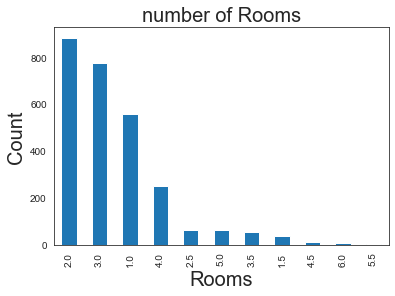

In [67]:
Cologne_rents_Predict['noRooms'].value_counts().plot(kind='bar')
plt.title('number of Rooms',fontsize=20)
plt.xlabel('Rooms',fontsize=20)
plt.ylabel('Count',fontsize=20)
sns.despine

1. Most people would like to have a two-room house, and their demand is high in Köln.

2. The 6-room house is in lower demand. Maybe it is because of the high cost.

# Feature name: Floor

<AxesSubplot:title={'center':'number of Floor'}, xlabel='Floor', ylabel='Count the number'>

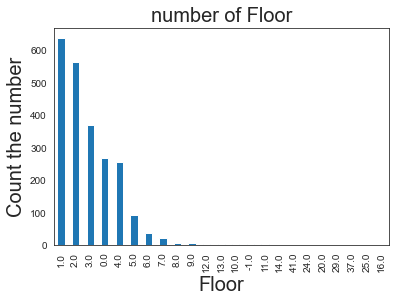

In [68]:
plt.title('number of Floor',fontsize=20)
plt.xlabel('Floor',fontsize=20)
plt.ylabel('Count the number',fontsize=20)
sns.despine
Cologne_rents_Predict.floor.value_counts().plot(kind='bar')

1. The most popular floors in Köln are the first and second floors.

2. In Köln, the 8th and 9th floors are the lowest ranked.


# Feature Name: typeofFlat

In [69]:
Cologne_rents_Predict.typeOfFlat.value_counts()

apartment              1466
roof_storey             250
ground_floor            244
maisonette              173
other                    92
raised_ground_floor      77
terraced_flat            62
penthouse                59
half_basement            36
loft                     11
Name: typeOfFlat, dtype: int64

1. In Köln, the most popular types of flat are apartment, roof_strory, ground_floor etc, while half_basement and a loft are less popular.

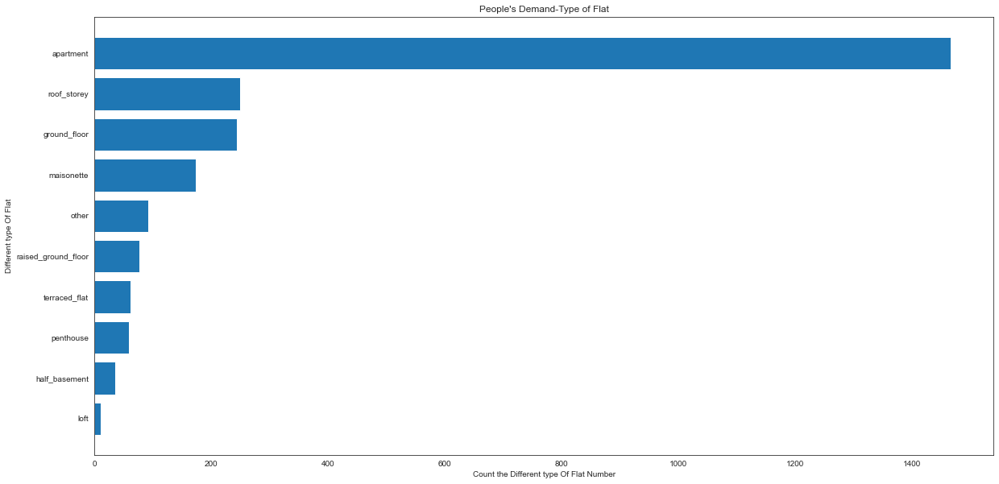

In [70]:
plt.figure(figsize=(20, 10))
flat_type = Cologne_rents_Predict.typeOfFlat.value_counts()[:20]
x = list(flat_type.index)
y = list(flat_type.values)
x.reverse()
y.reverse()

plt.title("People's Demand-Type of Flat")
plt.ylabel("Different type Of Flat")
plt.xlabel("Count the Different type Of Flat Number")

plt.barh(x, y)
plt.show()

1. Most people like apartments to live in, followed by roof story, ground floor.

2. Half-basement and loft apartments are less popular.

# Feature name: streetPlain

In [71]:
 Cologne_rents_Predict.streetPlain.value_counts()[:20]

Wetzlarer_Straße_18_/_Nassaustraße_13    46
Üdesheimer_Weg                           13
Frankfurter_Str.                         13
Am_Klostergarten                         13
Trittenheimer_Str.                       11
Reiterstaffelplatz                       10
Venloer_Straße                            9
Gottesweg                                 9
Hansaring                                 9
Aachener_Straße                           9
Neue_Weyerstraße                          8
Ringstr.                                  8
Fitzmauricestraße                         8
Hauptstraße                               7
Rossstr.                                  7
Paul-Schallück-Straße                     7
Hohenstaufenring                          7
Overbeckstraße                            7
Moltkestraße                              6
Memeler_Straße                            6
Name: streetPlain, dtype: int64

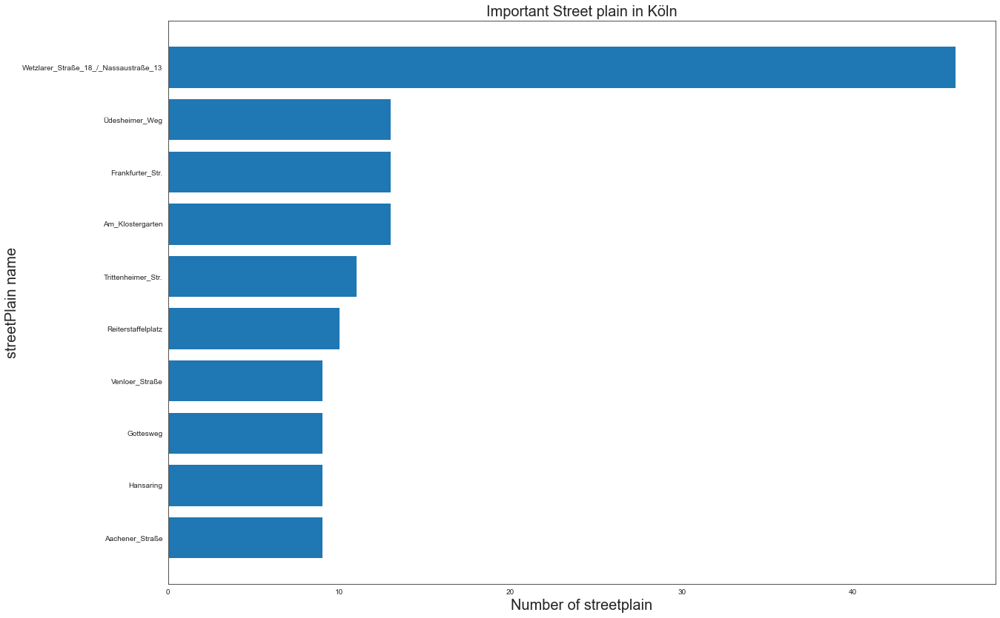

In [72]:
plt.figure(figsize=(20, 14))
streetplain_Köln =  Cologne_rents_Predict.streetPlain.value_counts()[:10]
x = list(streetplain_Köln.index)
y = list(streetplain_Köln.values)
x.reverse()
y.reverse()

plt.title("Important Street plain in Köln",fontsize=20)
plt.ylabel("streetPlain name",fontsize=20)
plt.xlabel("Number of streetplain",fontsize=20)

plt.barh(x, y)
plt.show()

1. According to our streetplan, the majority of people want to live in Wetzlarer_Straße_18_/_Nassaustraße_13. which is close to the Deutz campus at the Köln campus and the Kalk Post Maybe there are a lot of apartments there for international students and people who came from Turkey. They live in these places. That is why on this street there are a lot of people live. It is also the most important street.

2. Fewer people want to live in the Aachener_Straße, maybe immigration office and lot of company over their

# Feature name: Condition

In [73]:
 Cologne_rents_Predict.condition.value_counts()

well_kept                             660
mint_condition                        385
fully_renovated                       321
first_time_use_after_refurbishment    212
modernized                            197
refurbished                           173
first_time_use                        169
negotiable                             16
need_of_renovation                     14
Name: condition, dtype: int64

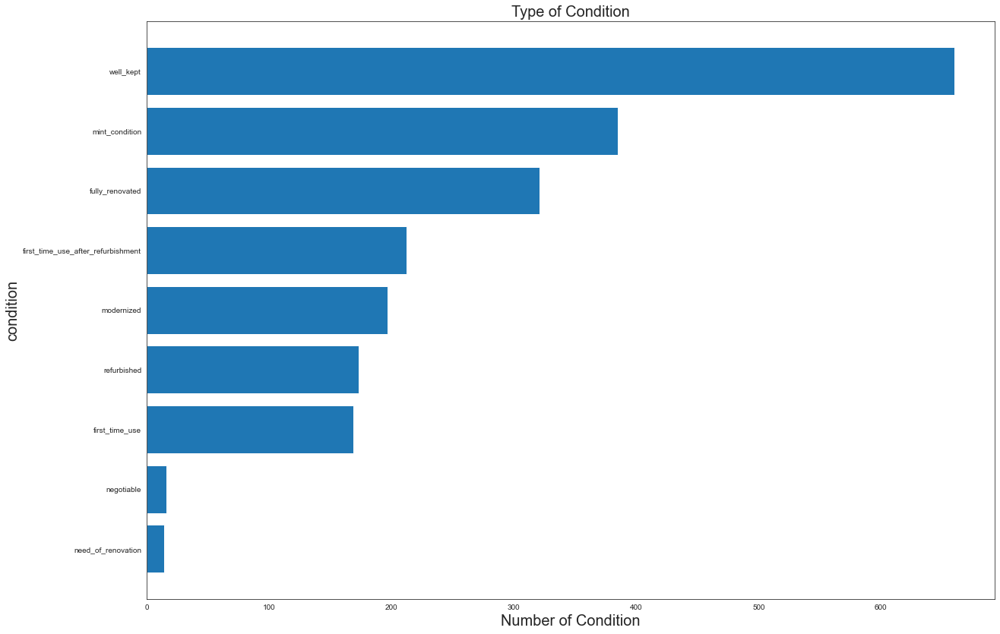

In [74]:
plt.figure(figsize=(20, 14))
Köln_Rent_Condition_Type=  Cologne_rents_Predict.condition.value_counts()[:10]
x = list(Köln_Rent_Condition_Type.index)
y = list(Köln_Rent_Condition_Type.values)
x.reverse()
y.reverse()

plt.title("Type of Condition",fontsize=20)
plt.ylabel("condition",fontsize=20)
plt.xlabel("Number of Condition",fontsize=20)

plt.barh(x, y)
plt.show()

1. Well kept, mint condition is the most popular type of condition.

2. The need_of_renovation is the less important type of condition because people would like to have a renovated house.

# Feature name: firingTypes

In [75]:
 Cologne_rents_Predict.firingTypes.value_counts()[:20]

gas                                            1215
district_heating                                320
oil                                             204
natural_gas_light                               103
local_heating                                    72
electricity                                      46
geothermal                                       32
natural_gas_heavy                                19
pellet_heating                                   17
gas:electricity                                  13
combined_heat_and_power_fossil_fuels             11
wood                                              7
solar_heating                                     6
combined_heat_and_power_regenerative_energy       5
environmental_thermal_energy                      5
gas:oil                                           4
heat_supply                                       3
steam_district_heating                            3
district_heating:electricity                      3
combined_hea

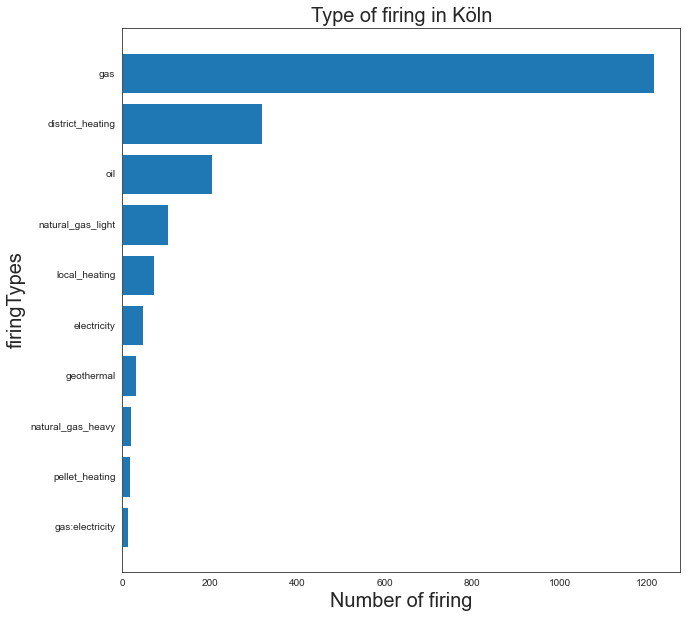

In [76]:
plt.figure(figsize=(10, 10))
firing_type =  Cologne_rents_Predict.firingTypes.value_counts()[:10]
x = list(firing_type.index)
y = list(firing_type.values)
x.reverse()
y.reverse()

plt.title("Type of firing in Köln",fontsize=20)
plt.ylabel("firingTypes",fontsize=20)
plt.xlabel("Number of firing",fontsize=20)

plt.barh(x, y)
plt.show()

1. Gas has the most types of fire in Köln, followed by district heating, oil, and so on.

2. In Köln, gas, electricity is used less frequently than pellet_heating.

# Feature Name: yearConstructed

In [77]:
 Cologne_rents_Predict.yearConstructed.value_counts()

2017.0    94
2019.0    85
2018.0    76
1960.0    62
1972.0    48
          ..
1924.0     1
1700.0     1
1874.0     1
1800.0     1
1948.0     1
Name: yearConstructed, Length: 124, dtype: int64

1. In Köln, modern homes are more popular. That number was 94 in 2017, and it is now 85 in 2019. The highest number was recorded in these two years.

2. Buildings constructed between 1948 and 1800 years ago are less appealing. There is only one number.

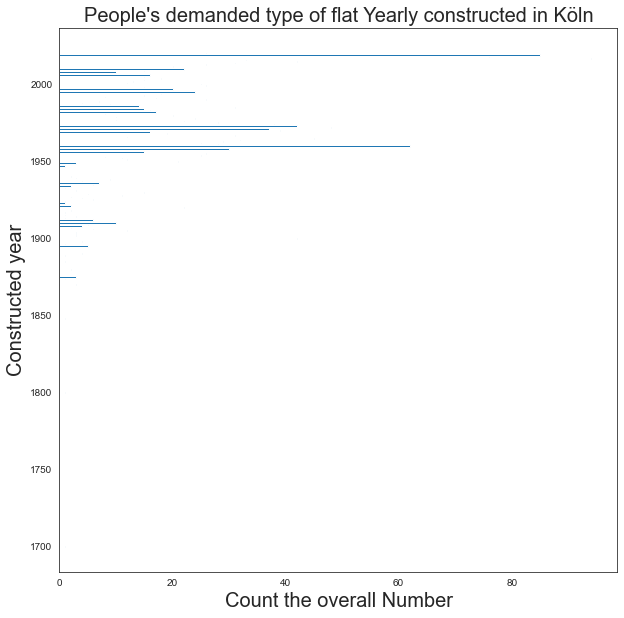

In [78]:
plt.figure(figsize=(10, 10))
yearConstructed_Köln =  Cologne_rents_Predict.yearConstructed.value_counts()
x = list(yearConstructed_Köln.index)
y = list(yearConstructed_Köln.values)
x.reverse()
y.reverse()

plt.title("People's demanded type of flat Yearly constructed in Köln",fontsize=20)
plt.ylabel("Constructed year",fontsize=20)
plt.xlabel("Count the overall Number",fontsize=20)

plt.barh(x, y)
plt.show()

1. Most of the flats in Köln were constructed in the year of 2000, and fewer flats in Köln were constructed in the year of 1900. Below the year of 1900, there is no flat that has been constructed. In Köln, old apartments are completely uninhabitable.

In [79]:
Cologne_rents_Predict.date.unique()

array(['Feb20', 'Oct19', 'Sep18', 'May19'], dtype=object)

# Köln Housing Prediction -Histrogram

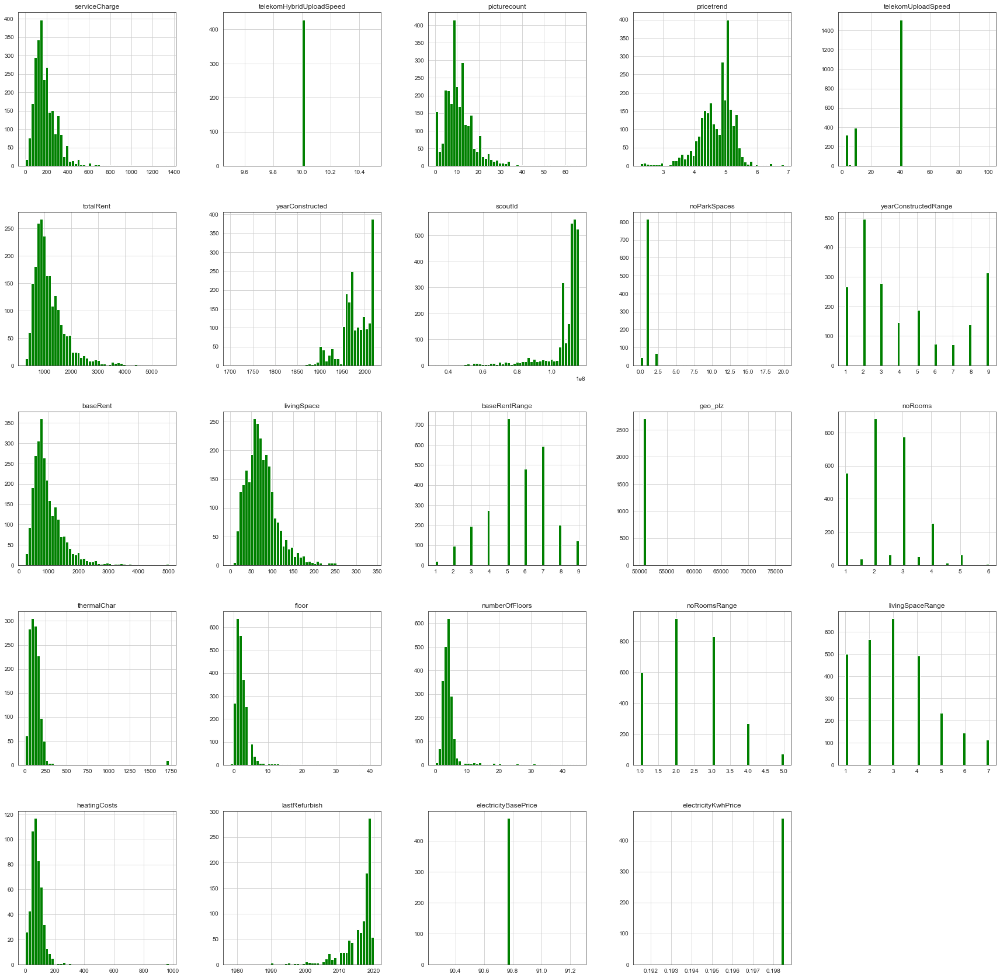

In [80]:
Cologne_rents_Predict.hist(bins=50, figsize=(30,30),color='green')
plt.show()

In [81]:
print(Cologne_rents_Predict.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2709 entries, 253 to 268848
Data columns (total 49 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   regio1                    2709 non-null   object 
 1   serviceCharge             2579 non-null   float64
 2   heatingType               2314 non-null   object 
 3   telekomTvOffer            2241 non-null   object 
 4   telekomHybridUploadSpeed  429 non-null    float64
 5   newlyConst                2709 non-null   bool   
 6   balcony                   2709 non-null   bool   
 7   picturecount              2709 non-null   int64  
 8   pricetrend                2698 non-null   float64
 9   telekomUploadSpeed        2241 non-null   float64
 10  totalRent                 2277 non-null   float64
 11  yearConstructed           1972 non-null   float64
 12  scoutId                   2709 non-null   int64  
 13  noParkSpaces              935 non-null    float64
 14  firi

# Replace the boolean values from our dataset with "0" and "1".

In [82]:
Cologne_rents_Predict.replace([True, False], [1,0], inplace = True)

C:\Users\Md Nazmul Hasan\AppData\Local\Temp\ipykernel_13648\3788077672.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [83]:
print(Cologne_rents_Predict.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2709 entries, 253 to 268848
Data columns (total 49 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   regio1                    2709 non-null   object 
 1   serviceCharge             2579 non-null   float64
 2   heatingType               2314 non-null   object 
 3   telekomTvOffer            2241 non-null   object 
 4   telekomHybridUploadSpeed  429 non-null    float64
 5   newlyConst                2709 non-null   int64  
 6   balcony                   2709 non-null   int64  
 7   picturecount              2709 non-null   int64  
 8   pricetrend                2698 non-null   float64
 9   telekomUploadSpeed        2241 non-null   float64
 10  totalRent                 2277 non-null   float64
 11  yearConstructed           1972 non-null   float64
 12  scoutId                   2709 non-null   int64  
 13  noParkSpaces              935 non-null    float64
 14  firi

There were six int values before; now there are twelve. include the bool value

# Remove those columns that have no info

In [84]:
threshold_val = 0.75 * 2709
Cologne_rents_Predict.dropna(axis=1, thresh = threshold_val, inplace=True)
Remove_features=['regio1','regio2','geo_bln','geo_krs','baseRent']
Cologne_rents_Predict.drop(Remove_features, axis=1, inplace=True)
Cologne_rents_Predict.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 2709 entries, 253 to 268848
Data columns (total 30 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   serviceCharge       2579 non-null   float64
 1   heatingType         2314 non-null   object 
 2   telekomTvOffer      2241 non-null   object 
 3   newlyConst          2709 non-null   int64  
 4   balcony             2709 non-null   int64  
 5   picturecount        2709 non-null   int64  
 6   pricetrend          2698 non-null   float64
 7   telekomUploadSpeed  2241 non-null   float64
 8   totalRent           2277 non-null   float64
 9   scoutId             2709 non-null   int64  
 10  firingTypes         2102 non-null   object 
 11  hasKitchen          2709 non-null   int64  
 12  cellar              2709 non-null   int64  
 13  livingSpace         2709 non-null   float64
 14  condition           2147 non-null   object 
 15  street              2709 non-null   object 
 16  li

C:\Users\Md Nazmul Hasan\AppData\Local\Temp\ipykernel_13648\1365339785.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Md Nazmul Hasan\AppData\Local\Temp\ipykernel_13648\1365339785.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [85]:
Cologne_rents_Predict.shape

(2709, 30)

# Correlation between features

In [86]:
# Learn more about the correlation in the data
print("Important  features related to our target variable totalRent")
correlation1 = Cologne_rents_Predict.corr()['totalRent']


# Convert the series to a data frame so that can be sorted
correlation1 = pd.DataFrame(correlation1)
correlation1.columns = ["Correlation value"]
# sort correlation
correlation2 = correlation1.sort_values(by=['Correlation value'], ascending=False)
correlation2.head(10)

Important  features related to our target variable totalRent


,Correlation value
totalRent,1.000000
baseRentRange,0.857573
livingSpace,0.853527
livingSpaceRange,0.806504
serviceCharge,0.791793
noRooms,0.643306
noRoomsRange,0.634736
picturecount,0.326909
balcony,0.284820
lift,0.207501


In [87]:
Cologne_rents_Predict.corr().unstack().sort_values(ascending=False).drop_duplicates()[1:49]

noRoomsRange      noRooms               0.991777
livingSpace       livingSpaceRange      0.960013
baseRentRange     totalRent             0.857573
livingSpace       totalRent             0.853527
noRooms           livingSpaceRange      0.833135
noRoomsRange      livingSpaceRange      0.828541
noRooms           livingSpace           0.820336
livingSpace       noRoomsRange          0.811992
livingSpaceRange  totalRent             0.806504
serviceCharge     totalRent             0.791793
baseRentRange     livingSpaceRange      0.779335
                  livingSpace           0.772485
serviceCharge     livingSpace           0.723253
numberOfFloors    floor                 0.703322
serviceCharge     livingSpaceRange      0.686453
baseRentRange     noRooms               0.659452
                  noRoomsRange          0.654126
                  serviceCharge         0.650306
noRooms           totalRent             0.643306
totalRent         noRoomsRange          0.634736
serviceCharge     no

<AxesSubplot:>

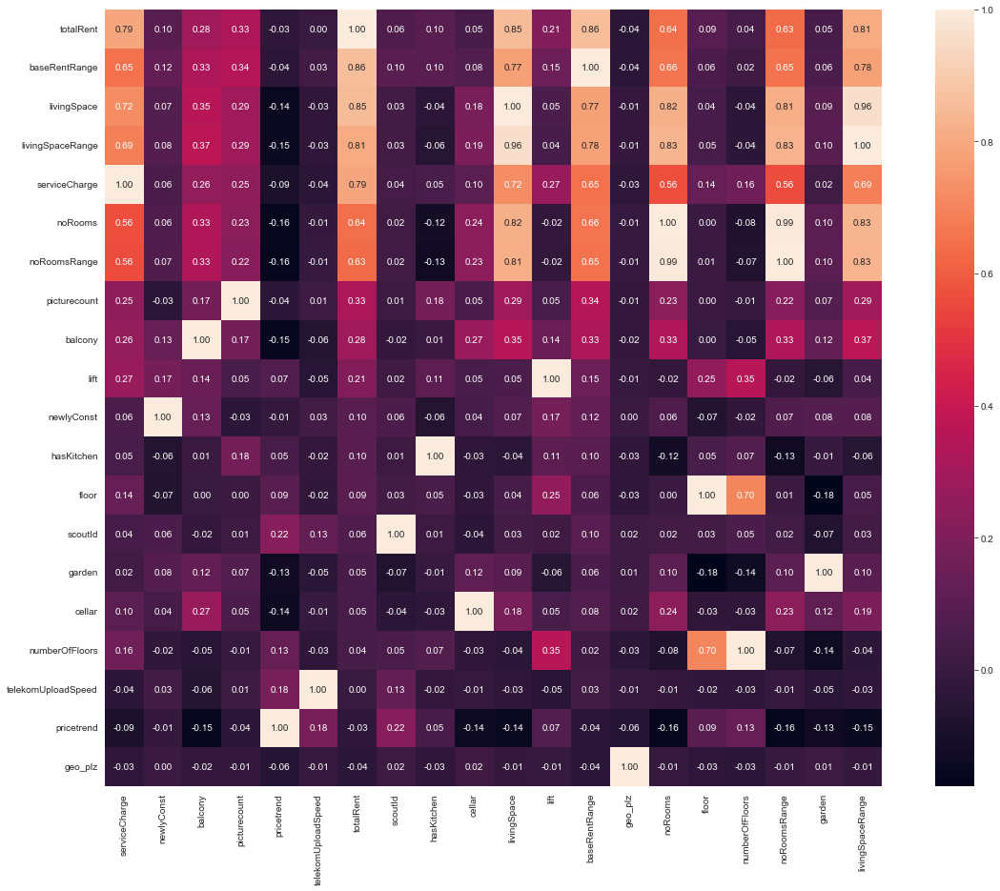

In [88]:
f, ax = plt.subplots(figsize=(20, 15))
sns.heatmap(Cologne_rents_Predict.corr().sort_values(by='totalRent', ascending=False), square = True, fmt='.2f' , annot = True)

In [89]:
corr_mat = Cologne_rents_Predict.corr()
corr_cols = corr_mat.abs().nlargest(21,'totalRent')['totalRent'].index
print("Features that are the most correlated (positively or negatively) to the label:\n",corr_cols)

Features that are the most correlated (positively or negatively) to the label:
 Index(['totalRent', 'baseRentRange', 'livingSpace', 'livingSpaceRange',
       'serviceCharge', 'noRooms', 'noRoomsRange', 'picturecount', 'balcony',
       'lift', 'newlyConst', 'hasKitchen', 'floor', 'scoutId', 'garden',
       'cellar', 'geo_plz', 'numberOfFloors', 'pricetrend',
       'telekomUploadSpeed'],
      dtype='object')


# Replacing int64 or float64 as the data type's mean/median values for missing value.

In [90]:
mean_value_number_for_feature_serviceCharge= Cologne_rents_Predict['serviceCharge'].mean()
Cologne_rents_Predict['serviceCharge'].fillna(mean_value_number_for_feature_serviceCharge, inplace=True)

mean_value_number_for_feature_pricetrend = Cologne_rents_Predict['pricetrend'].mean()
Cologne_rents_Predict['pricetrend'].fillna(mean_value_number_for_feature_pricetrend, inplace=True)

median_value_number_for_feature_telekomUploadSpeed = Cologne_rents_Predict['telekomUploadSpeed'].median()
Cologne_rents_Predict['telekomUploadSpeed'].fillna(median_value_number_for_feature_telekomUploadSpeed, inplace=True)

median_value_number_for_feature_floor = Cologne_rents_Predict['floor'].median()
Cologne_rents_Predict['floor'].fillna(median_value_number_for_feature_floor, inplace=True)

median_value_number_for_feature_numberOfFloors = Cologne_rents_Predict['numberOfFloors'].median()
Cologne_rents_Predict['numberOfFloors'].fillna(median_value_number_for_feature_numberOfFloors, inplace=True)

C:\Users\Md Nazmul Hasan\AppData\Local\Temp\ipykernel_13648\3468139512.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Md Nazmul Hasan\AppData\Local\Temp\ipykernel_13648\3468139512.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Md Nazmul Hasan\AppData\Local\Temp\ipykernel_13648\3468139512.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Md Nazmul Hasan\AppData\Local\Temp\ipykernel_13648\3468139512

# We used Ordinal encoder to convert data objects to float value

In [91]:
#DataFrame.fillna Replace missing values.
# dealing with categorical variables by encoding them, namely ordinal encoding and one-hot encoding.
#X indicate feature value

from sklearn.preprocessing import OrdinalEncoder
Cologne_rents_Predict['condition'].fillna('None', inplace=True)
Cologne_rents_Predict['condition']
ordinal_encoder1 = OrdinalEncoder()
Cologne_rents_Predict['condition'] = ordinal_encoder1.fit_transform(Cologne_rents_Predict['condition'].values.reshape(-1,1))

Cologne_rents_Predict['heatingType'].fillna('None', inplace=True)
Cologne_rents_Predict['heatingType']
ordinal_encoder2 = OrdinalEncoder()
Cologne_rents_Predict['heatingType'] = ordinal_encoder2.fit_transform(Cologne_rents_Predict['heatingType'].values.reshape(-1,1))

Cologne_rents_Predict['telekomTvOffer'].fillna('N.A.', inplace=True)
Cologne_rents_Predict['telekomTvOffer']
ordinal_encoder3 = OrdinalEncoder()
Cologne_rents_Predict['telekomTvOffer'] = ordinal_encoder3.fit_transform(Cologne_rents_Predict['telekomTvOffer'].values.reshape(-1,1))


Cologne_rents_Predict['typeOfFlat'].fillna('N.A.', inplace=True)
Cologne_rents_Predict['typeOfFlat']
ordinal_encoder4 = OrdinalEncoder()
Cologne_rents_Predict['typeOfFlat'] = ordinal_encoder4.fit_transform(Cologne_rents_Predict['typeOfFlat'].values.reshape(-1,1))
Cologne_rents_Predict['typeOfFlat'].unique()

Cologne_rents_Predict['firingTypes'].fillna('None', inplace=True)
Cologne_rents_Predict['firingTypes']
ordinal_encoder5 = OrdinalEncoder()
Cologne_rents_Predict['firingTypes'] = ordinal_encoder5.fit_transform(Cologne_rents_Predict['firingTypes'].values.reshape(-1,1))

#Note : No Null values in street
ordinal_encoder6 = OrdinalEncoder()
Cologne_rents_Predict['street'] = ordinal_encoder6.fit_transform(Cologne_rents_Predict['street'].values.reshape(-1,1))
#dt['street'].unique()

#Note : No Null values in regio3
ordinal_encoder7 = OrdinalEncoder()
Cologne_rents_Predict['regio3'] = ordinal_encoder7.fit_transform(Cologne_rents_Predict['regio3'].values.reshape(-1,1))
#dt['regio3'].unique()

Cologne_rents_Predict['description'].fillna('None', inplace=True)
Cologne_rents_Predict['description']
ordinal_encoder8 = OrdinalEncoder()
Cologne_rents_Predict['description'] = ordinal_encoder8.fit_transform(Cologne_rents_Predict['description'].values.reshape(-1,1))
#dt['description'].unique()

Cologne_rents_Predict['facilities'].fillna('None', inplace=True)
Cologne_rents_Predict['facilities']
ordinal_encoder9 = OrdinalEncoder()
Cologne_rents_Predict['facilities'] = ordinal_encoder9.fit_transform(Cologne_rents_Predict['facilities'].values.reshape(-1,1))
#dt['facilities'].unique()


#Note : No Null values in date
ordinal_encoder10 = OrdinalEncoder()
Cologne_rents_Predict['date'] = ordinal_encoder10.fit_transform(Cologne_rents_Predict['date'].values.reshape(-1,1))
#dt['date'].unique()

C:\Users\Md Nazmul Hasan\AppData\Local\Temp\ipykernel_13648\3296113274.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Md Nazmul Hasan\AppData\Local\Temp\ipykernel_13648\3296113274.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Md Nazmul Hasan\AppData\Local\Temp\ipykernel_13648\3296113274.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Md 

In [92]:
print(Cologne_rents_Predict.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2709 entries, 253 to 268848
Data columns (total 30 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   serviceCharge       2709 non-null   float64
 1   heatingType         2709 non-null   float64
 2   telekomTvOffer      2709 non-null   float64
 3   newlyConst          2709 non-null   int64  
 4   balcony             2709 non-null   int64  
 5   picturecount        2709 non-null   int64  
 6   pricetrend          2709 non-null   float64
 7   telekomUploadSpeed  2709 non-null   float64
 8   totalRent           2277 non-null   float64
 9   scoutId             2709 non-null   int64  
 10  firingTypes         2709 non-null   float64
 11  hasKitchen          2709 non-null   int64  
 12  cellar              2709 non-null   int64  
 13  livingSpace         2709 non-null   float64
 14  condition           2709 non-null   float64
 15  street              2709 non-null   float64
 16  li

1. We converted our bool type into int type 
2. We converted our Object type into float type 
3. Now all of our data type is int and float type

# Let check whetever we have missing value or not

In [93]:
All_missing_values (Cologne_rents_Predict,49)

,Total,Percent
totalRent,432,15.946844
serviceCharge,0,0.000000
lift,0,0.000000
facilities,0,0.000000
description,0,0.000000
regio3,0,0.000000
livingSpaceRange,0,0.000000
garden,0,0.000000
noRoomsRange,0,0.000000
numberOfFloors,0,0.000000


We have totalRent column missing value 

In [94]:
All_missing_values (Cologne_rents_Predict,49)

,Total,Percent
totalRent,432,15.946844
serviceCharge,0,0.000000
lift,0,0.000000
facilities,0,0.000000
description,0,0.000000
regio3,0,0.000000
livingSpaceRange,0,0.000000
garden,0,0.000000
noRoomsRange,0,0.000000
numberOfFloors,0,0.000000


In [95]:
Cologne_rents_Predict.dropna(inplace=True)

C:\Users\Md Nazmul Hasan\AppData\Local\Temp\ipykernel_13648\3193186862.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Now our dataset is ready to work. because there is no missing value in our dataset.

# Splitting Data into Train and Test set

In [103]:
#Splitting Data into Train and Test set
from sklearn.model_selection import train_test_split
X = Cologne_rents_Predict.drop('totalRent', axis = 1)
y = Cologne_rents_Predict[['totalRent']].values.reshape(-1, 1)
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2)
print("Shape: ", X_train.shape, y_train.shape, X_test.shape, y_test.shape)

Shape:  (1821, 29) (1821, 1) (456, 29) (456, 1)


# StandardScaler Transform

Data Standardization
Standardizing a dataset involves rescaling the distribution of values so that the mean of observed values is 0 and the standard deviation is 1.
y = (x – mean) / standard_deviation
mean = sum(x) / count(x)
standard_deviation = sqrt( sum( (x – mean)^2 ) / count(x))

In [104]:
from sklearn.preprocessing import StandardScaler
Standard_Scaler = StandardScaler().fit(X_train)
X_train_scaled = Standard_Scaler.transform(X_train)
X_test_scaled = Standard_Scaler.transform(X_test)
X_train_df=pd.DataFrame(X_train)
X_train_df

,serviceCharge,heatingType,telekomTvOffer,newlyConst,balcony,picturecount,pricetrend,telekomUploadSpeed,scoutId,firingTypes,...,noRooms,floor,numberOfFloors,noRoomsRange,garden,livingSpaceRange,regio3,description,facilities,date
119000,85.0,1.0,2.0,0,1,15,5.35,40.0,113925582,10.0,...,1.0,6.0,8.0,1,0,1,81.0,31.0,1464.0,0.0
142972,100.0,5.0,0.0,0,1,8,4.31,40.0,113582790,10.0,...,2.0,2.0,4.0,2,0,3,38.0,1507.0,1663.0,2.0
233475,240.0,6.0,2.0,0,0,14,4.31,2.4,115650732,0.0,...,3.0,4.0,15.0,3,0,4,69.0,1885.0,1663.0,0.0
57512,97.0,5.0,2.0,0,1,13,4.28,40.0,111310024,19.0,...,2.0,2.0,4.0,2,0,2,32.0,1606.0,749.0,1.0
82047,107.0,1.0,2.0,0,1,4,5.21,40.0,115626844,10.0,...,3.0,2.0,4.0,3,0,3,28.0,32.0,1504.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
183285,220.5,5.0,2.0,1,1,3,5.24,40.0,112685408,0.0,...,2.0,1.0,2.0,2,0,3,3.0,662.0,1670.0,0.0
225896,341.0,3.0,2.0,0,1,8,4.59,40.0,115691319,5.0,...,5.0,3.0,4.0,5,0,5,27.0,459.0,1289.0,0.0
222465,320.0,1.0,0.0,0,1,9,4.90,40.0,113789994,10.0,...,3.0,5.0,4.0,3,0,6,0.0,1952.0,291.0,2.0
268145,110.0,1.0,2.0,0,0,13,4.26,40.0,110395810,10.0,...,4.0,3.0,3.0,4,0,3,33.0,750.0,1787.0,1.0


LinearRegression fits a linear model with coefficients w = (w1, …, wp) to minimize the residual sum of squares between the observed targets in the dataset, and the targets predicted by the linear approximation.

In [122]:
from sklearn.linear_model import LinearRegression
linear_reg = LinearRegression()
import time
start_time_now = time.time()
linear_reg.fit(X_train, y_train)
y_pred_linear_reg = linear_reg.predict(X_test)
Calculate_the_time_for_linear_regression = time.time() - start_time_now

In [126]:
from sklearn.metrics import r2_score
import sklearn.metrics as metrics
print('Linear Regressor: train', linear_reg.score(X_train, y_train))
print('Linear Regressor R^2: test', metrics.r2_score(y_test,y_pred_linear_reg ))

print('=======================================================================================')
from sklearn.metrics import mean_squared_error
print('Mean Squared Error (MSE):', mean_squared_error(y_test, y_pred_linear_reg ))

print('=======================================================================================')
from sklearn.metrics import mean_squared_error
print('Root mean squard error (RMSE):', np.sqrt(mean_squared_error(y_test, y_pred_linear_reg )))

print('=======================================================================================')
from sklearn.metrics import mean_absolute_error
print('Mean Absolute Error (MAE):', mean_absolute_error(y_test,y_pred_linear_reg ))
print('=======================================================================================')
print("<<<<<< Calculate the time for modelling: %s seconds>>>>>>>>>>>>>>>" % Calculate_the_time_for_linear_regression)
print('=======================================================================================')


Linear Regressor: train 0.8867158972494489
Linear Regressor R^2: test 0.8815982636015052
Mean Squared Error (MSE): 53384.78459758762
Root mean squard error (RMSE): 231.0514760774915
Mean Absolute Error (MAE): 152.43092043232267
<<<<<< Calculate the time for modelling: 0.0069963932037353516 seconds>>>>>>>>>>>>>>>


In [107]:
from sklearn.model_selection import cross_val_score
Linear_Reg_scores = cross_val_score(linear_reg, X_train, y_train, cv=5, scoring="neg_root_mean_squared_error")
Linear_Reg_scores.mean()

-210.6081015861865

In [136]:
# Create the Randomized Search CV model
# Create a Randomized Search CV estimator and a parameter object containing the value to adjust
Linear_Parameter_Grid = {
                       'fit_intercept': [True, False],
                        #maximum numbr of levels in tree
                         'normalize': [True, False],
                     
                      }
Linear_Parameter_Grid = RandomizedSearchCV(linear_reg ,Linear_Parameter_Grid,cv=5, verbose=3) 
import time
start_time_now = time.time()

In [137]:
Linear_Parameter_Grid.fit(X_train, y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5] END fit_intercept=True, normalize=True;, score=0.899 total time=   0.0s
[CV 2/5] END fit_intercept=True, normalize=True;, score=0.825 total time=   0.0s
[CV 3/5] END fit_intercept=True, normalize=True;, score=0.894 total time=   0.0s
[CV 4/5] END fit_intercept=True, normalize=True;, score=0.886 total time=   0.0s
[CV 5/5] END fit_intercept=True, normalize=True;, score=0.891 total time=   0.0s
[CV 1/5] END fit_intercept=True, normalize=False;, score=0.899 total time=   0.0s
[CV 2/5] END fit_intercept=True, normalize=False;, score=0.825 total time=   0.0s
[CV 3/5] END fit_intercept=True, normalize=False;, score=0.894 total time=   0.0s
[CV 4/5] END fit_intercept=True, normalize=False;, score=0.886 total time=   0.0s
[CV 5/5] END fit_intercept=True, normalize=False;, score=0.891 total time=   0.0s
[CV 1/5] END fit_intercept=False, normalize=True;, score=0.900 total time=   0.0s
[CV 2/5] END fit_intercept=False, normalize

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_search.py:306: UserWarning:

The total space of parameters 4 is smaller than n_iter=10. Running 4 iterations. For exhaustive searches, use GridSearchCV.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_base.py:141: FutureWarning:

'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)



C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\l

RandomizedSearchCV(cv=5, estimator=LinearRegression(),
                   param_distributions={'fit_intercept': [True, False],
                                        'normalize': [True, False]},
                   verbose=3)

In [138]:
print(Linear_Parameter_Grid.best_params_)
print(Linear_Parameter_Grid.best_score_)

{'normalize': True, 'fit_intercept': False}
0.8791646131867686


In [139]:
Hypertuned_Random_Search_Linear_reg_Model = LinearRegression(
    fit_intercept=True, 
    normalize=False
) 
                                        
Hypertuned_Random_Search_Linear_reg_Model

LinearRegression(normalize=False)

In [140]:
Hypertuned_Random_Search_Linear_reg_Model.fit(X_train, y_train)

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_base.py:148: FutureWarning:

'normalize' was deprecated in version 1.0 and will be removed in 1.2. Please leave the normalize parameter to its default value to silence this warning. The default behavior of this estimator is to not do any normalization. If normalization is needed please use sklearn.preprocessing.StandardScaler instead.



LinearRegression(normalize=False)

In [141]:
y_pred_linear_reg_01 = Hypertuned_Random_Search_Linear_reg_Model.predict(X_test)

In [142]:
Calculate_the_time_for_linear_regression_randomized_search = time.time() - start_time_now

In [143]:
from sklearn.metrics import r2_score
import sklearn.metrics as metrics
print('Hyperparameter tuning Randomized search Linear Regressor: train', Hypertuned_Random_Search_Linear_reg_Model.score(X_train, y_train))
print('Hyperparameter tuning Randomized search Linear Regressor R^2: test', metrics.r2_score(y_test,y_pred_linear_reg_01 ))

print('=======================================================================================')
from sklearn.metrics import mean_squared_error
print('Mean Squared Error (MSE):', mean_squared_error(y_test, y_pred_linear_reg_01 ))

print('=======================================================================================')
from sklearn.metrics import mean_squared_error
print('Root mean squard error (RMSE):', np.sqrt(mean_squared_error(y_test, y_pred_linear_reg_01 )))

print('=======================================================================================')
from sklearn.metrics import mean_absolute_error
print('Mean Absolute Error (MAE):', mean_absolute_error(y_test,y_pred_linear_reg_01 ))
print('=======================================================================================')
print("Calculate the time for modelling: %s seconds" % Calculate_the_time_for_linear_regression_randomized_search)
print('=======================================================================================')


Hyperparameter tuning Randomized search Linear Regressor: train 0.8867158972494489
Hyperparameter tuning Randomized search Linear Regressor R^2: test 0.8815982636015052
Mean Squared Error (MSE): 53384.78459758762
Root mean squard error (RMSE): 231.0514760774915
Mean Absolute Error (MAE): 152.43092043232267
Calculate the time for modelling: 19.403079509735107 seconds


# Random Forest Regressor

1. Both RMSE and R2 quantify how well a regression model fits a dataset

2. The R2 score is a very important metric that is used to evaluate the performance of a regression-based machine learning model.

3. Root mean square error or root mean square deviation is one of the most commonly used measures for evaluating the quality of predictions

4. The Mean absolute error represents the average of the absolute difference between the actual and predicted values in the dataset. It measures the average of the residuals in the dataset.

5. Mean Squared Error represents the average of the squared difference between the original and predicted values in the data set. It measures the variance of the residuals.

6. Root Mean Squared Error is the square root of Mean Squared error. It measures the standard deviation of residuals.


In [725]:
from sklearn.ensemble import RandomForestRegressor
Random_forest_reg = RandomForestRegressor()
Random_forest_reg.fit(X_train, y_train)
y_pred_Random_forest_reg = Random_forest_reg.predict(X_test)

C:\Users\Md Nazmul Hasan\AppData\Local\Temp\ipykernel_13648\1477999823.py:3: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



# Random Forest R2, MSE, RMSE, MAE & Cross_Val_Score

In [726]:
from sklearn.metrics import r2_score
import sklearn.metrics as metrics
print('Random_Forest_Regressor: train', Random_forest_reg.score(X_train, y_train))
print('Random_Forest_Regressor R^2: test', metrics.r2_score(y_test, y_pred_Random_forest_reg))

print('=======================================================================================')
from sklearn.metrics import mean_squared_error
print('Mean Squared Error (MSE):', mean_squared_error(y_test, y_pred_Random_forest_reg))

print('=======================================================================================')
import numpy as np
from sklearn.metrics import mean_squared_error
print('Root mean squard error (RMSE):', np.sqrt(mean_squared_error(y_test, y_pred_Random_forest_reg)))
print('=======================================================================================')

from sklearn.metrics import mean_absolute_error
print('Mean Absolute Error (MAE):', mean_absolute_error(y_test, y_pred_Random_forest_reg))
print('=======================================================================================')

Random_Forest_Regressor: train 0.9911401119381935
Random_Forest_Regressor R^2: test 0.9440493119054859
Mean Squared Error (MSE): 25226.95631725901
Root mean squard error (RMSE): 158.8299603892761
Mean Absolute Error (MAE): 89.54653574561404


In [694]:
from sklearn.model_selection import cross_val_score
RF_Reg_scores = cross_val_score(Random_forest_reg, X_train, y_train, cv=5, scoring="neg_root_mean_squared_error")
RF_Reg_scores.mean()

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array 

-153.5726808999765

# Hyperparameter Tuning Random Forest- Randomized Search CV

In [727]:
Random_forest_reg.get_params().keys()

dict_keys(['bootstrap', 'ccp_alpha', 'criterion', 'max_depth', 'max_features', 'max_leaf_nodes', 'max_samples', 'min_impurity_decrease', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 'n_estimators', 'n_jobs', 'oob_score', 'random_state', 'verbose', 'warm_start'])

In [768]:
# Create the Randomized Search CV model
# Create a Randomized Search CV estimator and a parameter object containing the value to adjust
RF_Parameter_Grid = {
                        'n_estimators': [100,200,300],
                         'max_depth': [5,15,None],
                         'min_samples_split':[5,7],
                         #minimum number of samples required at each leaf node 
                         'min_samples_leaf':[ 4,6],
                         #number of features to consider at every split
                         'max_features': ['auto']
                      
                      }
RF_Model_Grid = RandomizedSearchCV(Random_forest_reg, RF_Parameter_Grid,cv=5, verbose=3)
import time
start_time_now = time.time()

In [769]:
RF_Model_Grid.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 1/5] END max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=300;, score=0.953 total time=   1.3s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 2/5] END max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=300;, score=0.896 total time=   1.3s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 3/5] END max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=300;, score=0.940 total time=   1.3s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 4/5] END max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=300;, score=0.954 total time=   1.3s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 5/5] END max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=300;, score=0.945 total time=   1.3s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 1/5] END max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=100;, score=0.954 total time=   0.7s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 2/5] END max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=100;, score=0.903 total time=   0.7s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 3/5] END max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=100;, score=0.940 total time=   0.7s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 4/5] END max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=100;, score=0.955 total time=   0.7s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 5/5] END max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=100;, score=0.948 total time=   0.6s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 1/5] END max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=300;, score=0.955 total time=   2.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 2/5] END max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=300;, score=0.900 total time=   2.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 3/5] END max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=300;, score=0.940 total time=   2.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 4/5] END max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=300;, score=0.954 total time=   2.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 5/5] END max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=300;, score=0.947 total time=   2.2s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 1/5] END max_depth=15, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=100;, score=0.953 total time=   0.6s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 2/5] END max_depth=15, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=100;, score=0.907 total time=   0.6s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 3/5] END max_depth=15, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=100;, score=0.941 total time=   0.6s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 4/5] END max_depth=15, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=100;, score=0.955 total time=   0.6s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 5/5] END max_depth=15, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=100;, score=0.947 total time=   0.6s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 1/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=100;, score=0.956 total time=   0.6s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 2/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=100;, score=0.898 total time=   0.7s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 3/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=100;, score=0.940 total time=   0.6s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 4/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=100;, score=0.955 total time=   0.7s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 5/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=100;, score=0.950 total time=   0.6s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 1/5] END max_depth=5, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=300;, score=0.949 total time=   1.3s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 2/5] END max_depth=5, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=300;, score=0.909 total time=   1.3s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 3/5] END max_depth=5, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=300;, score=0.939 total time=   1.2s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 4/5] END max_depth=5, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=300;, score=0.954 total time=   1.3s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 5/5] END max_depth=5, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=300;, score=0.946 total time=   1.2s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 1/5] END max_depth=5, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=300;, score=0.949 total time=   1.3s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 2/5] END max_depth=5, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=300;, score=0.909 total time=   1.3s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 3/5] END max_depth=5, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=300;, score=0.939 total time=   1.3s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 4/5] END max_depth=5, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=300;, score=0.953 total time=   1.3s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 5/5] END max_depth=5, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=300;, score=0.946 total time=   1.3s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 1/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200;, score=0.956 total time=   1.4s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 2/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200;, score=0.896 total time=   1.4s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 3/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200;, score=0.939 total time=   1.4s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 4/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200;, score=0.954 total time=   1.4s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 5/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200;, score=0.947 total time=   1.4s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 1/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=100;, score=0.952 total time=   0.6s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 2/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=100;, score=0.911 total time=   0.6s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 3/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=100;, score=0.941 total time=   0.6s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 4/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=100;, score=0.953 total time=   0.6s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 5/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=100;, score=0.947 total time=   0.6s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 1/5] END max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=300;, score=0.955 total time=   2.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 2/5] END max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=300;, score=0.899 total time=   2.2s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 3/5] END max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=300;, score=0.939 total time=   2.2s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 4/5] END max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=300;, score=0.954 total time=   2.2s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 5/5] END max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=300;, score=0.947 total time=   2.4s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_search.py:910: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(),
                   param_distributions={'max_depth': [5, 15, None],
                                        'max_features': ['auto'],
                                        'min_samples_leaf': [4, 6],
                                        'min_samples_split': [5, 7],
                                        'n_estimators': [100, 200, 300]},
                   verbose=3)

# Randomized Search CV best parameter - Random Forest

In [770]:
print(RF_Model_Grid.best_params_)
print(RF_Model_Grid.best_score_)

{'n_estimators': 100, 'min_samples_split': 7, 'min_samples_leaf': 6, 'max_features': 'auto', 'max_depth': None}
0.9406393168562678


In [771]:
Hypertuned_Random_Search_RF_reg_Model = RandomForestRegressor(
    n_estimators=100, 
    min_samples_split= 7, 
    min_samples_leaf= 6, 
    max_features = 'auto',
    max_depth = None
) 
                                        
Hypertuned_Random_Search_RF_reg_Model

RandomForestRegressor(max_features='auto', min_samples_leaf=6,
                      min_samples_split=7)

In [772]:
Hypertuned_Random_Search_RF_reg_Model.fit(X_train, y_train)

C:\Users\Md Nazmul Hasan\AppData\Local\Temp\ipykernel_13648\2874362590.py:1: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



RandomForestRegressor(max_features='auto', min_samples_leaf=6,
                      min_samples_split=7)

In [773]:
y_pred_Random_forest_reg_01 = Hypertuned_Random_Search_RF_reg_Model.predict(X_test)

In [774]:
Calculate_the_time_for_Hypertuned_Random_search_RF_regression = time.time() - start_time_now

In [775]:
from sklearn.metrics import r2_score
import sklearn.metrics as metrics
print('Random_Forest_Regressor_hyperparameter_tuning: train', Hypertuned_Random_Search_RF_reg_Model.score(X_train, y_train))
print('Random_Forest_Regressor R^2: test', metrics.r2_score(y_test, y_pred_Random_forest_reg_01))

print('=======================================================================================')
from sklearn.metrics import mean_squared_error
print('Mean Squared Error (MSE):', mean_squared_error(y_test, y_pred_Random_forest_reg_01))

print('=======================================================================================')
import numpy as np
from sklearn.metrics import mean_squared_error
print('Root mean squard error (RMSE):', np.sqrt(mean_squared_error(y_test, y_pred_Random_forest_reg_01)))
print('=======================================================================================')

from sklearn.metrics import mean_absolute_error
print('Mean Absolute Error (MAE):', mean_absolute_error(y_test, y_pred_Random_forest_reg_01))
print('=======================================================================================')
print("Calculate the time for modelling: %s seconds" % Calculate_the_time_for_Hypertuned_Random_search_RF_regression)
print('=======================================================================================')

Random_Forest_Regressor_hyperparameter_tuning: train 0.9708096682139661
Random_Forest_Regressor R^2: test 0.9451182090172849
Mean Squared Error (MSE): 24745.01370555334
Root mean squard error (RMSE): 157.30547894321208
Mean Absolute Error (MAE): 89.95393055840313
Calculate the time for modelling: 114.33306574821472 seconds


In [776]:
from sklearn.model_selection import cross_val_score
RF_Reg_scores_randomized_search = cross_val_score(Hypertuned_Random_Search_RF_reg_Model, X_train, y_train, cv=5, scoring="neg_root_mean_squared_error")
RF_Reg_scores_randomized_search.mean()

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensembl

-147.28960082554863

# Hyperparameter Tuning - Random Forest Regressor- Grid Search CV

In [777]:
from sklearn.model_selection import GridSearchCV
Hypertuned_Grid_Search_RF_reg_Model = {
                       'n_estimators': [100,200,300],
                        #maximum numbr of levels in tree
                         'max_depth': [None],
                     # 'criterion': ['gini','entropy'],
                        #Minimum number of sample required to split a node 
                        'min_samples_split':[5, 7],
                         #minimum number of samples required at each leaf node 
                         'min_samples_leaf':[ 4, 6],
                         #number of features to consider at every split
                       'max_features': ['auto']
}
                                        
Hypertuned_RF_Model_Grid_search_cv_reg = GridSearchCV(Random_forest_reg, Hypertuned_Grid_Search_RF_reg_Model ,cv=5, verbose=3)
import time
start_time_now = time.time()

In [778]:
Hypertuned_RF_Model_Grid_search_cv_reg.fit(X_train, y_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 1/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100;, score=0.955 total time=   0.7s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 2/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100;, score=0.899 total time=   0.7s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 3/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100;, score=0.939 total time=   0.7s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 4/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100;, score=0.956 total time=   0.7s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 5/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100;, score=0.947 total time=   0.7s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 1/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200;, score=0.956 total time=   1.5s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 2/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200;, score=0.899 total time=   1.4s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 3/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200;, score=0.939 total time=   1.5s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 4/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200;, score=0.954 total time=   1.5s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 5/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200;, score=0.947 total time=   1.5s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 1/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=300;, score=0.955 total time=   2.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 2/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=300;, score=0.897 total time=   2.3s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 3/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=300;, score=0.937 total time=   2.2s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 4/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=300;, score=0.954 total time=   2.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 5/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=300;, score=0.949 total time=   2.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 1/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=100;, score=0.954 total time=   0.7s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 2/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=100;, score=0.900 total time=   0.6s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 3/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=100;, score=0.939 total time=   0.6s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 4/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=100;, score=0.955 total time=   0.6s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 5/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=100;, score=0.947 total time=   0.6s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 1/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=200;, score=0.955 total time=   1.4s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 2/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=200;, score=0.899 total time=   1.4s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 3/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=200;, score=0.938 total time=   1.4s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 4/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=200;, score=0.955 total time=   1.4s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 5/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=200;, score=0.948 total time=   1.4s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 1/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=300;, score=0.955 total time=   2.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 2/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=300;, score=0.901 total time=   2.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 3/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=300;, score=0.937 total time=   2.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 4/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=300;, score=0.954 total time=   2.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 5/5] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=300;, score=0.946 total time=   2.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 1/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=100;, score=0.951 total time=   0.6s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 2/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=100;, score=0.910 total time=   0.6s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 3/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=100;, score=0.939 total time=   0.6s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 4/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=100;, score=0.954 total time=   0.6s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 5/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=100;, score=0.947 total time=   0.6s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 1/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=200;, score=0.951 total time=   1.3s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 2/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=200;, score=0.906 total time=   1.3s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 3/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=200;, score=0.940 total time=   1.2s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 4/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=200;, score=0.955 total time=   1.2s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 5/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=200;, score=0.947 total time=   1.2s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 1/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=300;, score=0.952 total time=   1.9s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 2/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=300;, score=0.910 total time=   1.9s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 3/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=300;, score=0.941 total time=   2.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 4/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=300;, score=0.955 total time=   1.9s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 5/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=300;, score=0.947 total time=   1.9s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 1/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=100;, score=0.953 total time=   0.6s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 2/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=100;, score=0.910 total time=   0.6s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 3/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=100;, score=0.938 total time=   0.6s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 4/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=100;, score=0.955 total time=   0.6s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 5/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=100;, score=0.946 total time=   0.6s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 1/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=200;, score=0.953 total time=   1.3s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 2/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=200;, score=0.908 total time=   1.2s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 3/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=200;, score=0.939 total time=   1.2s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 4/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=200;, score=0.954 total time=   1.3s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 5/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=200;, score=0.947 total time=   1.2s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 1/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=300;, score=0.952 total time=   1.9s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 2/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=300;, score=0.910 total time=   1.9s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 3/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=300;, score=0.940 total time=   1.9s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 4/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=300;, score=0.954 total time=   1.9s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



[CV 5/5] END max_depth=None, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=300;, score=0.947 total time=   1.9s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_search.py:910: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [None], 'max_features': ['auto'],
                         'min_samples_leaf': [4, 6],
                         'min_samples_split': [5, 7],
                         'n_estimators': [100, 200, 300]},
             verbose=3)

# Hyperparameter tuning - Grid search CV - Random forest regressor - best parameter name 

In [779]:
print(Hypertuned_RF_Model_Grid_search_cv_reg.best_params_)
print(Hypertuned_RF_Model_Grid_search_cv_reg.best_score_)

{'max_depth': None, 'max_features': 'auto', 'min_samples_leaf': 6, 'min_samples_split': 5, 'n_estimators': 300}
0.9409867643435306


# Fit the Random forest regressor model using our best parameter -grid search

In [780]:
Hypertuned_RF_Model_Grid_search_cv_reg  = RandomForestRegressor(
    n_estimators= 300, 
    min_samples_split= 5, 
    min_samples_leaf= 6, 
    max_features = 'auto',
    max_depth = None
) 
                                        
Hypertuned_RF_Model_Grid_search_cv_reg 

RandomForestRegressor(max_features='auto', min_samples_leaf=6,
                      min_samples_split=5, n_estimators=300)

In [781]:
Hypertuned_RF_Model_Grid_search_cv_reg .fit(X_train, y_train)

C:\Users\Md Nazmul Hasan\AppData\Local\Temp\ipykernel_13648\1821496875.py:1: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



RandomForestRegressor(max_features='auto', min_samples_leaf=6,
                      min_samples_split=5, n_estimators=300)

In [782]:
y_pred_Random_forest_reg_Grid_search_01 = Hypertuned_RF_Model_Grid_search_cv_reg.predict(X_test)

In [783]:
Calculate_the_time_for_Hypertuned_Grid_search_RF_regression = time.time() - start_time_now

# Hyperparameter tuning -Random forest regressor - Grid search cv -overall result

In [784]:
from sklearn.metrics import r2_score
import sklearn.metrics as metrics
print('Random_Forest_Regressor_hyperparameter_tuning: train', Hypertuned_RF_Model_Grid_search_cv_reg.score(X_train, y_train))
print('Random_Forest_Regressor R^2: test', metrics.r2_score(y_test, y_pred_Random_forest_reg_Grid_search_01 ))

print('=======================================================================================')
from sklearn.metrics import mean_squared_error
print('Mean Squared Error (MSE):', mean_squared_error(y_test, y_pred_Random_forest_reg_Grid_search_01 ))

print('=======================================================================================')
import numpy as np
from sklearn.metrics import mean_squared_error
print('Root mean squard error (RMSE):', np.sqrt(mean_squared_error(y_test, y_pred_Random_forest_reg_Grid_search_01)))
print('=======================================================================================')

from sklearn.metrics import mean_absolute_error
print('Mean Absolute Error (MAE):', mean_absolute_error(y_test, y_pred_Random_forest_reg_Grid_search_01))
print('=======================================================================================')
print("Calculate the time for modelling: %s seconds" % Calculate_the_time_for_Hypertuned_Grid_search_RF_regression)
print('=======================================================================================')

Random_Forest_Regressor_hyperparameter_tuning: train 0.9718976654330481
Random_Forest_Regressor R^2: test 0.9440859783786849
Mean Squared Error (MSE): 25210.424196757856
Root mean squard error (RMSE): 158.77790840276822
Mean Absolute Error (MAE): 89.85487292058639
Calculate the time for modelling: 281.5892813205719 seconds


In [785]:
from sklearn.model_selection import cross_val_score
RF_Reg_scores_grid_search = cross_val_score(Hypertuned_RF_Model_Grid_search_cv_reg, X_train, y_train, cv=5, scoring="neg_root_mean_squared_error")
RF_Reg_scores_grid_search.mean()

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\ensembl

-147.1445568311319

# XGBoost regression

In [284]:
# create an xgboost regression model
from xgboost import XGBRegressor
model_XGboost = XGBRegressor(n_estimators=100, max_depth=12, eta=0.1, subsample=0.7, colsample_bytree=0.8)
model_XGboost.fit(X_train, y_train)
y_pred_XGBoost= model_XGboost.predict(X_test)

# XGBoost R2, MSE, RMSE, MAE & cross_val_score

In [285]:
from sklearn.metrics import r2_score
import sklearn.metrics as metrics
print('XGBost Regressor: train', model_XGboost.score(X_train, y_train))
print('XGBoost Regressor R^2: test', metrics.r2_score(y_test, y_pred_XGBoost))

print('=======================================================================================')
from sklearn.metrics import mean_squared_error
print('Mean Squared Error (MSE):', mean_squared_error(y_test, y_pred_XGBoost))

print('=======================================================================================')
from sklearn.metrics import mean_squared_error
print('Root mean squard error (RMSE):', np.sqrt(mean_squared_error(y_test, y_pred_XGBoost)))

print('=======================================================================================')
from sklearn.metrics import mean_absolute_error
print('Mean Absolute Error (MAE):', mean_absolute_error(y_test, y_pred_XGBoost))
print('=======================================================================================')

XGBost Regressor: train 0.9997458183343712
XGBoost Regressor R^2: test 0.9424312850932465
Mean Squared Error (MSE): 25956.489645670747
Root mean squard error (RMSE): 161.11017859114534
Mean Absolute Error (MAE): 91.57963777240953


In [242]:
from sklearn.model_selection import cross_val_score
XGBoost_scores = cross_val_score(model_XGboost, X_train, y_train, cv=5, scoring="neg_root_mean_squared_error")
XGBoost_scores.mean()

-152.1419650320446

# Hyperparameter Tuning XGBoost- Randomized Search CV

In [286]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
XGBoost_Model_Parameter_Grid_RandomizedSearchCV_reg =XGBoost_Model_Parameter_Grid = {
'learning_rate':[0.05,0.10,0.15,0.20,0.25,0.30], 
'n_estimators' :[100],
'eta':[0.01],
'max_depth':[3,4,5,6,8,10,12,15, None],
'min_child_weight':[1,3,5,7],
'gamma':[0,1],
'subsample':[0.1, 0.5, 1.0],
'colsample_bytree':[0.3,0.4,0.5,0.7]
}
                         
XGBoost_Model_Randomized_search_reg= RandomizedSearchCV(model_XGboost, XGBoost_Model_Parameter_Grid_RandomizedSearchCV_reg,cv=5, verbose=3)
import time
start_time_now = time.time()

In [287]:
XGBoost_Model_Randomized_search_reg.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END colsample_bytree=0.5, eta=0.01, gamma=1, learning_rate=0.15, max_depth=None, min_child_weight=3, n_estimators=100, subsample=0.5;, score=0.959 total time=   0.1s
[CV 2/5] END colsample_bytree=0.5, eta=0.01, gamma=1, learning_rate=0.15, max_depth=None, min_child_weight=3, n_estimators=100, subsample=0.5;, score=0.898 total time=   0.1s
[CV 3/5] END colsample_bytree=0.5, eta=0.01, gamma=1, learning_rate=0.15, max_depth=None, min_child_weight=3, n_estimators=100, subsample=0.5;, score=0.927 total time=   0.0s
[CV 4/5] END colsample_bytree=0.5, eta=0.01, gamma=1, learning_rate=0.15, max_depth=None, min_child_weight=3, n_estimators=100, subsample=0.5;, score=0.961 total time=   0.0s
[CV 5/5] END colsample_bytree=0.5, eta=0.01, gamma=1, learning_rate=0.15, max_depth=None, min_child_weight=3, n_estimators=100, subsample=0.5;, score=0.948 total time=   0.0s
[CV 1/5] END colsample_bytree=0.5, eta=0.01, gamma=0, learning_r

RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=0.5, booster='gbtree',
                                          callbacks=None, colsample_bylevel=1,
                                          colsample_bynode=1,
                                          colsample_bytree=0.8,
                                          early_stopping_rounds=None,
                                          enable_categorical=False, eta=0.1,
                                          eval_metric=None, gamma=0, gpu_id=-1,
                                          grow_policy='depthwise',
                                          importance_type=None,
                                          interaction_constraints='',
                                          learning_rate=0.100000001,
                                          max...
                                          n_estimators=100, n_jobs=0,
                                          num_parallel_tree=1, predictor='auto',
                                          random_state=0, reg_alpha=0, ...),
                   param_distributions={'colsample_bytree': [0.3, 0.4, 0.5,
                                                             0.7],
                                        'eta': [0.01], 'gamma': [0, 1],
                                        'learning_rate': [0.05, 0.1, 0.15, 0.2,
                                                          0.25, 0.3],
                                        'max_depth': [3, 4, 5, 6, 8, 10, 12, 15,
                                                      None],
                                        'min_child_weight': [1, 3, 5, 7],
                                        'n_estimators': [100],
                                        'subsample': [0.1, 0.5, 1.0]},
                   verbose=3)

# Randomized Search CV best parameter - XGBoost

In [288]:
print(XGBoost_Model_Randomized_search_reg.best_params_)
print(XGBoost_Model_Randomized_search_reg .best_score_)

{'subsample': 0.5, 'n_estimators': 100, 'min_child_weight': 7, 'max_depth': 5, 'learning_rate': 0.1, 'gamma': 0, 'eta': 0.01, 'colsample_bytree': 0.7}
0.9416036383484172


In [289]:
Hypertuned_XGBoost_reg_Model = XGBRegressor(
    min_child_weight = 7, 
    n_estimators = 100,
    max_depth = 5, 
    subsample = 0.5,
    learning_rate = 0.1, 
    gamma = 0, 
    eta = 0.01,
    colsample_bytree = 0.7
) 
                                        
Hypertuned_XGBoost_reg_Model

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.7, early_stopping_rounds=None,
             enable_categorical=False, eta=0.01, eval_metric=None, gamma=0,
             gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=5,
             max_leaves=None, min_child_weight=7, missing=nan,
             monotone_constraints=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, predictor=None, random_state=None,
             reg_alpha=None, ...)

In [290]:
Hypertuned_XGBoost_reg_Model.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.7,
             early_stopping_rounds=None, enable_categorical=False, eta=0.01,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.1, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=5, max_leaves=0, min_child_weight=7,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0, ...)

In [291]:
y_pred_XGBoost_reg_01 = Hypertuned_XGBoost_reg_Model.predict(X_test)

In [292]:
Calculate_the_time_for_XGBoost_Hypertuned_random_search = time.time() - start_time_now

In [293]:
from sklearn.metrics import r2_score
import sklearn.metrics as metrics
print('Hypertuned Random Search XGBost Regressor: train', Hypertuned_XGBoost_reg_Model.score(X_train, y_train))
print('Hypertuned Random Search XGBost Regressor R^2: test', metrics.r2_score(y_test, y_pred_XGBoost_reg_01))

print('=======================================================================================')
from sklearn.metrics import mean_squared_error
print('Mean Squared Error (MSE):', mean_squared_error(y_test,y_pred_XGBoost_reg_01))

print('=======================================================================================')
from sklearn.metrics import mean_squared_error
print('Root mean squard error (RMSE):', np.sqrt(mean_squared_error(y_test, y_pred_XGBoost_reg_01)))

print('=======================================================================================')
from sklearn.metrics import mean_absolute_error
print('Mean Absolute Error (MAE):', mean_absolute_error(y_test, y_pred_XGBoost_reg_01))
print('=======================================================================================')
print("Calculate the time for modelling: %s seconds" % Calculate_the_time_for_XGBoost_Hypertuned_random_search)
print('=======================================================================================')


Hypertuned Random Search XGBost Regressor: train 0.9800166097085664
Hypertuned Random Search XGBost Regressor R^2: test 0.9506130947457256
Mean Squared Error (MSE): 22267.488460367033
Root mean squard error (RMSE): 149.22294883953685
Mean Absolute Error (MAE): 89.53597732811643
Calculate the time for modelling: 86.7863998413086 seconds


# Hyperparameter tuning -Grid search cv-XGBoost Regressor 

In [308]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
XGBoost_Model_Parameter_Grid_grid_Search_CV_reg =XGBoost_Model_Parameter_Grid = {
'learning_rate':[0.05,0.10], 
'n_estimators' :[100],
'eta':[0.01],
'max_depth':[3,4,5,6,8,10,12,15, None],
'min_child_weight':[1,3,5,7],
'gamma':[0,1],
'subsample':[0.1, 0.5, 1.0],
'colsample_bytree':[0.3,0.4,0.5,0.7]
}
                         
XGBoost_Model_Parameter_Grid_grid_Search_CV_reg = GridSearchCV(model_XGboost, XGBoost_Model_Parameter_Grid_grid_Search_CV_reg,cv=5, verbose=3)

In [309]:
import time
start_time_now = time.time()

In [310]:
XGBoost_Model_Parameter_Grid_grid_Search_CV_reg.fit(X_train, y_train)

Fitting 5 folds for each of 1728 candidates, totalling 8640 fits
[CV 1/5] END colsample_bytree=0.3, eta=0.01, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=100, subsample=0.1;, score=0.932 total time=   0.0s
[CV 2/5] END colsample_bytree=0.3, eta=0.01, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=100, subsample=0.1;, score=0.891 total time=   0.0s
[CV 3/5] END colsample_bytree=0.3, eta=0.01, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=100, subsample=0.1;, score=0.896 total time=   0.0s
[CV 4/5] END colsample_bytree=0.3, eta=0.01, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=100, subsample=0.1;, score=0.921 total time=   0.0s
[CV 5/5] END colsample_bytree=0.3, eta=0.01, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=100, subsample=0.1;, score=0.893 total time=   0.0s
[CV 1/5] END colsample_bytree=0.3, eta=0.01, gamma=0, learning_rate=0.05, m

GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=0.5, booster='gbtree',
                                    callbacks=None, colsample_bylevel=1,
                                    colsample_bynode=1, colsample_bytree=0.8,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eta=0.1,
                                    eval_metric=None, gamma=0, gpu_id=-1,
                                    grow_policy='depthwise',
                                    importance_type=None,
                                    interaction_constraints='',
                                    learning_rate=0.100000001, max_bin=2...
                                    min_child_weight=1, missing=nan,
                                    monotone_constraints='()', n_estimators=100,
                                    n_jobs=0, num_parallel_tree=1,
                                    predictor='auto', random_state=0,
                                    reg_alpha=0, ...),
             param_grid={'colsample_bytree': [0.3, 0.4, 0.5, 0.7],
                         'eta': [0.01], 'gamma': [0, 1],
                         'learning_rate': [0.05, 0.1],
                         'max_depth': [3, 4, 5, 6, 8, 10, 12, 15, None],
                         'min_child_weight': [1, 3, 5, 7],
                         'n_estimators': [100], 'subsample': [0.1, 0.5, 1.0]},
             verbose=3)

In [311]:
print(XGBoost_Model_Parameter_Grid_grid_Search_CV_reg.best_params_)
print(XGBoost_Model_Parameter_Grid_grid_Search_CV_reg.best_score_)

{'colsample_bytree': 0.7, 'eta': 0.01, 'gamma': 1, 'learning_rate': 0.05, 'max_depth': 15, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.5}
0.9446905122711884


In [312]:
XGBoost_Model_Parameter_Grid_grid_Search_CV_reg = XGBRegressor(
    n_estimators = 100,
    min_child_weight = 7, 
    max_depth = 15, 
    learning_rate = 0.05, 
    gamma = 1, 
    eta = 0.01,
    colsample_bytree = 0.7
) 
                                        
XGBoost_Model_Parameter_Grid_grid_Search_CV_reg

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.7, early_stopping_rounds=None,
             enable_categorical=False, eta=0.01, eval_metric=None, gamma=1,
             gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.05, max_bin=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=15,
             max_leaves=None, min_child_weight=7, missing=nan,
             monotone_constraints=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, predictor=None, random_state=None,
             reg_alpha=None, ...)

In [313]:
XGBoost_Model_Parameter_Grid_grid_Search_CV_reg.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.7,
             early_stopping_rounds=None, enable_categorical=False, eta=0.01,
             eval_metric=None, gamma=1, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.05, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=15, max_leaves=0, min_child_weight=7,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0, ...)

In [314]:
y_pred_XGBoost_reg_grid = XGBoost_Model_Parameter_Grid_grid_Search_CV_reg.predict(X_test)

In [315]:
Calculate_the_time_for_XGBoost_Hypertuned_Grid_search = time.time() - start_time_now

In [698]:
from sklearn.metrics import r2_score
import sklearn.metrics as metrics
print('Hypertuned Grid search XGBost Regressor: train', XGBoost_Model_Parameter_Grid_grid_Search_CV_reg.score(X_train, y_train))
print('Hypertuned Grid search XGBost Regressor R^2: test', metrics.r2_score(y_test, y_pred_XGBoost_reg_grid))

print('=======================================================================================')
from sklearn.metrics import mean_squared_error
print('Mean Squared Error (MSE):', mean_squared_error(y_test,y_pred_XGBoost_reg_grid))

print('=======================================================================================')
from sklearn.metrics import mean_squared_error
print('Root mean squard error (RMSE):', np.sqrt(mean_squared_error(y_test, y_pred_XGBoost_reg_grid)))

print('=======================================================================================')
from sklearn.metrics import mean_absolute_error
print('Mean Absolute Error (MAE):', mean_absolute_error(y_test, y_pred_XGBoost_reg_grid))
print('=======================================================================================')
print("Calculate the time for modelling: %s seconds" % Calculate_the_time_for_XGBoost_Hypertuned_Grid_search)
print('=======================================================================================')


Hypertuned Grid search XGBost Regressor: train 0.9937310004282394
Hypertuned Grid search XGBost Regressor R^2: test 0.9395334268441652
Mean Squared Error (MSE): 27263.071315223973
Root mean squard error (RMSE): 165.1153273176781
Mean Absolute Error (MAE): 93.53273310075726
Calculate the time for modelling: 1230.2353489398956 seconds


# Name of the Model - Decision Tree Regression

In [352]:
#from sklearn import DecisionTreeRegressor
from sklearn.tree import DecisionTreeRegressor
Decision_tree_reg = DecisionTreeRegressor(max_depth = 5)
Decision_tree_reg.fit(X_train, y_train)
y_pred_tree = Decision_tree_reg.predict(X_test)

# Decision Tree R2, MSE, RMSE, MAE & cross_val_score

In [353]:
from sklearn.metrics import r2_score
import sklearn.metrics as metrics
print('DecisionTreeRegressor: train', Decision_tree_reg.score(X_train, y_train))
print('DecisionTreeRegressor R^2: test', metrics.r2_score(y_test, y_pred_tree))

print('=======================================================================================')
from sklearn.metrics import mean_squared_error
print('Mean Squared Error (MSE):', mean_squared_error(y_test, y_pred_tree))

print('=======================================================================================')
from sklearn.metrics import mean_squared_error
print('Root mean squard error (RMSE):', np.sqrt(mean_squared_error(y_test, y_pred_tree)))

print('=======================================================================================')
from sklearn.metrics import mean_absolute_error
print('Mean Absolute Error (MAE):', mean_absolute_error(y_test, y_pred_tree))
print('=======================================================================================')



DecisionTreeRegressor: train 0.9621090422244211
DecisionTreeRegressor R^2: test 0.9186145573560787
Mean Squared Error (MSE): 36694.93756664443
Root mean squard error (RMSE): 191.55922730749472
Mean Absolute Error (MAE): 109.55888188370469


In [475]:
from sklearn.model_selection import cross_val_score
DT_Reg_scores = cross_val_score(Decision_tree_reg, X_train, y_train, cv=5, scoring="neg_root_mean_squared_error")
DT_Reg_scores.mean()

-188.58205562904627

In [ ]:
learning_rate':[0.05,0.10,0.15,0.20,0.25,0.30], 
'n_estimators' :[100],
'eta':[0.01],
'max_depth':[3,4,5,6,8,10,12,15, None],
'min_child_weight':[1,3,5,7],
'gamma':[0,1],
'subsample':[0.1, 0.5, 1.0],
'colsample_bytree':[0.3,0.4,0.5,0.7]

# Hyperparameter Tuning -Decision Tree Regressor- Randomized Search CV

In [454]:
# Create the Randomized Search CV model
# Create a Randomized Search CV estimator and a parameter object containing the value to adjust
DT_Parameter_Grid = {
                       'splitter':['best','random'],
                        'max_features': ['None','auto','sqrt','log2'],
                        'min_samples_split': [3,5,7],
                       'min_samples_leaf' : [1, 2, 3, 4],
                        'criterion' : ['squared_error', 'friedman_mse', 'absolute_error', 'poisson'],
                       'min_impurity_decrease' : [0.0, 0.5, 1.0],
                        'random_state' : [None, 1, 2, 3],
                      }
DT_Model_Grid_Reg = RandomizedSearchCV(Decision_tree_reg, DT_Parameter_Grid,cv=5, verbose=3) 

In [455]:
import time
start_time_now = time.time()

In [456]:
DT_Model_Grid_Reg.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END criterion=friedman_mse, max_features=log2, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=best;, score=0.747 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=log2, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=best;, score=0.741 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=log2, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=best;, score=0.721 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=log2, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=best;, score=0.821 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=log2, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=best;, score=0.806 total time=   0.0s
[CV 

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.848 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.927 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.907 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=best;, score=0.925 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_imp

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



RandomizedSearchCV(cv=5, estimator=DecisionTreeRegressor(max_depth=5),
                   param_distributions={'criterion': ['squared_error',
                                                      'friedman_mse',
                                                      'absolute_error',
                                                      'poisson'],
                                        'max_features': ['None', 'auto', 'sqrt',
                                                         'log2'],
                                        'min_impurity_decrease': [0.0, 0.5,
                                                                  1.0],
                                        'min_samples_leaf': [1, 2, 3, 4],
                                        'min_samples_split': [3, 5, 7],
                                        'random_state': [None, 1, 2, 3],
                                        'splitter': ['best', 'random']},
                   verbose=3)

# Randomized Search CV -best parameter - DT Regressor

In [457]:
print(DT_Model_Grid_Reg .best_params_)
print(DT_Model_Grid_Reg .best_score_)

{'splitter': 'best', 'random_state': None, 'min_samples_split': 3, 'min_samples_leaf': 1, 'min_impurity_decrease': 0.5, 'max_features': 'auto', 'criterion': 'poisson'}
0.9194497255878806


In [458]:
Hypertuned_DT_reg_Model = DecisionTreeRegressor(
    
    splitter = 'best',
    random_state = None,
    min_samples_split =3,
    min_samples_leaf =  1,
    max_features = 'auto',
    criterion = 'poisson',
    min_impurity_decrease = 0.5
    
) 
                                        
Hypertuned_DT_reg_Model

DecisionTreeRegressor(criterion='poisson', max_features='auto',
                      min_impurity_decrease=0.5, min_samples_split=3)

In [459]:
Hypertuned_DT_reg_Model.fit(X_train, y_train)

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



DecisionTreeRegressor(criterion='poisson', max_features='auto',
                      min_impurity_decrease=0.5, min_samples_split=3)

In [460]:
y_pred_Decision_Tree_reg_01 =Hypertuned_DT_reg_Model.predict(X_test)

In [461]:
Calculate_the_time_for_Hypertuned_DT_Random_search_regression = time.time() - start_time_now

In [463]:
from sklearn.metrics import r2_score
import sklearn.metrics as metrics
print('Decision_Tree_Regressor_hyperparameter_tuning_Random_search: train',Hypertuned_DT_reg_Model.score(X_train, y_train))
print('Decision_Tree_Regressor_hyperparameter_tuning_random_search R^2: test', metrics.r2_score(y_test,y_pred_Decision_Tree_reg_01))

print('=======================================================================================')
from sklearn.metrics import mean_squared_error
print('Mean Squared Error (MSE):', mean_squared_error(y_test,y_pred_Decision_Tree_reg_01))

print('=======================================================================================')
import numpy as np
from sklearn.metrics import mean_squared_error
print('Root mean squard error (RMSE):', np.sqrt(mean_squared_error(y_test, y_pred_Decision_Tree_reg_01)))
print('=======================================================================================')

from sklearn.metrics import mean_absolute_error
print('Mean Absolute Error (MAE):', mean_absolute_error(y_test, y_pred_Decision_Tree_reg_01))
print('=======================================================================================')

print("Calculate the time for modelling: %s seconds" % Calculate_the_time_for_Hypertuned_DT_Random_search_regression)
print('=======================================================================================')


Decision_Tree_Regressor_hyperparameter_tuning_Random_search: train 0.9323368279854204
Decision_Tree_Regressor_hyperparameter_tuning_random_search R^2: test 0.9303148247863295
Mean Squared Error (MSE): 31419.539793795106
Root mean squard error (RMSE): 177.2555776098318
Mean Absolute Error (MAE): 116.10458876292817
Calculate the time for modelling: 33.22490453720093 seconds


In [476]:
from sklearn.model_selection import cross_val_score
DT_Reg_randomized_search_cv_scores = cross_val_score(Hypertuned_DT_reg_Model, X_train, y_train, cv=5, scoring="neg_root_mean_squared_error")
DT_Reg_randomized_search_cv_scores.mean()

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

-171.10576835586633

# Hyperparameter Tuning -Decision Tree Regressor -Grid search CV

In [464]:
# Create the Randomized Search CV model
# Create a Randomized Search CV estimator and a parameter object containing the value to adjust
DT_Parameter_Grid = {
                       'splitter':['best','random'],
                        'max_features': ['None','auto','sqrt','log2'],
                        'min_samples_split': [3,5,7],
                       'min_samples_leaf' : [1, 2, 3, 4],
                        'criterion' : ['squared_error', 'friedman_mse', 'absolute_error', 'poisson'],
                       'min_impurity_decrease' : [0.0, 0.5, 1.0],
                        'random_state' : [None, 1, 2, 3],
                      }
DT_Model_Grid_search_Reg = GridSearchCV(Decision_tree_reg, DT_Parameter_Grid,cv=5, verbose=3) 

In [465]:
import time
start_time_now = time.time()

In [466]:
DT_Model_Grid_search_Reg.fit(X_train, y_train)

Fitting 5 folds for each of 4608 candidates, totalling 23040 fits
[CV 1/5] END criterion=squared_error, max_features=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=nan total ti

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=best;, score=0.914 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=random;, score=0.908 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=random;, score=0.895 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=random;, score=0.926 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=random;, score=0.903 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=a

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=random;, score=0.870 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=random;, score=0.889 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=random;, score=0.892 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=random;, score=0.924 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=best;, score=0.924 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_feature

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=best;, score=0.925 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=best;, score=0.848 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=best;, score=0.927 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=best;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=best;, score=0.907 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.907 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=random;, score=0.809 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=random;, score=0.865 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=random;, score=0.892 total time=   0.0s
[CV 4/5] END criterion=squared_error, m

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=random;, score=0.869 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=random;, score=0.925 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=random;, score=0.911 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=random;, score=0.873 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=best;, score=0.924 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=a

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=best;, score=0.848 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=best;, score=0.927 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=best;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=best;, score=0.914 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=random;, score=0.909 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, m

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.897 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=random;, score=0.867 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=random;, score=0.870 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=random;, score=0.897 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=random;, score=0.935 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=a

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.924 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=best;, score=0.925 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=best;, score=0.848 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=best;, score=0.927 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=best;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, m

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=best;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=best;, score=0.907 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=random;, score=0.930 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=random;, score=0.841 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=random;, score=0.922 total time=   0.0s
[CV 4/5] END criterion=squared_error, m

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=best;, score=0.925 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=best;, score=0.848 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=best;, score=0.927 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=best;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=best;, score=0.907 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=random;, score=0.909 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=random;, score=0.903 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=random;, score=0.922 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=random;, score=0.921 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=random;, score=0.917 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=best;, score=0.928 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=best;, score=0.927 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=best;, score=0.912 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=random;, score=0.884 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=random;, score=0.713 total time=   0.0s
[CV 3/5] END criterion=squared_error, max

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=random;, score=0.879 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=random;, score=0.858 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=random;, score=0.857 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=random;, score=0.903 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=random;, score=0.874 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=best;, score=0.850 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=best;, score=0.928 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=best;, score=0.927 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=best;, score=0.912 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=random;, score=0.909 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, m

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=best;, score=0.927 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=best;, score=0.912 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=random;, score=0.924 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=random;, score=0.870 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=random;, score=0.912 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=aut

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=best;, score=0.915 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=random;, score=0.911 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=random;, score=0.904 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=random;, score=0.939 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=random;, score=0.915 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=a

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=random;, score=0.898 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=random;, score=0.935 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=random;, score=0.916 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=best;, score=0.932 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=best;, score=0.850 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_featur

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=best;, score=0.932 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=best;, score=0.850 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=best;, score=0.929 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=best;, score=0.933 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=best;, score=0.915 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=best;, score=0.933 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=best;, score=0.915 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=random;, score=0.906 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=random;, score=0.917 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=random;, score=0.907 total time=   0.0s
[CV 4/5] END criterion=squared_error, m

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=random;, score=0.887 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=random;, score=0.934 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=random;, score=0.873 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=best;, score=0.932 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=best;, score=0.850 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=aut

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=best;, score=0.927 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=best;, score=0.930 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=best;, score=0.914 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=random;, score=0.908 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=random;, score=0.895 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto,

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=best;, score=0.897 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=random;, score=0.923 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=random;, score=0.870 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=random;, score=0.889 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=random;, score=0.892 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=a

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.903 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.928 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=best;, score=0.925 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=best;, score=0.848 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=best;, score=0.927 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto,

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.927 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.907 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=random;, score=0.789 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=random;, score=0.907 total time=   0.0s
[CV 3/5] END criterion=squared_error, max

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=random;, score=0.869 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=random;, score=0.925 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=random;, score=0.911 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=random;, score=0.873 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=best;, score=0.924 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=a

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=best;, score=0.848 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=best;, score=0.927 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=best;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=best;, score=0.914 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=random;, score=0.909 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, m

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.897 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=random;, score=0.867 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=random;, score=0.870 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=random;, score=0.897 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=random;, score=0.935 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=a

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.907 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.909 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.894 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.943 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.921 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=a

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=best;, score=0.848 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=best;, score=0.927 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=best;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=best;, score=0.907 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=random;, score=0.933 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_f

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=best;, score=0.907 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=random;, score=0.875 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=random;, score=0.853 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=random;, score=0.884 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=random;, score=0.934 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=a

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=random;, score=0.895 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=random;, score=0.858 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=best;, score=0.927 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=best;, score=0.850 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=best;, score=0.928 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.927 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.850 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.928 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.927 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.912 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=best;, score=0.912 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=random;, score=0.909 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=random;, score=0.903 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=random;, score=0.922 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=random;, score=0.921 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=a

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=random;, score=0.926 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=random;, score=0.870 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=random;, score=0.912 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=random;, score=0.935 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=random;, score=0.917 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=best;, score=0.850 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=best;, score=0.928 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=best;, score=0.927 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=best;, score=0.912 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=random;, score=0.879 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, m

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.866 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.899 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.864 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.860 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.887 total time=   0.0s
[CV 1/5] END criterion=squared_erro

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=random;, score=0.873 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=best;, score=0.932 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=best;, score=0.850 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=best;, score=0.929 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=best;, score=0.933 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, m

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=random;, score=0.867 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=random;, score=0.898 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=random;, score=0.935 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=random;, score=0.916 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=best;, score=0.932 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_feature

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=best;, score=0.850 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=best;, score=0.929 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=best;, score=0.933 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=best;, score=0.915 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=random;, score=0.910 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, m

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=random;, score=0.878 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=random;, score=0.801 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=random;, score=0.901 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=random;, score=0.870 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=random;, score=0.886 total time=   0.0s
[CV 1/5] END criterion=squared_erro

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=best;, score=0.857 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=best;, score=0.927 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=best;, score=0.930 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=best;, score=0.897 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=random;, score=0.923 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, m

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.908 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.895 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.926 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.903 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.928 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=random;, score=0.924 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.924 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.848 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.927 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_feat

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.848 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.927 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.907 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=random;, score=0.821 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, m

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=best;, score=0.914 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.854 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.870 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.864 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.904 total time=   0.0s
[CV 5/5] END criterion=squared_error,

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=random;, score=0.889 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=random;, score=0.874 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.915 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.848 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.927 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto,

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.848 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.927 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.907 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.909 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, m

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.867 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.870 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.897 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.935 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.925 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=best;, score=0.927 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=best;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=best;, score=0.907 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=random;, score=0.875 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=random;, score=0.853 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto,

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=best;, score=0.912 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=random;, score=0.927 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=random;, score=0.879 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=random;, score=0.915 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=random;, score=0.908 total time=   0.0s
[CV 5/5] END criterion=squared_error,

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=random;, score=0.874 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.927 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.850 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.928 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.927 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, m

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=best;, score=0.850 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=best;, score=0.928 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=best;, score=0.927 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=best;, score=0.912 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=random;, score=0.909 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, m

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=best;, score=0.912 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=random;, score=0.926 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=random;, score=0.870 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=random;, score=0.912 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=random;, score=0.935 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=a

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=best;, score=0.850 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=best;, score=0.928 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=best;, score=0.927 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=best;, score=0.912 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=random;, score=0.879 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, m

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.915 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.897 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.888 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.879 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.925 total time=   0.0s
[CV 1/5] END criterion=squared_erro

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=random;, score=0.849 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=random;, score=0.887 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=random;, score=0.934 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=random;, score=0.873 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=best;, score=0.932 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=a

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=best;, score=0.932 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=best;, score=0.850 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=best;, score=0.929 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=best;, score=0.933 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=best;, score=0.915 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=best;, score=0.850 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=best;, score=0.929 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=best;, score=0.933 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=best;, score=0.915 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=random;, score=0.928 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, m

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=best;, score=0.933 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=best;, score=0.915 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=random;, score=0.911 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=random;, score=0.904 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=random;, score=0.939 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=aut

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=best;, score=0.915 total time=   0.0s
[CV 1/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=random;, score=0.928 total time=   0.0s
[CV 2/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=random;, score=0.867 total time=   0.0s
[CV 3/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=random;, score=0.898 total time=   0.0s
[CV 4/5] END criterion=squared_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=random;, score=0.935 total time=   0.0s
[CV 5/5] END criterion=squared_error, max_features=a

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=random;, score=0.926 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=random;, score=0.903 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=random;, score=0.928 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=best;, score=0.915 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=best;, score=0.857 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=best;, score=0.927 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=best;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=best;, score=0.907 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=random;, score=0.921 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=random;, score=0.818 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_featu

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=random;, score=0.874 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=random;, score=0.873 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=best;, score=0.924 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=best;, score=0.848 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=best;, score=0.927 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_i

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=best;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=best;, score=0.907 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=random;, score=0.908 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=random;, score=0.898 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=random;, score=0.926 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=random;, score=0.922 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=best;, score=0.915 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=best;, score=0.848 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=best;, score=0.927 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=best;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=a

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=random;, score=0.875 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=random;, score=0.853 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=random;, score=0.884 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=random;, score=0.889 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=random;, score=0.874 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto,

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.848 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.927 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.907 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.909 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_imp

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.897 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.935 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.925 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=best;, score=0.925 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=best;, score=0.848 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=aut

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=random;, score=0.875 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=random;, score=0.853 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=random;, score=0.884 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=random;, score=0.934 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=random;, score=0.874 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto,

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=best;, score=0.928 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=best;, score=0.927 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=best;, score=0.912 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=random;, score=0.909 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=random;, score=0.903 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_i

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=random;, score=0.912 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=random;, score=0.935 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=random;, score=0.917 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=best;, score=0.927 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=best;, score=0.850 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=aut

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=best;, score=0.928 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=best;, score=0.927 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=best;, score=0.912 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=random;, score=0.879 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=random;, score=0.858 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_i

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=random;, score=0.930 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=random;, score=0.911 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=random;, score=0.878 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=best;, score=0.927 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=best;, score=0.850 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=best;, score=0.928 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=best;, score=0.927 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=best;, score=0.912 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=random;, score=0.924 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=random;, score=0.870 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_i

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=random;, score=0.939 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=random;, score=0.915 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=random;, score=0.900 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=best;, score=0.932 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=best;, score=0.850 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=best;, score=0.929 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=best;, score=0.933 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=best;, score=0.915 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=random;, score=0.942 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=random;, score=0.867 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_featu

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=random;, score=0.887 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=random;, score=0.934 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=random;, score=0.873 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=best;, score=0.932 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=best;, score=0.850 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=best;, score=0.933 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=best;, score=0.915 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=random;, score=0.911 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=random;, score=0.904 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=random;, score=0.939 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=0.914 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=0.825 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=0.927 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=0.909 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=0.914 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=best;, score=0.914 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=random;, score=0.807 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=random;, score=0.869 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=random;, score=0.909 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=random;, score=0.874 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, m

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=best;, score=0.924 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=best;, score=0.848 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=best;, score=0.927 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=best;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=best;, score=0.907 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impur

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=best;, score=0.907 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=random;, score=0.923 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=random;, score=0.870 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=random;, score=0.907 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=random;, score=0.936 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, m

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.848 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.927 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.907 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=random;, score=0.821 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_imp

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.794 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.825 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.851 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.885 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.912 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.848 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.927 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.914 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=random;, score=0.867 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_imp

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.909 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.894 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.943 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.921 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.924 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto,

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=best;, score=0.927 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=best;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=best;, score=0.907 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=random;, score=0.840 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=random;, score=0.789 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_featu

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=random;, score=0.884 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=random;, score=0.934 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=random;, score=0.874 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=best;, score=0.925 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=best;, score=0.848 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=best;, score=0.927 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=best;, score=0.912 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=random;, score=0.909 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=random;, score=0.903 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=random;, score=0.922 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=best;, score=0.927 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=best;, score=0.850 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=best;, score=0.928 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=best;, score=0.927 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=best;, score=0.912 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=best;, score=0.912 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=random;, score=0.879 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=random;, score=0.858 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=random;, score=0.857 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=random;, score=0.903 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, m

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=best;, score=0.927 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=best;, score=0.850 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=best;, score=0.928 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=best;, score=0.927 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=best;, score=0.912 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impur

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=best;, score=0.912 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=random;, score=0.924 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=random;, score=0.870 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=random;, score=0.912 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=random;, score=0.935 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, m

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=best;, score=0.932 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=best;, score=0.850 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=best;, score=0.929 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=best;, score=0.933 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=best;, score=0.915 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impur

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=best;, score=0.915 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=random;, score=0.924 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=random;, score=0.912 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=random;, score=0.904 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=random;, score=0.942 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_f

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=best;, score=0.932 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=best;, score=0.850 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=best;, score=0.929 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=best;, score=0.933 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=best;, score=0.915 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impur

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=best;, score=0.915 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=random;, score=0.911 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=random;, score=0.904 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=random;, score=0.939 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=random;, score=0.915 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, m

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=0.914 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=0.857 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=0.927 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=0.930 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=0.914 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=best;, score=0.914 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=random;, score=0.807 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=random;, score=0.869 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=random;, score=0.909 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=random;, score=0.874 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, m

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=best;, score=0.927 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=best;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=best;, score=0.907 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.908 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.895 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_i

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=random;, score=0.924 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.924 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.848 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.927 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=a

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.907 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=random;, score=0.821 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=random;, score=0.869 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=random;, score=0.925 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=best;, score=0.848 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=best;, score=0.927 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=best;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=best;, score=0.914 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=random;, score=0.909 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_imp

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=random;, score=0.867 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=random;, score=0.870 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=random;, score=0.897 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=random;, score=0.935 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=random;, score=0.925 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto,

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=best;, score=0.927 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=best;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=best;, score=0.907 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=random;, score=0.875 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=random;, score=0.853 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_i

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=random;, score=0.888 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=random;, score=0.897 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=random;, score=0.904 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=random;, score=0.897 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=best;, score=0.925 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_feat

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=best;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=best;, score=0.907 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=random;, score=0.924 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=random;, score=0.870 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=random;, score=0.897 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=best;, score=0.850 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=best;, score=0.928 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=best;, score=0.927 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=best;, score=0.912 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=random;, score=0.879 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_imp

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=random;, score=0.851 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=random;, score=0.838 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=random;, score=0.920 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=random;, score=0.856 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=best;, score=0.927 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_feat

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=best;, score=0.927 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=best;, score=0.912 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=random;, score=0.926 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=random;, score=0.870 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=random;, score=0.912 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=best;, score=0.850 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=best;, score=0.928 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=best;, score=0.927 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=best;, score=0.912 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=random;, score=0.879 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_imp

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.890 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.930 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.920 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.945 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=best;, score=0.932 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_feat

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=best;, score=0.929 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=best;, score=0.933 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=best;, score=0.915 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=random;, score=0.928 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=random;, score=0.867 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_i

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=best;, score=0.850 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=best;, score=0.929 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=best;, score=0.933 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=best;, score=0.915 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=random;, score=0.910 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_imp

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=random;, score=0.894 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=random;, score=0.846 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=random;, score=0.926 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=random;, score=0.863 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=best;, score=0.932 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_feat

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=best;, score=0.850 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=best;, score=0.929 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=best;, score=0.933 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=best;, score=0.915 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=random;, score=0.928 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_features=auto, min_imp

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=0.916 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=0.868 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=0.934 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=0.929 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=0.901 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=random;, score=0.803 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=random;, score=0.926 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=random;, score=0.827 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=random;, score=0.926 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=random;, score=0.918 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=best;, score=0.916 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=best;, score=0.869 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=best;, score=0.934 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=best;, score=0.929 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=best;, score=0.926 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=random;, score=0.940 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=random;, score=0.857 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=random;, score=0.863 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=random;, score=0.914 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=random;, score=0.923 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=best;, score=0.916 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=best;, score=0.868 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=best;, score=0.934 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=best;, score=0.929 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=best;, score=0.896 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=random;, score=0.884 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=random;, score=0.843 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=random;, score=0.887 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=random;, score=0.882 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=random;, score=0.869 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=best;, score=0.916 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=best;, score=0.869 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=best;, score=0.934 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=best;, score=0.929 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=best;, score=0.889 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=random;, score=0.932 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=random;, score=0.911 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=random;, score=0.928 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=random;, score=0.907 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=random;, score=0.880 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=best;, score=0.916 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=best;, score=0.869 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=best;, score=0.934 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=best;, score=0.929 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=best;, score=0.863 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=random;, score=0.937 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=random;, score=0.833 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=random;, score=0.868 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=random;, score=0.929 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=random;, score=0.916 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=best;, score=0.916 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=best;, score=0.869 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=best;, score=0.934 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=best;, score=0.929 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=best;, score=0.926 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.919 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.857 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.916 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.914 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.923 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=best;, score=0.916 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=best;, score=0.868 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=best;, score=0.934 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=best;, score=0.929 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=best;, score=0.896 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=random;, score=0.884 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=random;, score=0.842 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=random;, score=0.887 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=random;, score=0.896 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=random;, score=0.869 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=best;, score=0.916 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=best;, score=0.869 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=best;, score=0.934 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=best;, score=0.889 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=random;, score=0.889 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=random;, score=0.923 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=random;, score=0.928 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=random;, score=0.907 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=random;, score=0.880 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.916 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.869 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.934 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.929 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.884 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=random;, score=0.880 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=random;, score=0.896 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=random;, score=0.841 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=random;, score=0.914 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=random;, score=0.908 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=best;, score=0.916 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=best;, score=0.869 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=best;, score=0.934 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=best;, score=0.926 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=random;, score=0.892 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=random;, score=0.858 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=random;, score=0.916 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=random;, score=0.907 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=random;, score=0.916 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.916 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.868 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.934 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.896 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=random;, score=0.884 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=random;, score=0.842 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=random;, score=0.887 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=random;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=random;, score=0.869 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=best;, score=0.916 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=best;, score=0.869 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=best;, score=0.934 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=best;, score=0.889 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=random;, score=0.911 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=random;, score=0.923 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=random;, score=0.928 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=random;, score=0.907 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=random;, score=0.880 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=best;, score=0.916 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=best;, score=0.876 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=best;, score=0.934 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=best;, score=0.936 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.916 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.856 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.940 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.871 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.779 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=best;, score=0.916 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=best;, score=0.877 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=best;, score=0.934 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=best;, score=0.936 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=random;, score=0.918 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=random;, score=0.859 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=random;, score=0.850 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=random;, score=0.915 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=random;, score=0.913 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=best;, score=0.916 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=best;, score=0.876 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=best;, score=0.934 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=best;, score=0.929 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=best;, score=0.931 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=random;, score=0.882 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=random;, score=0.832 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=random;, score=0.856 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=random;, score=0.808 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=random;, score=0.869 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.916 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.877 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.934 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.936 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=random;, score=0.889 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=random;, score=0.911 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=random;, score=0.935 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=random;, score=0.924 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=random;, score=0.880 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=best;, score=0.916 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=best;, score=0.877 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=best;, score=0.934 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=best;, score=0.929 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=best;, score=0.931 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=random;, score=0.838 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=random;, score=0.899 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=random;, score=0.930 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=random;, score=0.836 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=random;, score=0.924 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.916 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.877 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.934 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.936 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.918 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.859 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.929 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.915 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.923 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=best;, score=0.916 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=best;, score=0.876 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=best;, score=0.934 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=best;, score=0.929 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=best;, score=0.931 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=random;, score=0.882 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=random;, score=0.830 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=random;, score=0.822 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=random;, score=0.819 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=random;, score=0.869 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=best;, score=0.916 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=best;, score=0.877 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=best;, score=0.934 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=best;, score=0.936 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.889 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.873 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.935 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.924 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.880 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=best;, score=0.916 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=best;, score=0.876 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=best;, score=0.934 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=best;, score=0.929 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=best;, score=0.931 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=random;, score=0.859 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=random;, score=0.904 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=random;, score=0.857 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=random;, score=0.931 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=random;, score=0.827 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=best;, score=0.916 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=best;, score=0.877 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=best;, score=0.934 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=best;, score=0.929 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=best;, score=0.936 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=random;, score=0.890 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=random;, score=0.858 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=random;, score=0.929 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=random;, score=0.849 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=random;, score=0.916 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=best;, score=0.916 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=best;, score=0.876 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=best;, score=0.934 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=best;, score=0.929 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=best;, score=0.931 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=random;, score=0.882 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=random;, score=0.830 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=random;, score=0.822 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=random;, score=0.918 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=random;, score=0.869 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=best;, score=0.916 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=best;, score=0.877 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=best;, score=0.934 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=best;, score=0.936 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=random;, score=0.908 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=random;, score=0.873 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=random;, score=0.888 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=random;, score=0.924 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=random;, score=0.880 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=best;, score=0.916 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=best;, score=0.876 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=best;, score=0.933 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=best;, score=0.929 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=best;, score=0.931 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=random;, score=0.904 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=random;, score=0.865 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=random;, score=0.900 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=random;, score=0.899 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=random;, score=0.861 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=best;, score=0.916 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=best;, score=0.877 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=best;, score=0.933 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=best;, score=0.931 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=random;, score=0.888 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=random;, score=0.884 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=random;, score=0.928 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=random;, score=0.873 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=random;, score=0.899 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=best;, score=0.916 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=best;, score=0.876 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=best;, score=0.933 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=best;, score=0.929 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=best;, score=0.926 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=random;, score=0.882 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=random;, score=0.848 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=random;, score=0.814 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=random;, score=0.828 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=random;, score=0.842 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.916 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.877 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.933 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.929 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.931 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=random;, score=0.917 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=random;, score=0.906 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=random;, score=0.888 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=random;, score=0.913 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=random;, score=0.880 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=best;, score=0.916 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=best;, score=0.876 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=best;, score=0.933 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=best;, score=0.929 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=best;, score=0.931 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=random;, score=0.906 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=random;, score=0.902 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=random;, score=0.895 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=random;, score=0.816 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=random;, score=0.893 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=best;, score=0.916 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=best;, score=0.877 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=best;, score=0.933 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=best;, score=0.929 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=best;, score=0.931 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=random;, score=0.888 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=random;, score=0.884 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=random;, score=0.928 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=random;, score=0.873 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=random;, score=0.899 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=best;, score=0.916 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=best;, score=0.876 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=best;, score=0.933 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=best;, score=0.929 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=best;, score=0.926 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=random;, score=0.882 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=random;, score=0.848 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=random;, score=0.814 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=random;, score=0.828 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=random;, score=0.842 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=best;, score=0.916 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=best;, score=0.877 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=best;, score=0.933 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=best;, score=0.931 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=random;, score=0.917 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=random;, score=0.906 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=random;, score=0.888 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=random;, score=0.913 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=random;, score=0.880 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=best;, score=0.916 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=best;, score=0.877 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=best;, score=0.933 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=best;, score=0.929 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=best;, score=0.931 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=random;, score=0.874 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=random;, score=0.883 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=random;, score=0.894 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=random;, score=0.797 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=random;, score=0.849 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=best;, score=0.916 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=best;, score=0.877 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=best;, score=0.933 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=best;, score=0.929 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=best;, score=0.931 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=random;, score=0.888 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=random;, score=0.862 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=random;, score=0.928 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=random;, score=0.873 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=random;, score=0.898 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=best;, score=0.916 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=best;, score=0.876 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=best;, score=0.933 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=best;, score=0.929 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=best;, score=0.926 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=random;, score=0.882 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=random;, score=0.848 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=random;, score=0.814 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=random;, score=0.920 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=random;, score=0.842 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=best;, score=0.916 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=best;, score=0.877 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=best;, score=0.933 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=best;, score=0.929 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=best;, score=0.931 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=random;, score=0.917 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=random;, score=0.906 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=random;, score=0.888 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=random;, score=0.931 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=random;, score=0.880 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=best;, score=0.926 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=best;, score=0.864 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=best;, score=0.951 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=best;, score=0.938 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=best;, score=0.946 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.936 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.803 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.800 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.912 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.880 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=best;, score=0.926 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=best;, score=0.864 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=best;, score=0.951 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=best;, score=0.938 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=best;, score=0.946 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=random;, score=0.889 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=random;, score=0.862 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=random;, score=0.926 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=random;, score=0.899 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=random;, score=0.898 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=best;, score=0.926 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=best;, score=0.864 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=best;, score=0.951 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=best;, score=0.938 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=best;, score=0.941 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=random;, score=0.899 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=random;, score=0.850 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=random;, score=0.891 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=random;, score=0.916 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=random;, score=0.818 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=best;, score=0.926 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=best;, score=0.864 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=best;, score=0.951 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=best;, score=0.938 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=best;, score=0.946 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=random;, score=0.914 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=random;, score=0.867 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=random;, score=0.888 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=random;, score=0.931 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=random;, score=0.910 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=best;, score=0.926 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=best;, score=0.864 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=best;, score=0.951 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=best;, score=0.938 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=best;, score=0.946 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=random;, score=0.915 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=random;, score=0.776 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=random;, score=0.907 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=random;, score=0.926 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=random;, score=0.940 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=best;, score=0.926 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=best;, score=0.864 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=best;, score=0.951 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=best;, score=0.938 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=best;, score=0.946 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=random;, score=0.889 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=random;, score=0.862 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=random;, score=0.926 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=random;, score=0.899 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=random;, score=0.898 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=best;, score=0.926 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=best;, score=0.864 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=best;, score=0.951 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=best;, score=0.938 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=best;, score=0.941 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=random;, score=0.899 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=random;, score=0.850 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=random;, score=0.891 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=random;, score=0.916 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=random;, score=0.818 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=best;, score=0.926 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=best;, score=0.864 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=best;, score=0.951 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=best;, score=0.938 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=best;, score=0.946 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=random;, score=0.914 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=random;, score=0.867 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=random;, score=0.888 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=random;, score=0.931 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=random;, score=0.910 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=best;, score=0.926 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=best;, score=0.864 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=best;, score=0.951 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=best;, score=0.938 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=best;, score=0.946 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=random;, score=0.940 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=random;, score=0.904 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=random;, score=0.845 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=random;, score=0.929 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=random;, score=0.874 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=best;, score=0.926 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=best;, score=0.864 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=best;, score=0.951 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=best;, score=0.938 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=best;, score=0.946 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=random;, score=0.889 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=random;, score=0.862 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=random;, score=0.926 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=random;, score=0.899 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=random;, score=0.898 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=best;, score=0.926 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=best;, score=0.864 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=best;, score=0.951 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=best;, score=0.938 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=best;, score=0.941 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=random;, score=0.899 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=random;, score=0.850 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=random;, score=0.891 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=random;, score=0.916 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=random;, score=0.818 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=best;, score=0.926 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=best;, score=0.864 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=best;, score=0.951 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=best;, score=0.938 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=best;, score=0.946 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=random;, score=0.914 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=random;, score=0.867 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=random;, score=0.888 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=random;, score=0.931 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=random;, score=0.910 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=0.917 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=0.868 total time=   0.1s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=0.934 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=0.929 total time=   0.1s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=0.883 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=random;, score=0.911 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=random;, score=0.888 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=random;, score=0.884 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=random;, score=0.928 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=random;, score=0.890 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=best;, score=0.917 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=best;, score=0.868 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=best;, score=0.934 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=best;, score=0.929 total time=   0.1s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=best;, score=0.925 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=random;, score=0.917 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=random;, score=0.855 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=random;, score=0.820 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=random;, score=0.917 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=random;, score=0.880 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=best;, score=0.917 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=best;, score=0.868 total time=   0.5s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=best;, score=0.934 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=best;, score=0.929 total time=   0.1s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=best;, score=0.895 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=random;, score=0.874 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=random;, score=0.877 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=random;, score=0.826 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=random;, score=0.887 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=random;, score=0.886 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=best;, score=0.917 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=best;, score=0.868 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=best;, score=0.934 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=best;, score=0.888 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=random;, score=0.931 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=random;, score=0.878 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=random;, score=0.856 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=random;, score=0.907 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=random;, score=0.881 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=best;, score=0.917 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=best;, score=0.868 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=best;, score=0.934 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=best;, score=0.863 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=random;, score=0.815 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=random;, score=0.857 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=random;, score=0.911 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=random;, score=0.827 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=random;, score=0.911 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=best;, score=0.917 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=best;, score=0.868 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=best;, score=0.934 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=best;, score=0.925 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.917 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.855 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.847 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.917 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.880 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=best;, score=0.917 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=best;, score=0.868 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=best;, score=0.934 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=best;, score=0.895 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=random;, score=0.868 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=random;, score=0.877 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=random;, score=0.895 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=random;, score=0.865 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=random;, score=0.886 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=best;, score=0.917 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=best;, score=0.868 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=best;, score=0.934 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=best;, score=0.888 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=random;, score=0.910 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=random;, score=0.875 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=random;, score=0.856 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=random;, score=0.907 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=random;, score=0.881 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.917 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.868 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.934 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.888 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=random;, score=0.762 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=random;, score=0.944 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=random;, score=0.919 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=random;, score=0.910 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=random;, score=0.911 total time=   0.0s

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.




[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=best;, score=0.917 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=best;, score=0.868 total time=   0.1s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=best;, score=0.934 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=best;, score=0.929 total time=   0.1s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=best;, score=0.925 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=random;, score=0.892 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=random;, score=0.855 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=random;, score=0.847 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=random;, score=0.907 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=random;, score=0.917 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.917 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.868 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.934 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.895 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=random;, score=0.868 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=random;, score=0.877 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=random;, score=0.922 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=random;, score=0.865 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=random;, score=0.886 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=best;, score=0.917 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=best;, score=0.868 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=best;, score=0.934 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=best;, score=0.888 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=random;, score=0.910 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=random;, score=0.875 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=random;, score=0.856 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=random;, score=0.907 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=random;, score=0.881 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=best;, score=0.917 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=best;, score=0.875 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=best;, score=0.934 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=best;, score=0.936 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.863 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.883 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.854 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.875 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.811 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=best;, score=0.917 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=best;, score=0.876 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=best;, score=0.934 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=best;, score=0.936 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=random;, score=0.917 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=random;, score=0.855 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=random;, score=0.818 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=random;, score=0.918 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=random;, score=0.880 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=best;, score=0.917 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=best;, score=0.875 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=best;, score=0.934 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=best;, score=0.930 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=random;, score=0.857 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=random;, score=0.878 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=random;, score=0.826 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=random;, score=0.896 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=random;, score=0.886 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.917 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.876 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.934 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.936 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=random;, score=0.904 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=random;, score=0.875 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=random;, score=0.855 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=random;, score=0.924 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=random;, score=0.881 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=best;, score=0.917 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=best;, score=0.876 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=best;, score=0.934 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=best;, score=0.930 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=random;, score=0.905 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=random;, score=0.913 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=random;, score=0.917 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=random;, score=0.845 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=random;, score=0.857 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.917 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.876 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.934 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.936 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.917 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.855 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.847 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.918 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.880 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=best;, score=0.917 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=best;, score=0.875 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=best;, score=0.934 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=best;, score=0.930 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=random;, score=0.857 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=random;, score=0.877 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=random;, score=0.895 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=random;, score=0.849 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=random;, score=0.886 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=best;, score=0.917 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=best;, score=0.876 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=best;, score=0.934 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=best;, score=0.929 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=best;, score=0.936 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.904 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.875 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.855 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.924 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.881 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=best;, score=0.917 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=best;, score=0.875 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=best;, score=0.934 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=best;, score=0.929 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=best;, score=0.930 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=random;, score=0.902 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=random;, score=0.891 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=random;, score=0.933 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=random;, score=0.849 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=random;, score=0.890 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=best;, score=0.917 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=best;, score=0.876 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=best;, score=0.934 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=best;, score=0.929 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=best;, score=0.936 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=random;, score=0.890 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=random;, score=0.855 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=random;, score=0.847 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=random;, score=0.849 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=random;, score=0.917 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=best;, score=0.917 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=best;, score=0.875 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=best;, score=0.934 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=best;, score=0.929 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=best;, score=0.930 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=random;, score=0.857 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=random;, score=0.877 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=random;, score=0.922 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=random;, score=0.849 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=random;, score=0.886 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=best;, score=0.917 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=best;, score=0.876 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=best;, score=0.934 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=best;, score=0.929 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=best;, score=0.936 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=random;, score=0.904 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=random;, score=0.875 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=random;, score=0.855 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=random;, score=0.933 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=random;, score=0.881 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=best;, score=0.917 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=best;, score=0.875 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=best;, score=0.934 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=best;, score=0.925 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=random;, score=0.888 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=random;, score=0.755 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=random;, score=0.914 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=random;, score=0.942 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=random;, score=0.879 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=best;, score=0.917 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=best;, score=0.876 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=best;, score=0.934 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=best;, score=0.929 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=best;, score=0.930 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=random;, score=0.888 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=random;, score=0.860 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=random;, score=0.904 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=random;, score=0.873 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=random;, score=0.849 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=best;, score=0.917 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=best;, score=0.875 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=best;, score=0.934 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=best;, score=0.925 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=random;, score=0.902 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=random;, score=0.857 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=random;, score=0.922 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=random;, score=0.849 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=random;, score=0.886 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.917 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.876 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.934 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.929 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.930 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=random;, score=0.904 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=random;, score=0.898 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=random;, score=0.889 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=random;, score=0.924 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=random;, score=0.881 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=best;, score=0.917 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=best;, score=0.876 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=best;, score=0.934 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=best;, score=0.925 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=random;, score=0.910 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=random;, score=0.875 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=random;, score=0.895 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=random;, score=0.936 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=random;, score=0.915 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=best;, score=0.917 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=best;, score=0.876 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=best;, score=0.934 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=best;, score=0.930 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=random;, score=0.888 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=random;, score=0.860 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=random;, score=0.904 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=random;, score=0.873 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=random;, score=0.849 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=best;, score=0.917 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=best;, score=0.875 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=best;, score=0.934 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=best;, score=0.929 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=best;, score=0.925 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=random;, score=0.902 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=random;, score=0.857 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=random;, score=0.922 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=random;, score=0.849 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=random;, score=0.886 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=best;, score=0.917 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=best;, score=0.876 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=best;, score=0.934 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=best;, score=0.930 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=random;, score=0.904 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=random;, score=0.898 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=random;, score=0.889 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=random;, score=0.924 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=random;, score=0.881 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=best;, score=0.917 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=best;, score=0.875 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=best;, score=0.934 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=best;, score=0.925 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=random;, score=0.926 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=random;, score=0.857 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=random;, score=0.853 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=random;, score=0.908 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=random;, score=0.919 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=best;, score=0.917 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=best;, score=0.876 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=best;, score=0.934 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=best;, score=0.930 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=random;, score=0.888 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=random;, score=0.860 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=random;, score=0.904 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=random;, score=0.873 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=random;, score=0.849 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=best;, score=0.917 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=best;, score=0.875 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=best;, score=0.934 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=best;, score=0.929 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=best;, score=0.925 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=random;, score=0.914 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=random;, score=0.857 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=random;, score=0.922 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=random;, score=0.849 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=random;, score=0.886 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=best;, score=0.917 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=best;, score=0.876 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=best;, score=0.934 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=best;, score=0.929 total time=   0.1s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=best;, score=0.930 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=random;, score=0.904 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=random;, score=0.898 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=random;, score=0.889 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=random;, score=0.933 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=random;, score=0.881 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=best;, score=0.927 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=best;, score=0.863 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=best;, score=0.951 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=best;, score=0.938 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=best;, score=0.940 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.868 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.892 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.898 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.844 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.874 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=best;, score=0.927 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=best;, score=0.864 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=best;, score=0.951 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=best;, score=0.938 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=best;, score=0.945 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=random;, score=0.889 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=random;, score=0.860 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=random;, score=0.938 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=random;, score=0.904 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=random;, score=0.818 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=best;, score=0.927 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=best;, score=0.863 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=best;, score=0.951 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=best;, score=0.938 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=best;, score=0.940 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=random;, score=0.862 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=random;, score=0.857 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=random;, score=0.922 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=random;, score=0.849 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=random;, score=0.886 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=best;, score=0.927 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=best;, score=0.864 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=best;, score=0.951 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=best;, score=0.938 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=best;, score=0.945 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=random;, score=0.899 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=random;, score=0.900 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=random;, score=0.888 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=random;, score=0.931 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=random;, score=0.911 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=best;, score=0.927 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=best;, score=0.864 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=best;, score=0.951 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=best;, score=0.938 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=best;, score=0.940 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=random;, score=0.873 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=random;, score=0.876 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=random;, score=0.929 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=random;, score=0.914 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=random;, score=0.876 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=best;, score=0.927 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=best;, score=0.864 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=best;, score=0.951 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=best;, score=0.938 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=best;, score=0.945 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=random;, score=0.889 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=random;, score=0.860 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=random;, score=0.938 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=random;, score=0.904 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=random;, score=0.818 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=best;, score=0.927 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=best;, score=0.863 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=best;, score=0.951 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=best;, score=0.938 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=best;, score=0.940 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=random;, score=0.862 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=random;, score=0.857 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=random;, score=0.922 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=random;, score=0.849 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=random;, score=0.886 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=best;, score=0.927 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=best;, score=0.864 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=best;, score=0.951 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=best;, score=0.938 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=best;, score=0.945 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=random;, score=0.899 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=random;, score=0.900 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=random;, score=0.888 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=random;, score=0.931 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=random;, score=0.911 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=best;, score=0.927 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=best;, score=0.863 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=best;, score=0.951 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=best;, score=0.938 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=best;, score=0.940 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=random;, score=0.891 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=random;, score=0.913 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=random;, score=0.928 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=random;, score=0.888 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=random;, score=0.867 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=best;, score=0.927 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=best;, score=0.864 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=best;, score=0.951 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=best;, score=0.938 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=best;, score=0.945 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=random;, score=0.889 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=random;, score=0.860 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=random;, score=0.938 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=random;, score=0.904 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=random;, score=0.818 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=best;, score=0.927 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=best;, score=0.863 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=best;, score=0.951 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=best;, score=0.938 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=best;, score=0.940 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=random;, score=0.862 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=random;, score=0.857 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=random;, score=0.922 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=random;, score=0.849 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=random;, score=0.886 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=best;, score=0.927 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=best;, score=0.864 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=best;, score=0.951 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=best;, score=0.938 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=best;, score=0.945 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=random;, score=0.899 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=random;, score=0.900 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=random;, score=0.888 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=random;, score=0.931 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=random;, score=0.911 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=0.921 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=0.870 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=0.932 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=0.927 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=0.882 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=random;, score=0.941 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=random;, score=0.857 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=random;, score=0.915 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=random;, score=0.927 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=random;, score=0.831 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=best;, score=0.921 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=best;, score=0.870 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=best;, score=0.932 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=best;, score=0.927 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=best;, score=0.924 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=random;, score=0.916 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=random;, score=0.854 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=random;, score=0.885 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=random;, score=0.918 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=random;, score=0.837 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=best;, score=0.921 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=best;, score=0.932 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=best;, score=0.927 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=best;, score=0.919 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=random;, score=0.935 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=random;, score=0.859 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=random;, score=0.895 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=random;, score=0.881 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=2, splitter=random;, score=0.881 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=best;, score=0.921 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=best;, score=0.932 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=best;, score=0.927 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=best;, score=0.862 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=random;, score=0.915 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=random;, score=0.848 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=random;, score=0.892 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=random;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=random;, score=0.841 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=best;, score=0.921 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=best;, score=0.932 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=best;, score=0.927 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=best;, score=0.857 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=random;, score=0.906 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=random;, score=0.793 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=random;, score=0.899 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=random;, score=0.917 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=None, splitter=random;, score=0.832 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=best;, score=0.921 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=best;, score=0.932 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=best;, score=0.927 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=best;, score=0.924 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.916 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.854 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.885 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.918 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.837 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=best;, score=0.921 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=best;, score=0.932 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=best;, score=0.927 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=best;, score=0.919 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=random;, score=0.864 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=random;, score=0.858 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=random;, score=0.895 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=random;, score=0.881 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=random;, score=0.881 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=best;, score=0.921 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=best;, score=0.870 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=best;, score=0.932 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=best;, score=0.927 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=best;, score=0.862 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=random;, score=0.915 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=random;, score=0.863 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=random;, score=0.892 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=random;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=random;, score=0.841 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.921 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.870 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.932 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.927 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.857 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=random;, score=0.874 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=random;, score=0.884 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=random;, score=0.909 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=random;, score=0.918 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=random;, score=0.889 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=best;, score=0.921 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=best;, score=0.932 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=best;, score=0.927 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=best;, score=0.924 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=random;, score=0.886 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=random;, score=0.854 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=random;, score=0.885 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=random;, score=0.904 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=1, splitter=random;, score=0.837 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.921 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.932 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.927 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.919 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=random;, score=0.864 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=random;, score=0.858 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=random;, score=0.925 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=random;, score=0.881 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=random;, score=0.881 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=best;, score=0.921 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=best;, score=0.932 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=best;, score=0.927 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=best;, score=0.862 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=random;, score=0.915 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=random;, score=0.863 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=random;, score=0.903 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=random;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=random;, score=0.841 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=best;, score=0.921 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=best;, score=0.870 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=best;, score=0.932 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=best;, score=0.927 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=best;, score=0.935 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.860 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.737 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.784 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.911 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.901 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=best;, score=0.921 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=best;, score=0.932 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=best;, score=0.927 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=best;, score=0.935 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=random;, score=0.916 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=random;, score=0.854 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=random;, score=0.885 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=random;, score=0.918 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=random;, score=0.837 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=best;, score=0.921 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=best;, score=0.870 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=best;, score=0.932 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=best;, score=0.927 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=best;, score=0.930 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=random;, score=0.865 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=random;, score=0.859 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=random;, score=0.895 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=random;, score=0.914 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=random;, score=0.881 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.921 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.932 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.927 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.935 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=random;, score=0.915 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=random;, score=0.848 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=random;, score=0.892 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=random;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=random;, score=0.878 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=best;, score=0.921 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=best;, score=0.932 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=best;, score=0.927 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=best;, score=0.930 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=random;, score=0.870 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=random;, score=0.873 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=random;, score=0.863 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=random;, score=0.902 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=random;, score=0.833 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.921 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.932 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.927 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.935 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.916 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.854 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.885 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.918 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.837 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=best;, score=0.921 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=best;, score=0.932 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=best;, score=0.927 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=best;, score=0.930 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=random;, score=0.865 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=random;, score=0.858 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=random;, score=0.895 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=random;, score=0.914 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=2, splitter=random;, score=0.881 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=best;, score=0.921 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=best;, score=0.870 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=best;, score=0.932 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=best;, score=0.927 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=best;, score=0.935 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.915 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.864 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.892 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.878 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=best;, score=0.921 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=best;, score=0.870 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=best;, score=0.932 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=best;, score=0.927 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=best;, score=0.935 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=random;, score=0.923 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=random;, score=0.884 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=random;, score=0.752 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=random;, score=0.855 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=random;, score=0.851 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=best;, score=0.921 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=best;, score=0.932 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=best;, score=0.927 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=best;, score=0.935 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=random;, score=0.881 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=random;, score=0.854 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=random;, score=0.885 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=random;, score=0.904 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=random;, score=0.837 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=best;, score=0.921 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=best;, score=0.932 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=best;, score=0.927 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=best;, score=0.930 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=random;, score=0.865 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=random;, score=0.858 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=random;, score=0.925 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=random;, score=0.914 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=random;, score=0.881 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=best;, score=0.921 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=best;, score=0.932 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=best;, score=0.927 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=best;, score=0.935 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=random;, score=0.915 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=random;, score=0.864 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=random;, score=0.887 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=random;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=3, splitter=random;, score=0.878 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=best;, score=0.921 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=best;, score=0.935 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=best;, score=0.927 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=best;, score=0.937 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=random;, score=0.925 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=random;, score=0.812 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=random;, score=0.785 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=random;, score=0.933 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=random;, score=0.913 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=best;, score=0.921 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=best;, score=0.870 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=best;, score=0.935 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=best;, score=0.927 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=best;, score=0.937 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=random;, score=0.881 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=random;, score=0.854 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=random;, score=0.915 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=random;, score=0.904 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=1, splitter=random;, score=0.837 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=best;, score=0.921 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=best;, score=0.870 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=best;, score=0.935 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=best;, score=0.927 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=best;, score=0.931 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=random;, score=0.899 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=random;, score=0.858 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=random;, score=0.925 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=random;, score=0.914 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=random;, score=0.881 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.921 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.870 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.935 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.927 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.937 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=random;, score=0.915 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=random;, score=0.864 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=random;, score=0.887 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=random;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=random;, score=0.878 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=best;, score=0.921 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=best;, score=0.935 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=best;, score=0.927 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=best;, score=0.931 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=random;, score=0.899 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=random;, score=0.701 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=random;, score=0.881 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=random;, score=0.891 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=random;, score=0.924 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=best;, score=0.921 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=best;, score=0.935 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=best;, score=0.927 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=best;, score=0.937 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=random;, score=0.881 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=random;, score=0.854 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=random;, score=0.915 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=random;, score=0.904 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=random;, score=0.837 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=best;, score=0.921 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=best;, score=0.935 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=best;, score=0.927 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=best;, score=0.931 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=random;, score=0.899 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=random;, score=0.858 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=random;, score=0.925 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=random;, score=0.914 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=random;, score=0.881 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=best;, score=0.921 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=best;, score=0.935 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=best;, score=0.927 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=best;, score=0.937 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=random;, score=0.915 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=random;, score=0.864 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=random;, score=0.887 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=random;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=random;, score=0.878 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=best;, score=0.921 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=best;, score=0.935 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=best;, score=0.927 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=best;, score=0.931 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=random;, score=0.868 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=random;, score=0.886 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=random;, score=0.842 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=random;, score=0.855 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=random;, score=0.865 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=best;, score=0.921 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=best;, score=0.870 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=best;, score=0.935 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=best;, score=0.927 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=best;, score=0.937 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=random;, score=0.881 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=random;, score=0.854 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=random;, score=0.915 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=random;, score=0.904 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=random;, score=0.837 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=best;, score=0.921 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=best;, score=0.935 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=best;, score=0.927 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=best;, score=0.931 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=random;, score=0.910 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=random;, score=0.858 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=random;, score=0.925 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=random;, score=0.914 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=random;, score=0.881 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=best;, score=0.921 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=best;, score=0.870 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=best;, score=0.935 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=best;, score=0.927 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=best;, score=0.937 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=random;, score=0.915 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=random;, score=0.864 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=random;, score=0.887 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=random;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=random;, score=0.878 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=best;, score=0.931 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=best;, score=0.935 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=best;, score=0.936 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=best;, score=0.931 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.930 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.845 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.891 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.928 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.890 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=best;, score=0.931 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=best;, score=0.935 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=best;, score=0.936 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=best;, score=0.937 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=random;, score=0.895 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=random;, score=0.854 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=random;, score=0.925 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=random;, score=0.904 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=random;, score=0.837 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=best;, score=0.931 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=best;, score=0.935 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=best;, score=0.936 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=best;, score=0.931 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=random;, score=0.877 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=random;, score=0.858 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=random;, score=0.925 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=random;, score=0.914 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=random;, score=0.881 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=best;, score=0.931 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=best;, score=0.935 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=best;, score=0.936 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=best;, score=0.937 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=random;, score=0.915 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=random;, score=0.864 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=random;, score=0.887 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=random;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=random;, score=0.916 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=best;, score=0.931 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=best;, score=0.870 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=best;, score=0.935 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=best;, score=0.936 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=best;, score=0.931 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=random;, score=0.906 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=random;, score=0.891 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=random;, score=0.935 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=random;, score=0.901 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=random;, score=0.889 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=best;, score=0.931 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=best;, score=0.935 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=best;, score=0.936 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=best;, score=0.937 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=random;, score=0.895 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=random;, score=0.854 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=random;, score=0.925 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=random;, score=0.904 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=random;, score=0.837 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=best;, score=0.931 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=best;, score=0.935 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=best;, score=0.936 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=best;, score=0.931 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=random;, score=0.877 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=random;, score=0.858 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=random;, score=0.925 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=random;, score=0.914 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=random;, score=0.881 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=best;, score=0.931 total time=   0.1s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=best;, score=0.870 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=best;, score=0.935 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=best;, score=0.936 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=best;, score=0.937 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=random;, score=0.915 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=random;, score=0.864 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=random;, score=0.887 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=random;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=random;, score=0.916 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=best;, score=0.931 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=best;, score=0.935 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=best;, score=0.936 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=best;, score=0.931 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=random;, score=0.852 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=random;, score=0.879 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=random;, score=0.814 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=random;, score=0.916 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=random;, score=0.919 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=best;, score=0.931 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=best;, score=0.935 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=best;, score=0.936 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=best;, score=0.937 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=random;, score=0.895 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=random;, score=0.854 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=random;, score=0.925 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=random;, score=0.904 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=random;, score=0.837 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=best;, score=0.931 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=best;, score=0.935 total time=   0.1s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=best;, score=0.936 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=best;, score=0.931 total time=   0.1s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=random;, score=0.877 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=random;, score=0.858 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=random;, score=0.925 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=random;, score=0.914 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=random;, score=0.881 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=best;, score=0.931 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=best;, score=0.870 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=best;, score=0.935 total time=   0.1s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=best;, score=0.936 total time=   0.6s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=best;, score=0.937 total time=   0.2s
[CV 1/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=random;, score=0.915 total time=   0.0s
[CV 2/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=random;, score=0.864 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 3/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=random;, score=0.887 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=random;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=random;, score=0.916 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=0.744 total time=   0.0s


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



[CV 2/5] END criterion=absolute_error, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=0.862 total time=   0.0s
[CV 3/5] END criterion=absolute_error, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=0.585 total time=   0.0s
[CV 4/5] END criterion=absolute_error, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=0.819 total time=   0.0s
[CV 5/5] END criterion=absolute_error, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=0.840 total time=   0.0s
[CV 1/5] END criterion=absolute_error, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=random;, score=0.464 total time=   0.0s
[CV 2/5] END criterion=absolute_error,

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=random;, score=0.858 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=best;, score=0.921 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=best;, score=0.820 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=best;, score=0.925 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=best;, score=0.933 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_sam

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=best;, score=0.820 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=best;, score=0.925 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=best;, score=0.933 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=best;, score=0.913 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=random;, score=0.923 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_sample

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=best;, score=0.927 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=best;, score=0.906 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.910 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.873 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.845 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_sa

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=random;, score=0.907 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=random;, score=0.936 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=random;, score=0.886 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.931 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.843 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, 

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.843 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.925 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.927 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.906 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=random;, score=0.850 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_sample

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=best;, score=0.897 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.899 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.866 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.876 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.940 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_dec

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=random;, score=0.926 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=random;, score=0.874 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.921 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.845 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.926 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samp

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.926 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.926 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.906 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.908 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.881 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samp

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.867 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.870 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.907 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.935 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.925 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, mi

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=random;, score=0.911 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=best;, score=0.931 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=best;, score=0.845 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=best;, score=0.926 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=best;, score=0.926 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_sample

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=best;, score=0.909 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=best;, score=0.930 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=best;, score=0.911 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=random;, score=0.890 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=random;, score=0.861 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decreas

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=best;, score=0.911 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=random;, score=0.877 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=random;, score=0.866 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=random;, score=0.854 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=random;, score=0.925 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=random;, score=0.841 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=random;, score=0.914 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=random;, score=0.919 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=None, splitter=random;, score=0.811 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=best;, score=0.931 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrea

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=best;, score=0.931 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=best;, score=0.847 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=best;, score=0.909 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=best;, score=0.930 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=best;, score=0.911 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=best;, score=0.847 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=best;, score=0.909 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=best;, score=0.930 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=best;, score=0.911 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=1, splitter=random;, score=0.854 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_sample

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=best;, score=0.930 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=best;, score=0.911 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=random;, score=0.924 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=random;, score=0.870 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=random;, score=0.920 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_sa

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=random;, score=0.907 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=random;, score=0.887 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=random;, score=0.844 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=random;, score=0.915 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=random;, score=0.911 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, mi

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=best;, score=0.850 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=best;, score=0.911 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=best;, score=0.938 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=best;, score=0.914 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=random;, score=0.910 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_sample

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=best;, score=0.938 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=best;, score=0.914 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=random;, score=0.926 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=random;, score=0.908 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=random;, score=0.923 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decre

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=random;, score=0.910 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=random;, score=0.856 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=random;, score=0.887 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=random;, score=0.934 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=random;, score=0.873 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.0, mi

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=random;, score=0.871 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=best;, score=0.917 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=best;, score=0.880 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=best;, score=0.929 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=1, splitter=best;, score=0.942 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_sam

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=best;, score=0.929 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=best;, score=0.942 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=best;, score=0.930 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=random;, score=0.893 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=random;, score=0.887 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samp

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.888 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.863 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.816 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.911 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.889 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, mi

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=5, random_state=3, splitter=random;, score=0.918 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.917 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.880 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.929 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=best;, score=0.942 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.929 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.942 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=best;, score=0.930 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=random;, score=0.849 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=1, min_samples_split=7, random_state=2, splitter=random;, score=0.863 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samp

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.892 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.909 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.891 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=None, splitter=random;, score=0.831 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=best;, score=0.917 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrea

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.917 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.880 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.929 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.942 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=3, random_state=3, splitter=best;, score=0.930 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=best;, score=0.930 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.888 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.863 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.764 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=1, splitter=random;, score=0.911 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.914 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.914 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.918 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=best;, score=0.917 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=None, splitter=best;, score=0.880 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, 

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=best;, score=0.880 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=best;, score=0.929 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=best;, score=0.942 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=best;, score=0.930 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=random;, score=0.849 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_sample

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=best;, score=0.942 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=best;, score=0.930 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=random;, score=0.906 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=random;, score=0.862 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=random;, score=0.881 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decre

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=random;, score=0.915 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=2, splitter=random;, score=0.898 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.917 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.880 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.929 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samp

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=best;, score=0.929 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=best;, score=0.942 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=best;, score=0.930 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=random;, score=0.888 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=random;, score=0.863 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samp

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=random;, score=0.887 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=random;, score=0.914 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=random;, score=0.914 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=5, random_state=3, splitter=random;, score=0.918 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=best;, score=0.917 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, m

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=best;, score=0.880 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=best;, score=0.929 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=best;, score=0.942 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=best;, score=0.930 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=random;, score=0.849 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_sample

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=best;, score=0.930 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.918 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.859 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.874 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=None, splitter=random;, score=0.865 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_dec

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=2, splitter=random;, score=0.898 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=best;, score=0.917 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=best;, score=0.880 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=best;, score=0.929 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=best;, score=0.942 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_sample

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=best;, score=0.929 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=best;, score=0.942 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=best;, score=0.930 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=random;, score=0.884 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=1, splitter=random;, score=0.865 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samp

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=random;, score=0.893 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=random;, score=0.887 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=random;, score=0.914 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=random;, score=0.909 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=5, random_state=3, splitter=random;, score=0.918 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, mi

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=random;, score=0.889 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=best;, score=0.917 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=best;, score=0.880 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=best;, score=0.929 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_samples_leaf=4, min_samples_split=7, random_state=2, splitter=best;, score=0.942 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=0.5, min_sample

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=best;, score=0.923 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=random;, score=0.872 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=random;, score=0.810 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=random;, score=0.702 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=None, splitter=random;, score=0.842 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_dec

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=best;, score=0.925 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=best;, score=0.935 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=best;, score=0.923 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=random;, score=0.885 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=3, random_state=3, splitter=random;, score=0.864 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samp

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=1, splitter=random;, score=0.879 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=best;, score=0.910 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=best;, score=0.865 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=best;, score=0.925 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=5, random_state=2, splitter=best;, score=0.935 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_sample

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=random;, score=0.871 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=random;, score=0.841 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=random;, score=0.770 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=random;, score=0.869 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=None, splitter=random;, score=0.842 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_d

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=best;, score=0.925 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=best;, score=0.935 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=best;, score=0.923 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=random;, score=0.885 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=1, min_samples_split=7, random_state=3, splitter=random;, score=0.864 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samp

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=random;, score=0.905 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=1, splitter=random;, score=0.879 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=best;, score=0.910 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=best;, score=0.865 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=3, random_state=2, splitter=best;, score=0.925 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samp

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=best;, score=0.923 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=random;, score=0.920 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=random;, score=0.893 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=random;, score=0.874 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=None, splitter=random;, score=0.934 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_dec

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=best;, score=0.865 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=best;, score=0.925 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=best;, score=0.935 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=best;, score=0.923 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=5, random_state=3, splitter=random;, score=0.885 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_sample

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=random;, score=0.789 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=random;, score=0.905 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=1, splitter=random;, score=0.879 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=best;, score=0.910 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=2, min_samples_split=7, random_state=2, splitter=best;, score=0.865 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_sa

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=best;, score=0.935 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=best;, score=0.923 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=random;, score=0.910 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=random;, score=0.810 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=None, splitter=random;, score=0.882 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decre

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.910 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.865 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.925 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.935 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=3, random_state=3, splitter=best;, score=0.923 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=random;, score=0.746 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=random;, score=0.789 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=random;, score=0.905 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=1, splitter=random;, score=0.879 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=5, random_state=2, splitter=best;, score=0.910 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=best;, score=0.935 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=best;, score=0.923 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=random;, score=0.871 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=random;, score=0.865 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=None, splitter=random;, score=0.884 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decre

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=random;, score=0.843 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=random;, score=0.882 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=2, splitter=random;, score=0.759 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=best;, score=0.910 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=3, min_samples_split=7, random_state=3, splitter=best;, score=0.865 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_sa

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=best;, score=0.935 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=best;, score=0.923 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=random;, score=0.860 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=random;, score=0.746 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=1, splitter=random;, score=0.789 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_sa

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=3, random_state=3, splitter=random;, score=0.886 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=best;, score=0.910 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=best;, score=0.865 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=best;, score=0.925 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=None, splitter=best;, score=0.935 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=best;, score=0.935 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=best;, score=0.923 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=random;, score=0.875 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=random;, score=0.727 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=5, random_state=2, splitter=random;, score=0.843 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_sa

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=random;, score=0.875 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=random;, score=0.835 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=None, splitter=random;, score=0.893 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=best;, score=0.910 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=1, splitter=best;, score=0.865 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=best;, score=0.910 total time=   0.0s
[CV 2/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=best;, score=0.865 total time=   0.0s
[CV 3/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=best;, score=0.925 total time=   0.0s
[CV 4/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=best;, score=0.935 total time=   0.0s
[CV 5/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=7, random_state=3, splitter=best;, score=0.923 total time=   0.0s
[CV 1/5] END criterion=poisson, max_features=auto, min_impurity_decrease=1.0, min_samples_

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning:


5760 fits failed out of a total of 23040.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5760 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py", line 1342, in fit
    super().fit(
  File "C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py",

GridSearchCV(cv=5, estimator=DecisionTreeRegressor(max_depth=5),
             param_grid={'criterion': ['squared_error', 'friedman_mse',
                                       'absolute_error', 'poisson'],
                         'max_features': ['None', 'auto', 'sqrt', 'log2'],
                         'min_impurity_decrease': [0.0, 0.5, 1.0],
                         'min_samples_leaf': [1, 2, 3, 4],
                         'min_samples_split': [3, 5, 7],
                         'random_state': [None, 1, 2, 3],
                         'splitter': ['best', 'random']},
             verbose=3)

# Decision Tree - Hyperparameter Tuning -best parameter 

In [467]:
print(DT_Model_Grid_search_Reg .best_params_)
print(DT_Model_Grid_search_Reg .best_score_)

{'criterion': 'squared_error', 'max_features': 'auto', 'min_impurity_decrease': 1.0, 'min_samples_leaf': 3, 'min_samples_split': 7, 'random_state': None, 'splitter': 'random'}
0.9309255891234762


# Fit our Decision Tree Regressor model using our best parameter 

In [468]:
Hypertuned_DT_grid_search_reg_Model = DecisionTreeRegressor(
    splitter = 'random',
    random_state = None,
    min_samples_split =7,
    min_samples_leaf = 3,
    max_features = 'auto',
    criterion = 'squared_error',
    min_impurity_decrease = 1.0
) 
                                        
Hypertuned_DT_grid_search_reg_Model

DecisionTreeRegressor(max_features='auto', min_impurity_decrease=1.0,
                      min_samples_leaf=3, min_samples_split=7,
                      splitter='random')

In [469]:
Hypertuned_DT_grid_search_reg_Model.fit(X_train, y_train)

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.



DecisionTreeRegressor(max_features='auto', min_impurity_decrease=1.0,
                      min_samples_leaf=3, min_samples_split=7,
                      splitter='random')

In [470]:
y_pred_Decision_Tree_grid_search_reg_01 = Hypertuned_DT_grid_search_reg_Model.predict(X_test)                                       


In [471]:
Calculate_the_time_for_Hypertuned_Grid_search_DT_regression = time.time() - start_time_now

# Hyperparameter Tuning -Decision Tree regressor -Grid Search CV -overall result

In [472]:
from sklearn.metrics import r2_score
import sklearn.metrics as metrics
print('Decision_Tree_Regressor_hyperparameter_tuning: train',Hypertuned_DT_grid_search_reg_Model.score(X_train, y_train))
print('Random_Forest_Regressor R^2: test', metrics.r2_score(y_test,y_pred_Decision_Tree_grid_search_reg_01))

print('=======================================================================================')
from sklearn.metrics import mean_squared_error
print('Mean Squared Error (MSE):', mean_squared_error(y_test,y_pred_Decision_Tree_grid_search_reg_01))

print('=======================================================================================')
import numpy as np
from sklearn.metrics import mean_squared_error
print('Root mean squard error (RMSE):', np.sqrt(mean_squared_error(y_test,y_pred_Decision_Tree_grid_search_reg_01)))
print('=======================================================================================')

from sklearn.metrics import mean_absolute_error
print('Mean Absolute Error (MAE):', mean_absolute_error(y_test, y_pred_Decision_Tree_grid_search_reg_01))
print('=======================================================================================')

print("Calculate the time for modelling: %s seconds" % Calculate_the_time_for_Hypertuned_Grid_search_DT_regression)
print('=======================================================================================')


Decision_Tree_Regressor_hyperparameter_tuning: train 0.9751604058233236
Random_Forest_Regressor R^2: test 0.9204099231258235
Mean Squared Error (MSE): 35885.44593411357
Root mean squard error (RMSE): 189.43454261066955
Mean Absolute Error (MAE): 111.63509654739752
Calculate the time for modelling: 474.6467261314392 seconds


In [477]:
from sklearn.model_selection import cross_val_score
DT_Reg_grid_search_cv_scores = cross_val_score(Hypertuned_DT_grid_search_reg_Model, X_train, y_train, cv=5, scoring="neg_root_mean_squared_error")
DT_Reg_grid_search_cv_scores.mean()

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:306: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, e

-193.99183426654184

# AdaBoost Regressor 

In [534]:
from sklearn.ensemble import AdaBoostRegressor
adaboost_regressor = AdaBoostRegressor()
ada_model = adaboost_regressor.fit(X_train, y_train)
y_pred_ada = ada_model.predict(X_test)

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\utils\validation.py:1111: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



# AdaBoost R2, MSE, RMSE, MAE & cross_val_score

In [535]:
from sklearn.metrics import r2_score
import sklearn.metrics as metrics
print('adaboost_regressor: train', adaboost_regressor.score(X_train, y_train))
print('adaboost_regressor R^2: test', metrics.r2_score(y_test, y_pred_ada))

print('=======================================================================================')
from sklearn.metrics import mean_squared_error
print('Mean Squared Error (MSE):', mean_squared_error(y_test, y_pred_ada))

print('=======================================================================================')
from sklearn.metrics import mean_squared_error
print('Root mean squard error (RMSE):', np.sqrt(mean_squared_error(y_test, y_pred_ada)))

print('=======================================================================================')
from sklearn.metrics import mean_absolute_error
print('Mean Absolute Error (MAE):', mean_absolute_error(y_test, y_pred_ada))
print('=======================================================================================')

adaboost_regressor: train 0.9353929511600227
adaboost_regressor R^2: test 0.9079627528138093
Mean Squared Error (MSE): 41497.606077778546
Root mean squard error (RMSE): 203.7096121388938
Mean Absolute Error (MAE): 137.50927361400306


In [536]:
from sklearn.model_selection import cross_val_score
ada_Reg_scores = cross_val_score(adaboost_regressor, X_train, y_train, cv=5, scoring="neg_root_mean_squared_error")
ada_Reg_scores.mean()

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\utils\validation.py:1111: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\utils\validation.py:1111: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\utils\validation.py:1111: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\utils\validation.py:1111: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape

-179.2847559620497

# Hyperparameter Tuning Adaboost- Grid Search CV

In [559]:
# Create the Randomized Search CV model
# Create a Randomized Search CV estimator and a parameter object containing the value to adjust
adaboost_reg_Parameter_Grid = {
              'n_estimators':[100, 200, 300],
               'base_estimator': [None],
             # 'max_features': ['None','auto','sqrt','log2'],
              # 'base_estimator' : [None],
               #"algorithm": ["SAMME","SAMME.R"],
              'learning_rate':[1,2,3],
}                
adaboost_reg_Parameter_Grid =GridSearchCV(adaboost_regressor, adaboost_reg_Parameter_Grid,scoring="accuracy",cv=5,verbose = 1) 

In [560]:
import time
start_time_now = time.time()

In [561]:
adaboost_reg_Parameter_Grid.fit(X_train, y_train)

Fitting 5 folds for each of 9 candidates, totalling 45 fits


C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\utils\validation.py:1111: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:776: UserWarning:

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
  File "C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_scorer.py", line 267, in _scor

GridSearchCV(cv=5, estimator=AdaBoostRegressor(),
             param_grid={'base_estimator': [None], 'learning_rate': [1, 2, 3],
                         'n_estimators': [100, 200, 300]},
             scoring='accuracy', verbose=1)

# Hyperparameter tuning - Adaboost Regressor-Best Parameter-Grid Search CV

In [562]:
print(adaboost_reg_Parameter_Grid .best_params_)
print(adaboost_reg_Parameter_Grid .best_score_)

{'base_estimator': None, 'learning_rate': 1, 'n_estimators': 100}
nan


# Fit the adaboost regressor model using our best parameter 

In [563]:
Hypertuned_ada_boost_reg_Model = AdaBoostRegressor(
   learning_rate = 1, 
   n_estimators = 100,
   base_estimator =None
)                                   
Hypertuned_ada_boost_reg_Model

AdaBoostRegressor(learning_rate=1, n_estimators=100)

In [564]:
Hypertuned_ada_boost_reg_Model.fit(X_train, y_train)

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\utils\validation.py:1111: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



AdaBoostRegressor(learning_rate=1, n_estimators=100)

In [565]:
y_pred_ada_boost_reg_01 = Hypertuned_ada_boost_reg_Model.predict(X_test)

In [566]:
Calculate_the_time_for_Hypertuned_Grid_search_Adaboost_regression = time.time() - start_time_now

# Adaboost Regressor - Hyperparameter Tuning Result- Grid Search CV

In [567]:
from sklearn.metrics import r2_score
import sklearn.metrics as metrics
print('adaboost_regressor: train',Hypertuned_ada_boost_reg_Model.score(X_train, y_train))                                        
print('adaboost_regressor R^2: test', metrics.r2_score(y_test, y_pred_ada_boost_reg_01 ))

print('=======================================================================================')
from sklearn.metrics import mean_squared_error
print('Mean Squared Error (MSE):', mean_squared_error(y_test, y_pred_ada_boost_reg_01 ))

print('=======================================================================================')
from sklearn.metrics import mean_squared_error
print('Root mean squard error (RMSE):', np.sqrt(mean_squared_error(y_test, y_pred_ada_boost_reg_01 )))

print('=======================================================================================')
from sklearn.metrics import mean_absolute_error
print('Mean Absolute Error (MAE):', mean_absolute_error(y_test, y_pred_ada_boost_reg_01 ))
print('=======================================================================================')

print("Calculate the time for modelling: %s seconds" % Calculate_the_time_for_Hypertuned_Grid_search_Adaboost_regression)
print('=======================================================================================')


adaboost_regressor: train 0.9364269369289318
adaboost_regressor R^2: test 0.9099227566176482
Mean Squared Error (MSE): 40613.88271306174
Root mean squard error (RMSE): 201.52886322574676
Mean Absolute Error (MAE): 141.22185109411168
Calculate the time for modelling: 72.81299448013306 seconds


In [568]:
from sklearn.model_selection import cross_val_score
adaboost_Reg_grid_search_cv_scores = cross_val_score(Hypertuned_ada_boost_reg_Model, X_train, y_train, cv=5, scoring="neg_root_mean_squared_error")
adaboost_Reg_grid_search_cv_scores.mean()

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\utils\validation.py:1111: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\utils\validation.py:1111: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\utils\validation.py:1111: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Md Nazmul Hasan\AppData\Roaming\Python\Python39\site-packages\sklearn\utils\validation.py:1111: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape

-184.00432027270557

# Polynomial Regression

In [491]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LinearRegression
"Creates a polynomial regression model for the given degree"
poly_features = PolynomialFeatures(degree=2)
np.random.seed(0)

# transform the features to higher degree features.
X_train_poly = poly_features.fit_transform(X_train)
   
# fit the transformed features to Linear Regression
poly_model = LinearRegression()

poly_model.fit(X_train_poly,y_train)
     
# predicting on training data-set
y_train_predicted = poly_model.predict(X_train_poly)
   
# predicting on test data-set
y_test_predicted_poly_reg = poly_model.predict(poly_features.fit_transform(X_test))

In [492]:
from sklearn.metrics import r2_score
import sklearn.metrics as metrics
print('Polynominal regressor: train', poly_model.score(X_train_poly, y_train))
print('Polynominal_regressor R^2: test', metrics.r2_score(y_test, y_test_predicted_poly_reg))

print('=======================================================================================')
from sklearn.metrics import mean_squared_error
print('Mean Squared Error (MSE):', mean_squared_error(y_test,  y_test_predicted_poly_reg))

print('=======================================================================================')
from sklearn.metrics import mean_squared_error
print('Root mean squard error (RMSE):', np.sqrt(mean_squared_error(y_test,  y_test_predicted_poly_reg)))

print('=======================================================================================')
from sklearn.metrics import mean_absolute_error
print('Mean Absolute Error (MAE):', mean_absolute_error(y_test,  y_test_predicted_poly_reg))
print('=======================================================================================')

Polynominal regressor: train 0.9623515514134586
Polynominal_regressor R^2: test 0.9167102880189222
Mean Squared Error (MSE): 37553.53146460675
Root mean squard error (RMSE): 193.78733566620588
Mean Absolute Error (MAE): 123.8170881532039


In [493]:
from sklearn.model_selection import cross_val_score
poly_regressor_score = cross_val_score(poly_model, X_train, y_train, cv=5, scoring="neg_root_mean_squared_error")
poly_regressor_score.mean()

-210.6081015861865